In [1]:
%matplotlib inline

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import seaborn as sns; sns.set()

#imports for the plots
from sklearn.preprocessing import MinMaxScaler
import matplotlib.gridspec as gridspec

# Adicionando coordenadas aos predicts

In [33]:
NomeBase = "LamostMedium"

In [34]:
ALL = pd.read_csv(f"E:\\IC\\FiltroBases\\LamostMedium\\{NomeBase}F10-deldup2-9999.csv", index_col = 'ID')
#ALL = pd.read_csv(f"E:\\IC\\FiltroBases\\{NomeBase}\\{NomeBase}F6-snr.csv", index_col = 'ID')

In [35]:
ALL

,RA,DEC,u,J378,J395,J410,J430,g,J515,r,...,ti_fe,cr_fe,ni_fe,cu_fe,alpha_m_lasp,alpha_m_lasp_err,moon_angle,lunardate,moon_flg,rdistang
ID,,,,,,,,,,,,,,,,,,,,,
iDR4_3_SPLUS-n02n18_0040731,173.638800,1.714610,14.4674,13.8491,13.4166,13.1964,13.1867,13.2155,13.1267,13.2450,...,-9999.00000,-9999.00000,-0.07160,-9999.00000,0.196,0.041895,80.9,17,0,0.000080
iDR4_3_SPLUS-n02n18_0034154,173.171885,1.926119,15.9559,15.7484,15.5710,15.0110,14.9521,14.7596,14.5105,14.2577,...,-9999.00000,-9999.00000,0.04051,-9999.00000,-9999.000,-9999.000000,146.1,10,0,0.000116
iDR4_3_SPLUS-n02n18_0036979,173.689265,1.826028,16.8530,16.5891,16.3335,15.6283,15.4750,14.9284,14.7499,14.2550,...,-9999.00000,-9999.00000,0.04424,-9999.00000,-9999.000,-9999.000000,146.1,10,0,0.000045
iDR4_3_SPLUS-n02n18_0011190,173.228069,1.020458,13.4669,13.1403,13.0406,12.4474,12.3763,12.0801,11.8835,11.8635,...,-9999.00000,-9999.00000,0.03042,-9999.00000,0.118,0.058535,89.5,14,0,0.000133
iDR4_3_SPLUS-n02n18_0013484,173.364047,1.131175,15.3106,15.0910,14.8368,14.1467,13.9718,13.4401,13.2979,12.6957,...,0.00205,0.15625,-0.04826,-0.11327,-9999.000,-9999.000000,89.5,14,0,0.000194
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
iDR4_3_STRIPE82-0164_0045592,354.498441,1.010227,14.3294,13.8563,13.8636,13.4300,13.3772,13.1420,12.9919,13.9815,...,-9999.00000,-9999.00000,-9999.00000,-9999.00000,-9999.000,-9999.000000,28.4,13,1,0.000029
iDR4_3_STRIPE82-0164_0032054,354.411257,0.709645,15.3607,15.1260,14.9610,14.2464,14.1642,13.6209,13.4941,13.5566,...,-9999.00000,-9999.00000,-9999.00000,-9999.00000,-9999.000,-9999.000000,28.4,13,1,0.000046
iDR4_3_STRIPE82-0164_0041441,354.585730,0.923815,16.0942,15.8056,15.5643,14.8889,14.7040,14.0492,13.9361,13.2655,...,-9999.00000,-9999.00000,-9999.00000,-9999.00000,-9999.000,-9999.000000,28.4,13,1,0.000039


In [36]:
colunas = ["RA", "DEC"]

## Dwarfs

In [7]:
Dwarfs_TLF = pd.read_csv(f"E:\\IC\\PredictsTreinos\\{NomeBase}\\Dwarfs-TLFPredict.csv", index_col = 'ID')

In [8]:
df1 = pd.merge(Dwarfs_TLF, ALL[colunas], left_index=True, right_index=True)

In [9]:
df1

,teff_cnn,logg_cnn,feh_cnn,alpha_m_cnn,c_fe,ca_fe,n_fe,mg_fe,si_fe,ni_fe,teffEncoded,TEFF_PredictDecoded,LOGG_Predict,FEH_Predict,RA,DEC
ID,,,,,,,,,,,,,,,,
iDR4_3_SPLUS-n01s19_0051915,5878.82,4.310,-0.499,0.112,0.03712,0.06524,0.26710,0.15573,0.14628,0.01809,0.501917,5803.6987,4.269946,-0.285742,174.608263,0.534792
iDR4_3_SPLUS-n01s25_0034872,5663.81,4.158,-0.201,0.037,0.07670,0.03822,0.23675,0.07967,0.01824,0.02744,0.327657,5673.6690,4.206545,-0.248642,183.822796,0.527554
iDR4_3_SPLUS-n01s26_0007336,5445.98,4.436,-0.039,-0.003,-0.00110,0.00296,0.01321,0.03638,0.00492,0.01501,0.151112,5456.0870,4.340234,-0.103626,185.141864,-0.511159
iDR4_3_SPLUS-n01s26_0017968,5539.88,4.298,0.046,0.012,-0.00615,0.01418,0.09632,0.04855,0.02514,0.05065,0.227216,5563.6875,4.249408,0.038310,184.874182,-0.210483
iDR4_3_SPLUS-n01s26_0018209,5822.50,4.078,-0.073,0.018,0.04099,0.00659,0.14422,0.04959,0.01976,0.02248,0.456271,5671.2896,4.233289,-0.222873,184.410561,-0.220591
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
iDR4_3_STRIPE82-0168_0019940,5543.41,4.460,-0.656,0.182,0.14694,0.16439,-0.12709,0.27033,0.14284,-0.02204,0.230077,5444.7440,4.426774,-0.694552,356.919996,0.750421
iDR4_3_STRIPE82-0168_0020089,5580.99,4.368,-0.064,-0.022,0.03061,-0.03418,0.12399,0.00051,-0.01324,0.00334,0.260534,5425.4688,4.251920,-0.208837,356.679036,0.743072
iDR4_3_STRIPE82-0168_0020089,5580.99,4.368,-0.064,-0.022,0.03061,-0.03418,0.12399,0.00051,-0.01324,0.00334,0.260534,5425.4688,4.251920,-0.208837,356.679036,0.743072


In [10]:
df1.to_csv(f"E:\\IC\\PredictsTreinos\\{NomeBase}\\Coord\\Dwarfs-TLFPredict.csv")

In [11]:
Dwarfs_Others = pd.read_csv(f"E:\\IC\\PredictsTreinos\\{NomeBase}\\Dwarfs-OthersPredict.csv", index_col = 'ID')

In [12]:
df1 = pd.merge(Dwarfs_Others, ALL[colunas], left_index=True, right_index=True)

In [13]:
df1

,teff_cnn,logg_cnn,feh_cnn,alpha_m_cnn,c_fe,ca_fe,n_fe,mg_fe,si_fe,ni_fe,Alpha_Predict,C_Predict,CA_Predict,N_Predict,MG_Predict,SI_Predict,NI_Predict,RA,DEC
ID,,,,,,,,,,,,,,,,,,,
iDR4_3_SPLUS-n01s19_0051915,5878.82,4.310,-0.499,0.112,0.03712,0.06524,0.26710,0.15573,0.14628,0.01809,0.079673,0.082203,0.057629,0.095104,0.088417,0.084786,0.024932,174.608263,0.534792
iDR4_3_SPLUS-n01s25_0034872,5663.81,4.158,-0.201,0.037,0.07670,0.03822,0.23675,0.07967,0.01824,0.02744,0.058852,0.050851,0.064387,0.020276,0.103632,0.051367,0.023467,183.822796,0.527554
iDR4_3_SPLUS-n01s26_0007336,5445.98,4.436,-0.039,-0.003,-0.00110,0.00296,0.01321,0.03638,0.00492,0.01501,0.001121,-0.007842,0.022189,0.050572,0.088923,-0.002948,0.014990,185.141864,-0.511159
iDR4_3_SPLUS-n01s26_0017968,5539.88,4.298,0.046,0.012,-0.00615,0.01418,0.09632,0.04855,0.02514,0.05065,-0.009184,-0.017665,0.007714,0.086586,0.029811,0.008096,0.021214,184.874182,-0.210483
iDR4_3_SPLUS-n01s26_0018209,5822.50,4.078,-0.073,0.018,0.04099,0.00659,0.14422,0.04959,0.01976,0.02248,0.054259,0.042112,0.060245,0.110368,0.097449,0.029649,0.026806,184.410561,-0.220591
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
iDR4_3_STRIPE82-0168_0019940,5543.41,4.460,-0.656,0.182,0.14694,0.16439,-0.12709,0.27033,0.14284,-0.02204,0.165641,0.096838,0.185410,-0.066609,0.227753,0.143815,0.022327,356.919996,0.750421
iDR4_3_STRIPE82-0168_0020089,5580.99,4.368,-0.064,-0.022,0.03061,-0.03418,0.12399,0.00051,-0.01324,0.00334,-0.001194,-0.005053,0.035090,0.034073,0.012190,-0.003044,0.014704,356.679036,0.743072
iDR4_3_STRIPE82-0168_0020089,5580.99,4.368,-0.064,-0.022,0.03061,-0.03418,0.12399,0.00051,-0.01324,0.00334,-0.001194,-0.005053,0.035090,0.034073,0.012190,-0.003044,0.014704,356.679036,0.743072


In [14]:
df1.to_csv(f"E:\\IC\\PredictsTreinos\\{NomeBase}\\Coord\\Dwarfs-OthersPredict.csv")

## Giants

In [15]:
Giants_TLF = pd.read_csv(f"E:\\IC\\PredictsTreinos\\{NomeBase}\\Giants-TLFPredict.csv", index_col = 'ID')

In [16]:
df1 = pd.merge(Giants_TLF, ALL[colunas], left_index=True, right_index=True)

In [17]:
df1

,teff_cnn,logg_cnn,feh_cnn,alpha_m_cnn,c_fe,ca_fe,n_fe,mg_fe,si_fe,ni_fe,teffEncoded,TEFF_PredictDecoded,LOGG_Predict,FEH_Predict,RA,DEC
ID,,,,,,,,,,,,,,,,
iDR4_3_SPLUS-n01s28_0030694,4755.02,2.568,-0.688,0.219,0.04101,0.23388,-0.04976,0.28350,0.19632,0.04605,-0.145666,4921.6914,2.899969,-0.601104,187.806105,0.655678
iDR4_3_SPLUS-n01s28_0030694,4755.02,2.568,-0.688,0.219,0.04101,0.23388,-0.04976,0.28350,0.19632,0.04605,-0.145666,4921.6914,2.899969,-0.601104,187.806105,0.655678
iDR4_3_SPLUS-n01s28_0030694,4755.02,2.568,-0.688,0.219,0.04101,0.23388,-0.04976,0.28350,0.19632,0.04605,-0.145666,4921.6914,2.899969,-0.601104,187.806105,0.655678
iDR4_3_SPLUS-n01s28_0030694,4755.02,2.568,-0.688,0.219,0.04101,0.23388,-0.04976,0.28350,0.19632,0.04605,-0.145666,4921.6914,2.899969,-0.601104,187.806105,0.655678
iDR4_3_SPLUS-n01s37_0038597,5527.07,3.038,-0.950,0.247,0.16823,0.03507,0.09529,0.32266,0.23808,-0.00905,0.769210,5259.7460,2.437273,-1.061609,199.674466,0.445105
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
iDR4_3_STRIPE82-0167_0033162,4585.33,1.955,-0.815,0.130,-0.01959,0.10976,0.09668,0.16227,0.14008,0.01426,-0.346747,4619.0786,2.047503,-0.779548,357.283491,-0.528193
iDR4_3_STRIPE82-0167_0033162,4579.42,1.934,-0.816,0.099,-0.08720,0.09475,0.12520,0.12888,0.11310,0.02544,-0.353751,4619.0786,2.047503,-0.779548,357.283491,-0.528193
iDR4_3_STRIPE82-0167_0033162,4579.42,1.934,-0.816,0.099,-0.08720,0.09475,0.12520,0.12888,0.11310,0.02544,-0.353751,4619.0786,2.047503,-0.779548,357.283491,-0.528193


In [18]:
df1.to_csv(f"E:\\IC\\PredictsTreinos\\{NomeBase}\\Coord\\Giants-TLFPredict.csv")

In [37]:
Giants_Others = pd.read_csv(f"E:\\IC\\PredictsTreinos\\{NomeBase}\\Giants-OthersPredict.csv", index_col = 'ID')

In [38]:
df1 = pd.merge(Giants_Others, ALL[colunas], left_index=True, right_index=True)

In [39]:
df1

,teff_cnn,logg_cnn,feh_cnn,alpha_m_cnn,c_fe,ca_fe,n_fe,mg_fe,si_fe,ni_fe,Alpha_Predict,C_Predict,CA_Predict,N_Predict,MG_Predict,SI_Predict,NI_Predict,RA,DEC
ID,,,,,,,,,,,,,,,,,,,
iDR4_3_STRIPE82-0134_0032119,4484.24,2.418,0.263,0.000,0.07657,-0.02251,0.33403,0.03535,0.01072,0.05348,0.043133,0.144517,0.173031,0.268371,0.089586,0.027666,0.061631,333.584487,1.358619
iDR4_3_SPLUS-n01s26_0009057,4902.90,3.429,-0.132,0.118,0.13662,0.11936,0.05200,0.19804,0.08521,0.06657,0.095088,0.110726,0.070205,0.047668,0.126750,0.050581,0.044168,184.845637,-0.468784
iDR4_3_STRIPE82-0001_0037993,4871.27,2.480,-0.401,0.151,0.09003,0.12988,0.13737,0.21114,0.14289,0.05404,0.140524,0.143545,0.164699,0.107289,0.217550,0.146516,0.064618,359.819439,-0.344025
iDR4_3_STRIPE82-0004_0011953,4679.46,2.571,-0.402,0.196,0.14187,0.16363,0.02876,0.28254,0.18508,0.08777,0.257599,0.159163,0.207187,0.000928,0.332329,0.199694,0.090439,1.450897,0.383153
iDR4_3_SPLUS-n07s43_0010902,4680.26,2.608,-0.025,0.021,0.02410,0.02270,0.15338,0.05586,0.02014,0.01472,-0.004223,0.108541,0.017182,0.190889,-0.003446,-0.021520,0.005098,207.415960,-8.568820
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
iDR4_3_SPLUS-n02s37_0050307,4929.51,3.119,-0.426,0.210,0.10118,0.22951,0.05285,0.30061,0.18840,0.09369,0.180664,0.165596,0.171807,-0.074945,0.233150,0.148848,0.090752,200.189827,-0.832928
iDR4_3_STRIPE82-0004_0020153,4885.88,2.363,-0.517,0.199,0.16039,0.11267,0.05218,0.29352,0.18522,0.06533,0.181275,0.122449,0.144187,0.004683,0.221207,0.111809,0.068839,1.056212,0.646715
iDR4_3_STRIPE82-0132_0031788,4705.35,2.332,-0.292,0.155,0.14501,0.09157,0.11296,0.22066,0.15755,0.06102,0.084657,0.122727,0.073389,0.082884,0.226257,0.115608,0.059126,331.089668,0.789195


In [40]:
df1.to_csv(f"E:\\IC\\PredictsTreinos\\{NomeBase}\\Coord\\Giants-OthersPredict.csv")

# Plots

## Apogee

### Dwarfs

#### TEFF | LOGG | FEH

In [2]:
base_sigla = 'Apogee'
base_name = 'Apogee Resolution'
NomeBase = "Apogee"
AouG = 'Dwarfs'

In [3]:
padrao = pd.read_csv(f"E:\\IC\\PredictsTreinos\\{NomeBase}\\{AouG}-TLFPredict.csv", index_col = 'ID')

In [4]:
padrao

,TEFF,LOGG,FE_H,ALPHA_M,C_FE,CA_FE,N_FE,NI_FE,MG_FE,SI_FE,teffEncoded,TEFF_PredictDecoded,LOGG_Predict,FEH_Predict
ID,,,,,,,,,,,,,,
iDR4_3_SPLUS-n13s41_0023995,5793.9644,3.852551,-0.909930,0.108635,0.390010,0.156906,-0.373810,-0.014350,0.308598,0.223550,0.437810,5865.4565,4.145077,-0.727827
iDR4_3_SPLUS-n10s40_0006029,5718.2646,4.352073,0.092854,-0.004926,-0.036259,-0.016661,0.008789,0.021396,-0.002302,0.079907,0.377138,5701.2540,4.432164,0.037290
iDR4_3_STRIPE82-0160_0034169,5738.9414,4.158161,-0.300000,0.149035,0.062815,0.114986,-0.048379,0.076590,0.218179,0.189753,0.393710,5601.5444,4.304849,-0.322314
iDR4_3_SPLUS-n11s40_0030707,5486.7270,3.943334,-0.058575,-0.009395,-0.020367,-0.088625,-0.143578,-0.062425,0.008666,0.093852,0.191565,5573.0605,4.207365,-0.043789
iDR4_3_SPLUS-n07s42_0003033,5891.5957,4.216322,-0.145900,0.004970,-0.009880,-0.034839,-0.086686,0.022310,0.004064,0.094954,0.516059,5904.3510,4.312967,-0.080818
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
iDR4_3_SPLUS-n01s20_0014028,4364.4460,4.614923,-0.199290,0.108525,-0.006723,0.037666,-999.000000,0.004050,0.285759,0.044240,-0.707923,4464.7886,4.593277,-0.121288
iDR4_3_STRIPE82-0104_0057949,4503.2310,4.607270,0.040675,-0.028040,-0.015988,0.005436,-999.000000,-0.013571,-0.120329,-0.093504,-0.596689,4544.7256,4.564722,0.088109
iDR4_3_SPLUS-n02s25_0025260,5069.1016,3.716198,-0.169840,0.084229,-0.074839,0.071748,-0.044073,0.037282,0.104254,0.070729,-0.143154,5041.8564,3.718403,-0.224976


In [5]:
scaler = MinMaxScaler(feature_range=(0, 0.8))
cores = scaler.fit_transform(np.array(padrao[["TEFF"]]))
padrao['colors'] = cores

In [6]:
scalersize = MinMaxScaler(feature_range=(-1, 1))
sizes = scalersize.fit_transform(np.array(padrao[["LOGG"]]))
padrao['sizes'] = cores

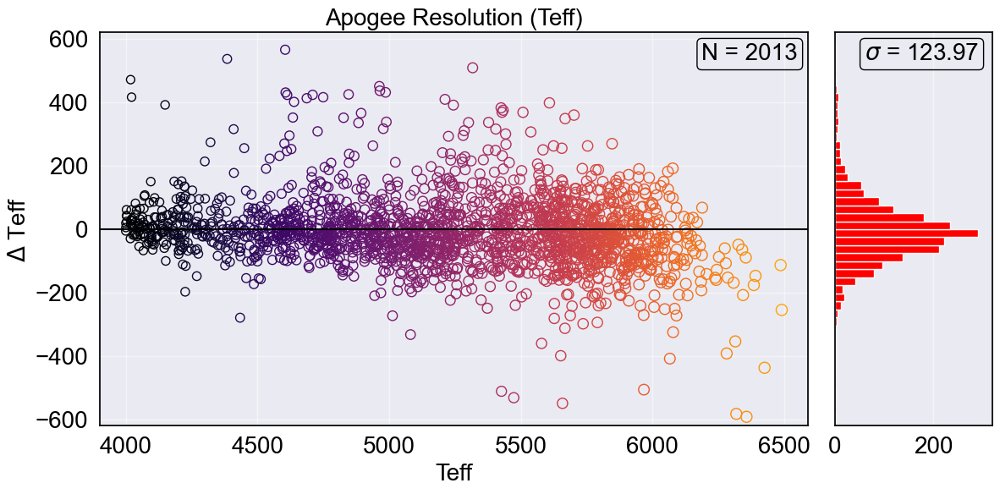

In [7]:
name = 'Teff'
x = padrao['TEFF']
y = padrao['TEFF_PredictDecoded']

y = y - x

qtd = padrao.shape[0]

tamFonte = 20

desvio = np.std(y)

fig = plt.figure(figsize=(12, 6))

# Define the grid spec layout
gs = gridspec.GridSpec(1, 5)  # 1 row, 5 columns

# Main plot (takes 4/5 of the space)
ax = fig.add_subplot(gs[:, :4])  # Span all rows, and first 4 columns
ax.scatter(x, y, edgecolors=plt.cm.inferno(padrao['colors']), s=(padrao['sizes']+1) * 50, alpha=1, marker='o', facecolors='none')
ax.set_xlabel(f"{name}", color='black', fontsize=tamFonte)
ax.set_ylabel(f"$\Delta$ {name}", color='black', fontsize=tamFonte)

plt.title(f'{base_name} ({name})', color='black', fontsize=tamFonte)

# Possiveis Mudanças
ax.plot([2000,7500], [0,0], color='black', linestyle='solid')

Ylim = 5*desvio
plt.xlim(x.min()-100, x.max()+100)
plt.ylim(-Ylim, Ylim)

# Subplot on the right (takes 1/5 of the space)
ax2 = fig.add_subplot(gs[:, 4])  # Span all rows, and the fifth column
sla = ax2.hist(y, bins = 100, orientation='horizontal', color='red', alpha=1)
ax2.get_yaxis().set_visible(False)

# Possiveis Mudanças
ax2.set_xlim(0, sla[0].max()*1.1)
ax2.set_ylim(-Ylim, Ylim)

ax.tick_params(axis='both', colors='black', labelsize=tamFonte)
for spine in ax.spines.values():
    spine.set_edgecolor('black')
ax.grid(True, alpha=0.5)

ax2.tick_params(axis='both', colors='black', labelsize=tamFonte)
for spine in ax2.spines.values():
    spine.set_edgecolor('black')
ax2.grid(True, alpha=0.5)

# Possiveis Mudanças
ax.text(0.85, 0.93, f'N = {qtd}', transform=ax.transAxes, color='black', fontsize=tamFonte, bbox=dict(facecolor='none', edgecolor='black', boxstyle='round,pad=0.2'))
ax2.text(1.08, 0.93, "$\sigma$ = {:.2f}".format(desvio), transform=ax.transAxes, color='black', fontsize=tamFonte, bbox=dict(facecolor='none', edgecolor='black', boxstyle='round,pad=0.2'))

plt.tight_layout()

# Mudar nome
fig.savefig(f"E:\\IC\\Plots\\{NomeBase}\\{name.replace(' ', '')}-{base_sigla}-{AouG}.png", 
            dpi = 300, bbox_inches="tight")

plt.show()

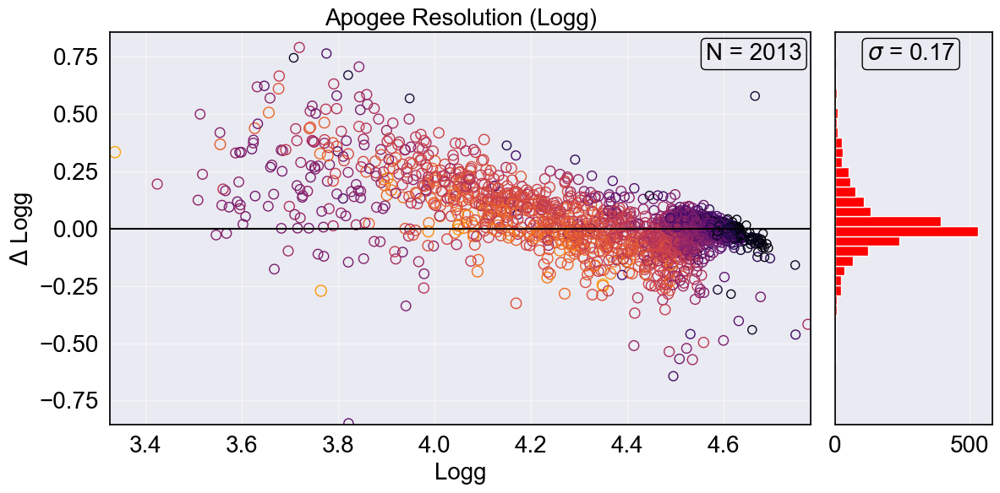

In [8]:
name = 'Logg'
x = padrao['LOGG']
y = padrao['LOGG_Predict']

y = y - x

qtd = padrao.shape[0]

tamFonte = 20

desvio = np.std(y)

fig = plt.figure(figsize=(12, 6))

# Define the grid spec layout
gs = gridspec.GridSpec(1, 5)  # 1 row, 5 columns

# Main plot (takes 4/5 of the space)
ax = fig.add_subplot(gs[:, :4])  # Span all rows, and first 4 columns
ax.scatter(x, y, edgecolors=plt.cm.inferno(padrao['colors']), s=(padrao['sizes']+1) * 50, alpha=1, marker='o', facecolors='none')
ax.set_xlabel(f"{name}", color='black', fontsize=tamFonte)
ax.set_ylabel(f"$\Delta$ {name}", color='black', fontsize=tamFonte)

plt.title(f'{base_name} ({name})', color='black', fontsize=tamFonte)

# Possiveis Mudanças
ax.plot([-5,10], [0,0], color='black', linestyle='solid')

Ylim = 5*desvio
plt.xlim(x.min()+2.8, x.max()-0.4)
plt.ylim(-Ylim, Ylim)

# Subplot on the right (takes 1/5 of the space)
ax2 = fig.add_subplot(gs[:, 4])  # Span all rows, and the fifth column
sla = ax2.hist(y, bins = 100, orientation='horizontal', color='red', alpha=1)
ax2.get_yaxis().set_visible(False)

# Possiveis Mudanças
ax2.set_xlim(0, sla[0].max()*1.1)
ax2.set_ylim(-Ylim, Ylim)

ax.tick_params(axis='both', colors='black', labelsize=tamFonte)
for spine in ax.spines.values():
    spine.set_edgecolor('black')
ax.grid(True, alpha=0.5)

ax2.tick_params(axis='both', colors='black', labelsize=tamFonte)
for spine in ax2.spines.values():
    spine.set_edgecolor('black')
ax2.grid(True, alpha=0.5)

# Possiveis Mudanças
ax.text(0.85, 0.93, f'N = {qtd}', transform=ax.transAxes, color='black', fontsize=tamFonte, bbox=dict(facecolor='none', edgecolor='black', boxstyle='round,pad=0.2'))
ax2.text(1.08, 0.93, "$\sigma$ = {:.2f}".format(desvio), transform=ax.transAxes, color='black', fontsize=tamFonte, bbox=dict(facecolor='none', edgecolor='black', boxstyle='round,pad=0.2'))

plt.tight_layout()

# Mudar nome
fig.savefig(f"E:\\IC\\Plots\\{NomeBase}\\{name.replace(' ', '')}-{base_sigla}-{AouG}.png", 
            dpi = 300, bbox_inches="tight")

plt.show()

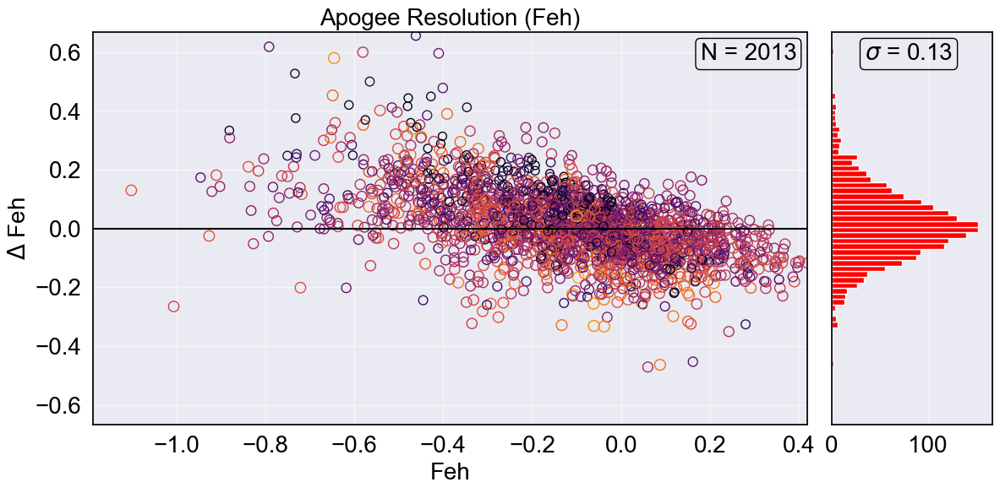

In [9]:
name = 'Feh'
x = padrao['FE_H']
y = padrao['FEH_Predict']

y = y - x

qtd = padrao.shape[0]

tamFonte = 20

desvio = np.std(y)

fig = plt.figure(figsize=(12, 6))

# Define the grid spec layout
gs = gridspec.GridSpec(1, 5)  # 1 row, 5 columns

# Main plot (takes 4/5 of the space)
ax = fig.add_subplot(gs[:, :4])  # Span all rows, and first 4 columns
ax.scatter(x, y, edgecolors=plt.cm.inferno(padrao['colors']), s=(padrao['sizes']+1) * 50, alpha=1, marker='o', facecolors='none')
ax.set_xlabel(f"{name}", color='black', fontsize=tamFonte)
ax.set_ylabel(f"$\Delta$ {name}", color='black', fontsize=tamFonte)

plt.title(f'{base_name} ({name})', color='black', fontsize=tamFonte)

# Possiveis Mudanças
ax.plot([-5,5], [0,0], color='black', linestyle='solid')

Ylim = 5*desvio
plt.xlim(x.min()+1, x.max())
plt.ylim(-Ylim, Ylim)

# Subplot on the right (takes 1/5 of the space)
ax2 = fig.add_subplot(gs[:, 4])  # Span all rows, and the fifth column
sla = ax2.hist(y, bins = 100, orientation='horizontal', color='red', alpha=1)
ax2.get_yaxis().set_visible(False)

# Possiveis Mudanças
ax2.set_xlim(0, sla[0].max()*1.1)
ax2.set_ylim(-Ylim, Ylim)

ax.tick_params(axis='both', colors='black', labelsize=tamFonte)
for spine in ax.spines.values():
    spine.set_edgecolor('black')
ax.grid(True, alpha=0.5)

ax2.tick_params(axis='both', colors='black', labelsize=tamFonte)
for spine in ax2.spines.values():
    spine.set_edgecolor('black')
ax2.grid(True, alpha=0.5)

# Possiveis Mudanças
ax.text(0.85, 0.93, f'N = {qtd}', transform=ax.transAxes, color='black', fontsize=tamFonte, bbox=dict(facecolor='none', edgecolor='black', boxstyle='round,pad=0.2'))
ax2.text(1.08, 0.93, "$\sigma$ = {:.2f}".format(desvio), transform=ax.transAxes, color='black', fontsize=tamFonte, bbox=dict(facecolor='none', edgecolor='black', boxstyle='round,pad=0.2'))

plt.tight_layout()

# Mudar nome
fig.savefig(f"E:\\IC\\Plots\\{NomeBase}\\{name.replace(' ', '')}-{base_sigla}-{AouG}.png", 
            dpi = 300, bbox_inches="tight")

plt.show()

#### Other Parameters

In [10]:
padrao = pd.read_csv(f"E:\\IC\\PredictsTreinos\\{NomeBase}\\{AouG}-OthersPredict.csv", index_col = 'ID')

In [11]:
padrao

,TEFF,LOGG,FE_H,ALPHA_M,C_FE,CA_FE,N_FE,NI_FE,MG_FE,SI_FE,Alpha_Predict,C_Predict,CA_Predict,N_Predict,MG_Predict,NI_Predict,SI_Predict
ID,,,,,,,,,,,,,,,,,
iDR4_3_SPLUS-s24s56_0018245,4980.4740,4.530492,0.251780,-0.006163,0.008195,-0.081793,0.227130,0.078970,0.071862,0.051422,0.013238,0.003613,-0.007729,0.178926,0.038782,0.031123,0.031538
iDR4_3_STRIPE82-0062_0029486,6004.6694,4.271275,-0.134030,0.003117,-0.080919,0.017574,0.359490,0.038363,0.025431,0.078439,0.052342,0.064662,0.047350,0.144280,0.105257,0.013231,0.139422
iDR4_3_SPLUS-n02s23_0016665,4625.6675,4.588470,0.016982,0.010345,0.004263,-0.032570,0.086852,0.050571,-0.018067,-0.010329,0.032989,-0.024999,0.001128,0.038281,0.019326,0.013291,0.011491
iDR4_3_MC0007_0170355,5263.0440,4.539022,-0.095235,-0.018563,-0.110443,-0.012167,-0.219973,-0.005095,0.006520,0.018605,0.045054,-0.004215,0.019060,-0.009091,0.100378,0.028954,0.078932
iDR4_3_STRIPE82-0069_0040230,5568.1885,4.432549,0.161560,-0.004485,0.030763,-0.041434,0.143860,0.040400,0.035464,0.053255,0.004100,-0.038550,-0.020632,0.142080,0.020763,0.024757,0.076770
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
iDR4_3_SPLUS-n09s40_0048133,5863.7676,4.238569,-0.040888,0.009044,-0.019940,-0.095936,-0.186643,0.042435,0.022663,0.067912,0.014496,-0.042479,-0.009442,0.129498,0.023386,0.016800,0.084650
iDR4_3_SPLUS-s02s12_0018608,5829.5420,4.448620,-0.260380,0.027761,-0.081187,-0.027008,0.333480,0.002580,0.029521,0.090173,0.099631,0.067774,0.076342,-0.011145,0.188046,0.022872,0.141458
iDR4_3_MC0023_0006367,5202.6094,4.502508,0.139140,0.015770,-0.005522,-0.051787,0.124270,0.008400,0.065302,0.092573,0.001327,-0.019694,-0.021999,0.196316,0.038047,0.029521,0.063775


In [12]:
for i in padrao:
    print(i)

TEFF
LOGG
FE_H
ALPHA_M
C_FE
CA_FE
N_FE
NI_FE
MG_FE
SI_FE
Alpha_Predict
C_Predict
CA_Predict
N_Predict
MG_Predict
NI_Predict
SI_Predict


In [13]:
scaler = MinMaxScaler(feature_range=(0, 0.8))
cores = scaler.fit_transform(np.array(padrao[["TEFF"]]))
padrao['colors'] = cores

In [14]:
scalersize = MinMaxScaler(feature_range=(0, 1))
sizes = scalersize.fit_transform(np.array(padrao[["LOGG"]]))
padrao['sizes'] = cores

In [15]:
names = ["H$\\alpha$", "C", "CA", "N", "MG", "SI", "NI"]
Parametros = ["Alpha", "C", "CA", "N", "MG", "SI", "NI"]
columnTrain = ['ALPHA_M', 'C_FE', 'CA_FE', 'N_FE', 'MG_FE', 'SI_FE', 'NI_FE']
predicts = ["Alpha_Predict", "C_Predict", "CA_Predict", "N_Predict", "MG_Predict", "SI_Predict", "NI_Predict"]

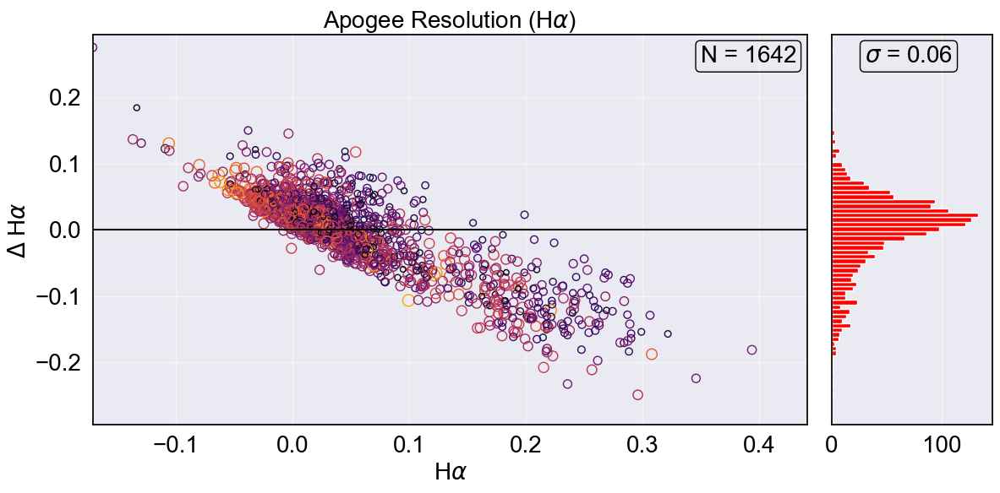

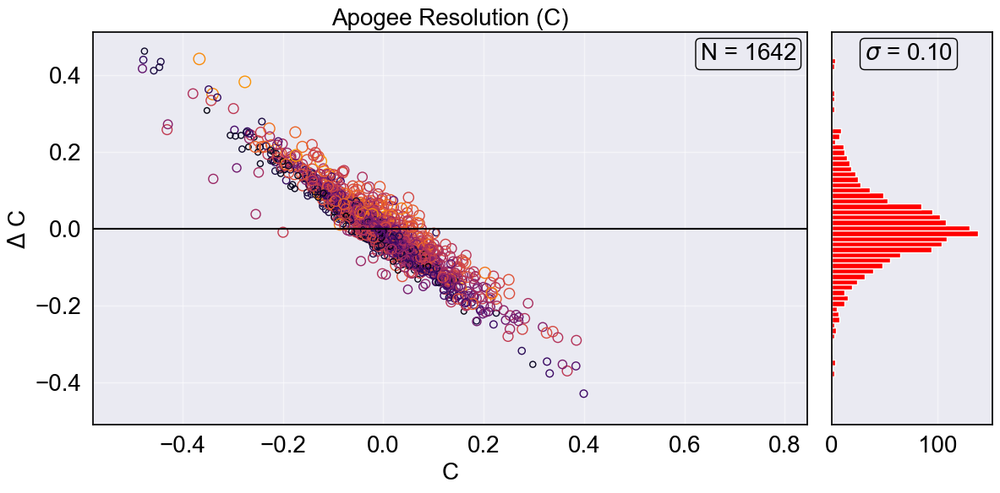

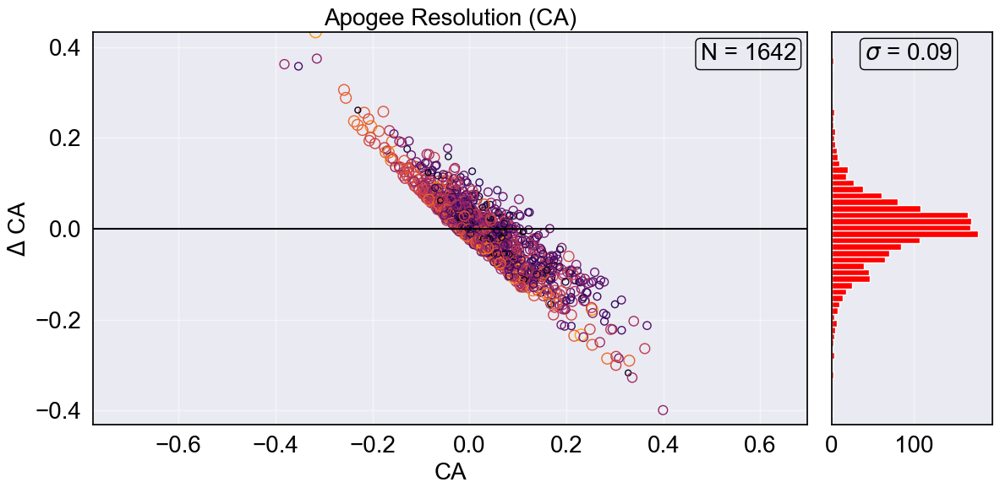

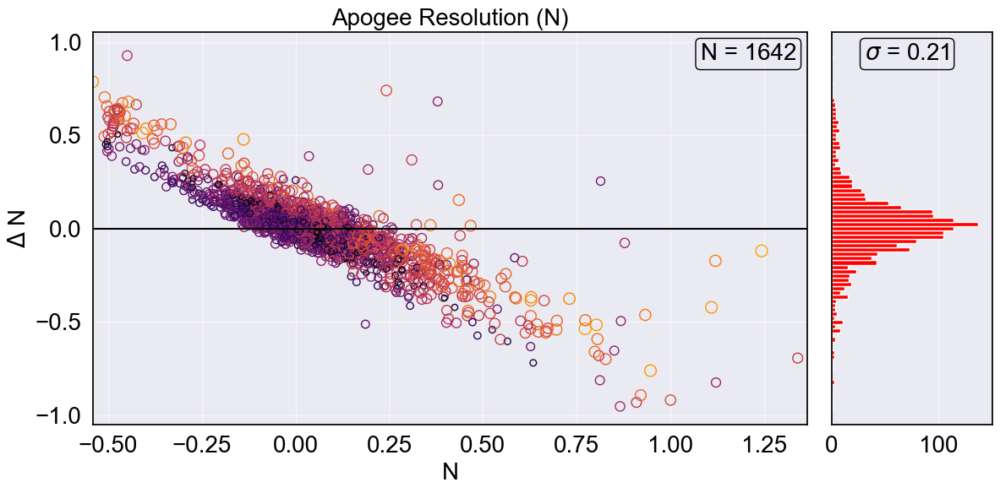

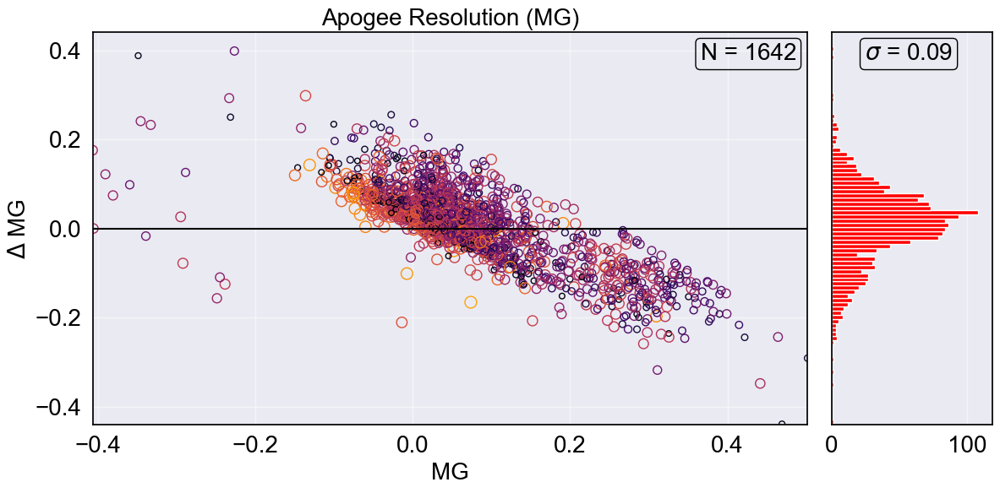

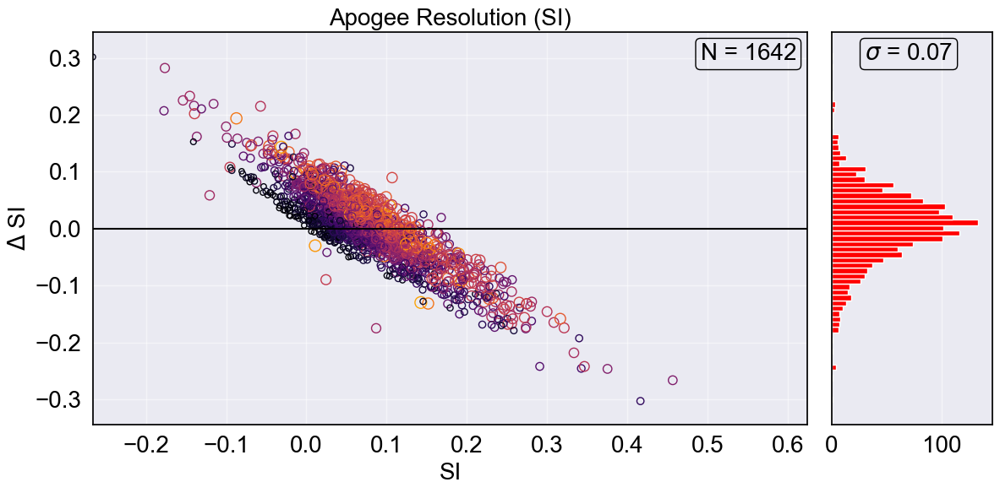

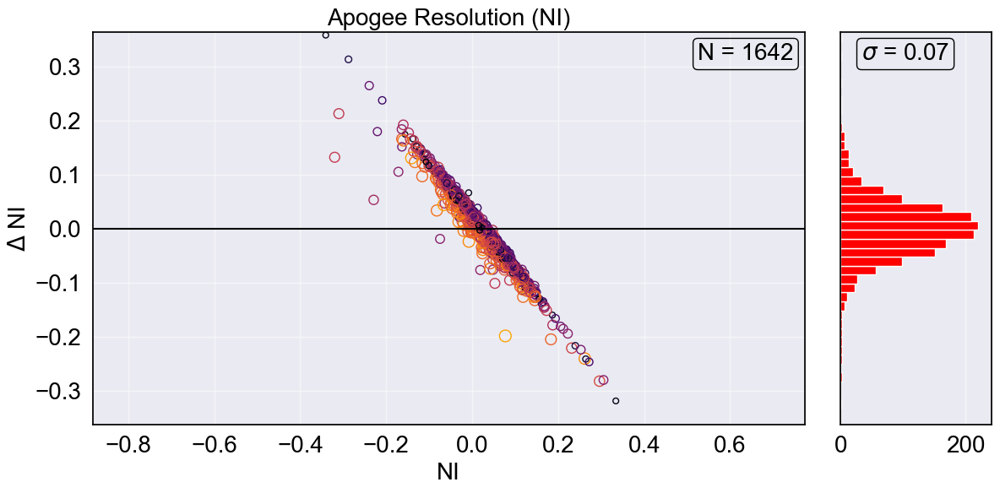

In [16]:
for i in range(len(Parametros)):
    name = names[i]
    name1 = Parametros[i]
    x = padrao[columnTrain[i]]
    y = padrao[predicts[i]]
    
    y = y - x

    qtd = padrao.shape[0]

    tamFonte = 20

    desvio = np.std(y)

    fig = plt.figure(figsize=(12, 6))

    # Define the grid spec layout
    gs = gridspec.GridSpec(1, 5)  # 1 row, 5 columns

    # Main plot (takes 4/5 of the space)
    ax = fig.add_subplot(gs[:, :4])  # Span all rows, and first 4 columns
    ax.scatter(x, y, edgecolors=plt.cm.inferno(padrao['colors']), s=(padrao['sizes']+0.2) * 100, alpha=1, marker='o', facecolors='none')
    ax.set_xlabel(f"{name}", color='black', fontsize=tamFonte)
    ax.set_ylabel(f"$\Delta$ {name}", color='black', fontsize=tamFonte)

    plt.title(f'{base_name} ({name})', color='black', fontsize=tamFonte)

    # Possiveis Mudanças
    ax.plot([-5,5], [0,0], color='black', linestyle='solid')

    Ylim = 5*desvio
    plt.xlim(x.min(), x.max())
    plt.ylim(-Ylim, Ylim)

    # Subplot on the right (takes 1/5 of the space)
    ax2 = fig.add_subplot(gs[:, 4])  # Span all rows, and the fifth column
    sla = ax2.hist(y, bins = 100, orientation='horizontal', color='red', alpha=1)
    ax2.get_yaxis().set_visible(False)

    # Possiveis Mudanças
    ax2.set_xlim(0, sla[0].max()*1.1)
    ax2.set_ylim(-Ylim, Ylim)

    ax.tick_params(axis='both', colors='black', labelsize=tamFonte)
    for spine in ax.spines.values():
        spine.set_edgecolor('black')
    ax.grid(True, alpha=0.5)

    ax2.tick_params(axis='both', colors='black', labelsize=tamFonte)
    for spine in ax2.spines.values():
        spine.set_edgecolor('black')
    ax2.grid(True, alpha=0.5)

    # Possiveis Mudanças
    ax.text(0.85, 0.93, f'N = {qtd}', transform=ax.transAxes, color='black', fontsize=tamFonte, bbox=dict(facecolor='none', edgecolor='black', boxstyle='round,pad=0.2'))
    ax2.text(1.08, 0.93, "$\sigma$ = {:.2f}".format(desvio), transform=ax.transAxes, color='black', fontsize=tamFonte, bbox=dict(facecolor='none', edgecolor='black', boxstyle='round,pad=0.2'))

    plt.tight_layout()

    # Mudar nome
    fig.savefig(f"E:\\IC\\Plots\\{NomeBase}\\{name1.replace(' ', '')}-{base_sigla}-{AouG}.png", 
                dpi = 300, bbox_inches="tight")

    plt.show()

### Giants

#### TEFF | LOGG | FEH

In [17]:
base_sigla = 'Apogee'
base_name = 'Apogee Resolution'
NomeBase = "Apogee"
AouG = 'Giants'

In [18]:
padrao = pd.read_csv(f"E:\\IC\\PredictsTreinos\\{NomeBase}\\{AouG}-TLFPredict.csv", index_col = 'ID')

In [19]:
padrao

,TEFF,LOGG,FE_H,ALPHA_M,C_FE,CA_FE,N_FE,NI_FE,MG_FE,SI_FE,teffEncoded,TEFF_PredictDecoded,LOGG_Predict,FEH_Predict
ID,,,,,,,,,,,,,,
iDR4_3_SPLUS-n03s27_0032475,4968.9575,3.499836,-0.13930,0.063180,0.019801,0.037530,-0.040810,0.082693,0.070469,0.071169,0.189031,4985.5635,3.285637,-0.245848
iDR4_3_MC0039_0059996,5036.2837,0.958078,-0.33067,-0.090185,-0.061500,-0.016914,0.106409,-0.136178,-0.247647,-0.135539,0.271651,4376.1294,0.988627,-0.739374
iDR4_3_MC0088_0081306,4241.4050,0.842196,-0.45220,-0.020276,-0.224530,0.019515,0.428760,-0.134018,-0.060797,-0.041232,-0.703786,4095.4636,0.612871,-0.584498
iDR4_3_STRIPE82-0027_0016524,4898.5264,3.292324,-0.49592,0.234975,0.060370,0.125245,-0.049681,0.087313,0.341903,0.219341,0.102602,4979.3745,3.212548,-0.464632
iDR4_3_MC0033_0099212,4021.8293,0.732756,-0.52629,0.047483,-0.256440,0.071557,0.388420,-0.063528,0.066256,-0.040461,-0.973239,4085.8280,0.804470,-0.739337
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
iDR4_3_SPLUS-n01s01_0018751,4933.5410,3.121230,-0.47415,0.304295,0.022824,0.234555,0.053336,0.156983,0.385843,0.270301,0.145570,4932.4863,3.165919,-0.464082
iDR4_3_MC0060_0023070,4163.1875,1.666220,-0.29829,0.248745,0.175840,0.104425,0.216290,0.092123,0.320533,0.192921,-0.799771,4861.8325,1.955159,-0.744949
iDR4_3_MC0093_0130092,4045.4524,0.811104,-0.94225,0.069376,-0.428490,0.103165,0.043789,-0.093957,0.064115,0.031475,-0.944250,4067.0354,0.816265,-0.994857


In [20]:
scaler = MinMaxScaler(feature_range=(0, 0.8))
cores = scaler.fit_transform(np.array(padrao[["TEFF"]]))
padrao['colors'] = cores

In [21]:
scalersize = MinMaxScaler(feature_range=(0, 1))
sizes = scalersize.fit_transform(np.array(padrao[["LOGG"]]))
padrao['sizes'] = cores

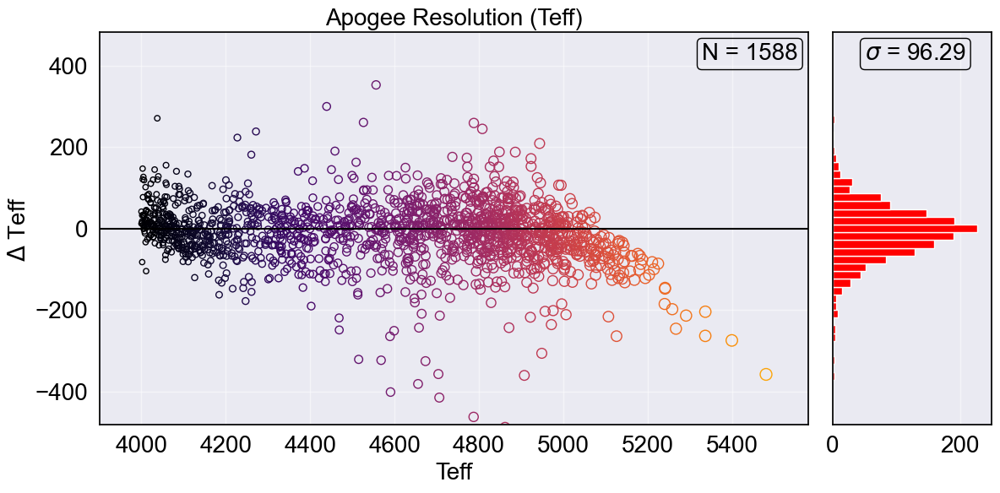

In [22]:
name = 'Teff'
x = padrao['TEFF']
y = padrao['TEFF_PredictDecoded']

y = y - x

qtd = padrao.shape[0]

tamFonte = 20

desvio = np.std(y)

fig = plt.figure(figsize=(12, 6))

# Define the grid spec layout
gs = gridspec.GridSpec(1, 5)  # 1 row, 5 columns

# Main plot (takes 4/5 of the space)
ax = fig.add_subplot(gs[:, :4])  # Span all rows, and first 4 columns
ax.scatter(x, y, edgecolors=plt.cm.inferno(padrao['colors']), s=(padrao['sizes']+0.2) * 100, alpha=1, marker='o', facecolors='none')
ax.set_xlabel(f"{name}", color='black', fontsize=tamFonte)
ax.set_ylabel(f"$\Delta$ {name}", color='black', fontsize=tamFonte)

plt.title(f'{base_name} ({name})', color='black', fontsize=tamFonte)

# Possiveis Mudanças
ax.plot([2000,7500], [0,0], color='black', linestyle='solid')

Ylim = 5*desvio
plt.xlim(x.min()-100, x.max()+100)
plt.ylim(-Ylim, Ylim)

# Subplot on the right (takes 1/5 of the space)
ax2 = fig.add_subplot(gs[:, 4])  # Span all rows, and the fifth column
sla = ax2.hist(y, bins = 100, orientation='horizontal', color='red', alpha=1)
ax2.get_yaxis().set_visible(False)

# Possiveis Mudanças
ax2.set_xlim(0, sla[0].max()*1.1)
ax2.set_ylim(-Ylim, Ylim)

ax.tick_params(axis='both', colors='black', labelsize=tamFonte)
for spine in ax.spines.values():
    spine.set_edgecolor('black')
ax.grid(True, alpha=0.5)

ax2.tick_params(axis='both', colors='black', labelsize=tamFonte)
for spine in ax2.spines.values():
    spine.set_edgecolor('black')
ax2.grid(True, alpha=0.5)

# Possiveis Mudanças
ax.text(0.85, 0.93, f'N = {qtd}', transform=ax.transAxes, color='black', fontsize=tamFonte, bbox=dict(facecolor='none', edgecolor='black', boxstyle='round,pad=0.2'))
ax2.text(1.08, 0.93, "$\sigma$ = {:.2f}".format(desvio), transform=ax.transAxes, color='black', fontsize=tamFonte, bbox=dict(facecolor='none', edgecolor='black', boxstyle='round,pad=0.2'))

plt.tight_layout()

# Mudar nome
fig.savefig(f"E:\\IC\\Plots\\{NomeBase}\\{name.replace(' ', '')}-{base_sigla}-{AouG}.png", 
            dpi = 300, bbox_inches="tight")

plt.show()

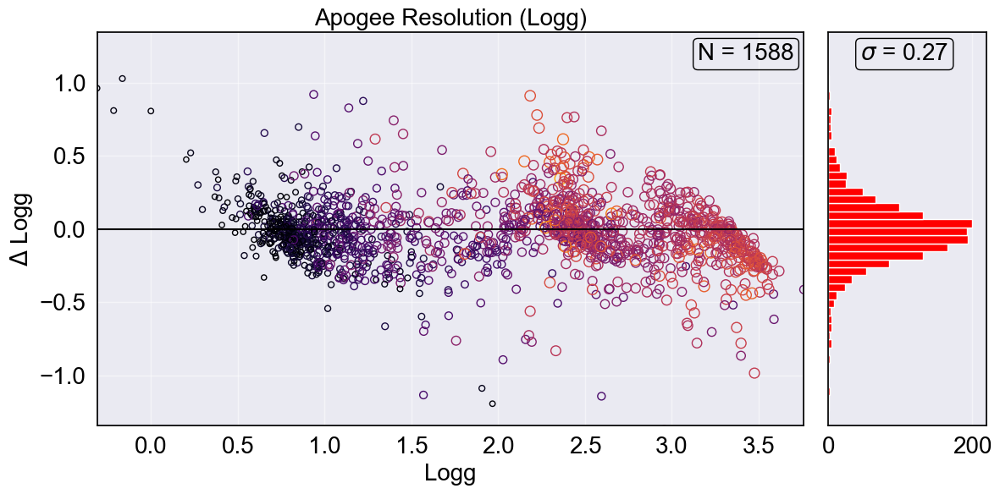

In [23]:
name = 'Logg'
x = padrao['LOGG']
y = padrao['LOGG_Predict']

y = y - x

qtd = padrao.shape[0]

tamFonte = 20

desvio = np.std(y)

fig = plt.figure(figsize=(12, 6))

# Define the grid spec layout
gs = gridspec.GridSpec(1, 5)  # 1 row, 5 columns

# Main plot (takes 4/5 of the space)
ax = fig.add_subplot(gs[:, :4])  # Span all rows, and first 4 columns
ax.scatter(x, y, edgecolors=plt.cm.inferno(padrao['colors']), s=(padrao['sizes']+0.2) * 100, alpha=1, marker='o', facecolors='none')
ax.set_xlabel(f"{name}", color='black', fontsize=tamFonte)
ax.set_ylabel(f"$\Delta$ {name}", color='black', fontsize=tamFonte)

plt.title(f'{base_name} ({name})', color='black', fontsize=tamFonte)

# Possiveis Mudanças
ax.plot([-5,10], [0,0], color='black', linestyle='solid')

Ylim = 5*desvio
plt.xlim(x.min(), x.max())
plt.ylim(-Ylim, Ylim)

# Subplot on the right (takes 1/5 of the space)
ax2 = fig.add_subplot(gs[:, 4])  # Span all rows, and the fifth column
sla = ax2.hist(y, bins = 100, orientation='horizontal', color='red', alpha=1)
ax2.get_yaxis().set_visible(False)

# Possiveis Mudanças
ax2.set_xlim(0, sla[0].max()*1.1)
ax2.set_ylim(-Ylim, Ylim)

ax.tick_params(axis='both', colors='black', labelsize=tamFonte)
for spine in ax.spines.values():
    spine.set_edgecolor('black')
ax.grid(True, alpha=0.5)

ax2.tick_params(axis='both', colors='black', labelsize=tamFonte)
for spine in ax2.spines.values():
    spine.set_edgecolor('black')
ax2.grid(True, alpha=0.5)

# Possiveis Mudanças
ax.text(0.85, 0.93, f'N = {qtd}', transform=ax.transAxes, color='black', fontsize=tamFonte, bbox=dict(facecolor='none', edgecolor='black', boxstyle='round,pad=0.2'))
ax2.text(1.08, 0.93, "$\sigma$ = {:.2f}".format(desvio), transform=ax.transAxes, color='black', fontsize=tamFonte, bbox=dict(facecolor='none', edgecolor='black', boxstyle='round,pad=0.2'))

plt.tight_layout()

# Mudar nome
fig.savefig(f"E:\\IC\\Plots\\{NomeBase}\\{name.replace(' ', '')}-{base_sigla}-{AouG}.png", 
            dpi = 300, bbox_inches="tight")

plt.show()

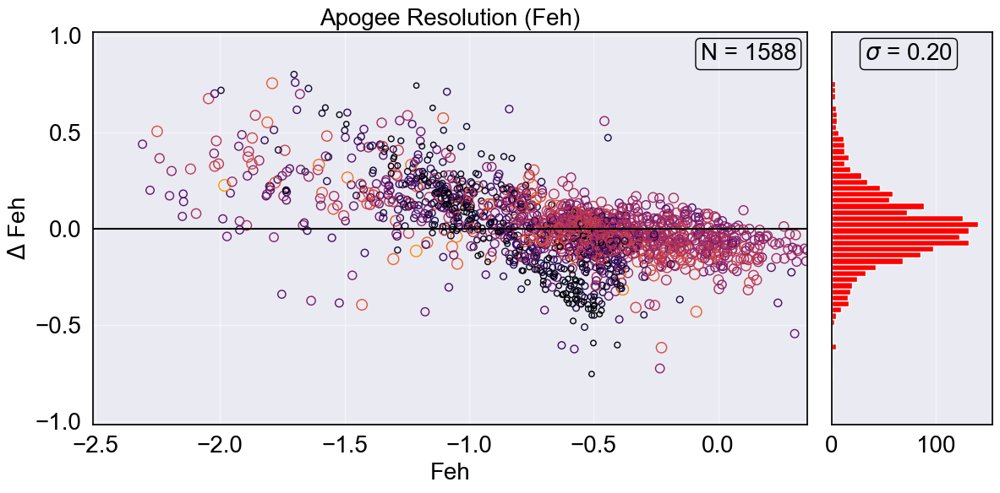

In [24]:
name = 'Feh'
x = padrao['FE_H']
y = padrao['FEH_Predict']

y = y - x

qtd = padrao.shape[0]

tamFonte = 20

desvio = np.std(y)

fig = plt.figure(figsize=(12, 6))

# Define the grid spec layout
gs = gridspec.GridSpec(1, 5)  # 1 row, 5 columns

# Main plot (takes 4/5 of the space)
ax = fig.add_subplot(gs[:, :4])  # Span all rows, and first 4 columns
ax.scatter(x, y, edgecolors=plt.cm.inferno(padrao['colors']), s=(padrao['sizes']+0.2) * 100, alpha=1, marker='o', facecolors='none')
ax.set_xlabel(f"{name}", color='black', fontsize=tamFonte)
ax.set_ylabel(f"$\Delta$ {name}", color='black', fontsize=tamFonte)

plt.title(f'{base_name} ({name})', color='black', fontsize=tamFonte)

# Possiveis Mudanças
ax.plot([-5,5], [0,0], color='black', linestyle='solid')

Ylim = 5*desvio
plt.xlim(x.min()-0.2, x.max())
plt.ylim(-Ylim, Ylim)

# Subplot on the right (takes 1/5 of the space)
ax2 = fig.add_subplot(gs[:, 4])  # Span all rows, and the fifth column
sla = ax2.hist(y, bins = 100, orientation='horizontal', color='red', alpha=1)
ax2.get_yaxis().set_visible(False)

# Possiveis Mudanças
ax2.set_xlim(0, sla[0].max()*1.1)
ax2.set_ylim(-Ylim, Ylim)

ax.tick_params(axis='both', colors='black', labelsize=tamFonte)
for spine in ax.spines.values():
    spine.set_edgecolor('black')
ax.grid(True, alpha=0.5)

ax2.tick_params(axis='both', colors='black', labelsize=tamFonte)
for spine in ax2.spines.values():
    spine.set_edgecolor('black')
ax2.grid(True, alpha=0.5)

# Possiveis Mudanças
ax.text(0.85, 0.93, f'N = {qtd}', transform=ax.transAxes, color='black', fontsize=tamFonte, bbox=dict(facecolor='none', edgecolor='black', boxstyle='round,pad=0.2'))
ax2.text(1.08, 0.93, "$\sigma$ = {:.2f}".format(desvio), transform=ax.transAxes, color='black', fontsize=tamFonte, bbox=dict(facecolor='none', edgecolor='black', boxstyle='round,pad=0.2'))

plt.tight_layout()

# Mudar nome
fig.savefig(f"E:\\IC\\Plots\\{NomeBase}\\{name.replace(' ', '')}-{base_sigla}-{AouG}.png", 
            dpi = 300, bbox_inches="tight")

plt.show()

#### Other Parameters

In [25]:
padrao = pd.read_csv(f"E:\\IC\\PredictsTreinos\\{NomeBase}\\{AouG}-OthersPredict.csv", index_col = 'ID')

In [26]:
padrao

,TEFF,LOGG,FE_H,ALPHA_M,C_FE,CA_FE,N_FE,NI_FE,MG_FE,SI_FE,Alpha_Predict,C_Predict,CA_Predict,N_Predict,MG_Predict,NI_Predict,SI_Predict
ID,,,,,,,,,,,,,,,,,
iDR4_3_MC0094_0171878,4288.4650,0.816329,-0.874430,-0.050598,-0.373150,0.082272,0.225710,-0.106878,-0.108357,-0.049973,-0.004424,-0.336029,0.065167,0.335727,-0.037674,-0.086774,-0.004354
iDR4_3_SPLUS-n05n53_0020097,4745.7180,2.855237,-0.035345,0.108599,0.116970,0.080165,0.071023,0.019432,0.144740,0.062378,0.114926,0.048401,0.080436,0.171844,0.152049,0.058560,0.080834
iDR4_3_SPLUS-s46s29_0017550,4973.4100,3.349861,-0.147130,0.042937,0.053945,-0.011186,0.016485,0.056142,0.088306,0.016733,0.145967,0.035376,0.113434,0.068497,0.210742,0.064642,0.088980
iDR4_3_SPLUS-n09s39_0050569,4645.5024,2.786350,0.004276,0.109922,0.039711,0.065837,0.144636,0.064343,0.163329,0.064845,0.133467,0.059708,0.082447,0.153148,0.184845,0.060138,0.089767
iDR4_3_STRIPE82-0037_0009920,5039.8860,2.483387,-0.644730,0.262665,0.147950,0.152045,0.086803,0.095962,0.328323,0.262481,0.256254,0.047193,0.166598,0.010915,0.296091,0.049912,0.206384
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
iDR4_3_STRIPE82-0075_0005550,4881.4550,3.045865,-0.250150,0.107608,-0.015479,0.087145,0.039734,0.036633,0.156158,0.060104,0.231588,0.061799,0.120618,0.059214,0.275632,0.059587,0.172548
iDR4_3_SPLUS-n03s23_0031712,4836.8403,3.495177,0.099263,0.143395,0.065450,0.069100,0.028691,0.117060,0.203312,0.083162,0.126890,0.048569,0.090446,0.122147,0.187732,0.063834,0.073661
iDR4_3_SPLUS-n10s38_0052372,4940.1743,2.486235,-0.501270,0.247435,0.100964,0.130405,0.102806,0.109592,0.300813,0.242221,0.258807,0.065912,0.161669,0.029616,0.303306,0.062500,0.211434


In [27]:
for i in padrao:
    print(i)

TEFF
LOGG
FE_H
ALPHA_M
C_FE
CA_FE
N_FE
NI_FE
MG_FE
SI_FE
Alpha_Predict
C_Predict
CA_Predict
N_Predict
MG_Predict
NI_Predict
SI_Predict


In [28]:
scaler = MinMaxScaler(feature_range=(0, 0.8))
cores = scaler.fit_transform(np.array(padrao[["TEFF"]]))
padrao['colors'] = cores

In [29]:
scalersize = MinMaxScaler(feature_range=(0, 1))
sizes = scalersize.fit_transform(np.array(padrao[["LOGG"]]))
padrao['sizes'] = cores

In [30]:
names = ["H$\\alpha$", "C", "CA", "N", "MG", "SI", "NI"]
Parametros = ["Alpha", "C", "CA", "N", "MG", "SI", "NI"]
columnTrain = ['ALPHA_M', 'C_FE', 'CA_FE', 'N_FE', 'MG_FE', 'SI_FE', 'NI_FE']
predicts = ["Alpha_Predict", "C_Predict", "CA_Predict", "N_Predict", "MG_Predict", "SI_Predict", "NI_Predict"]

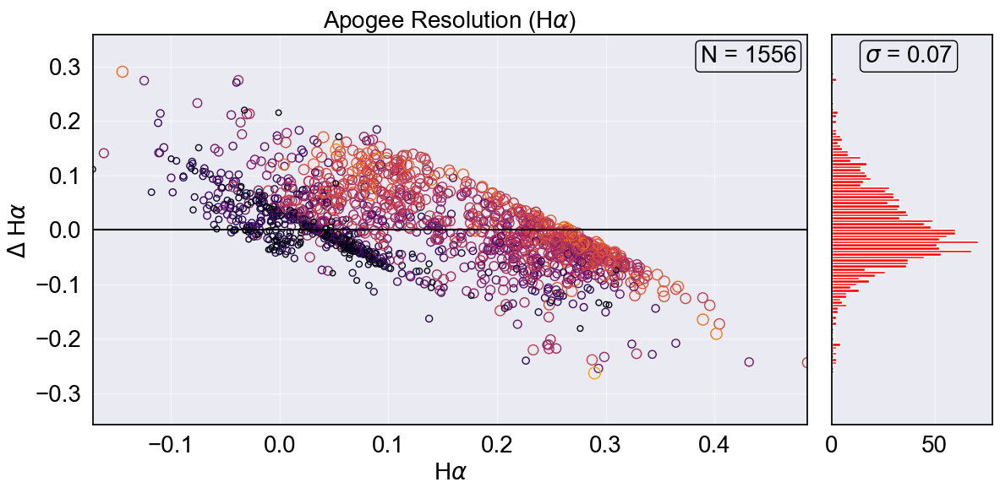

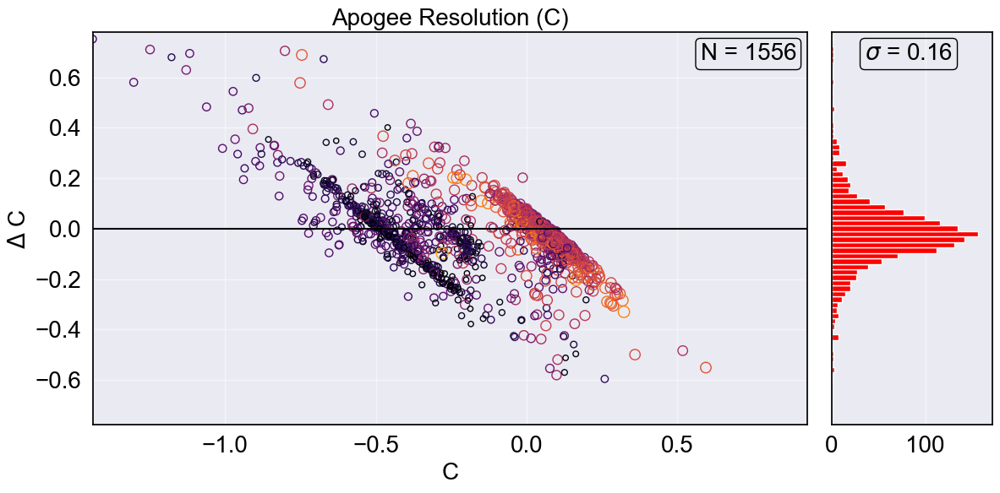

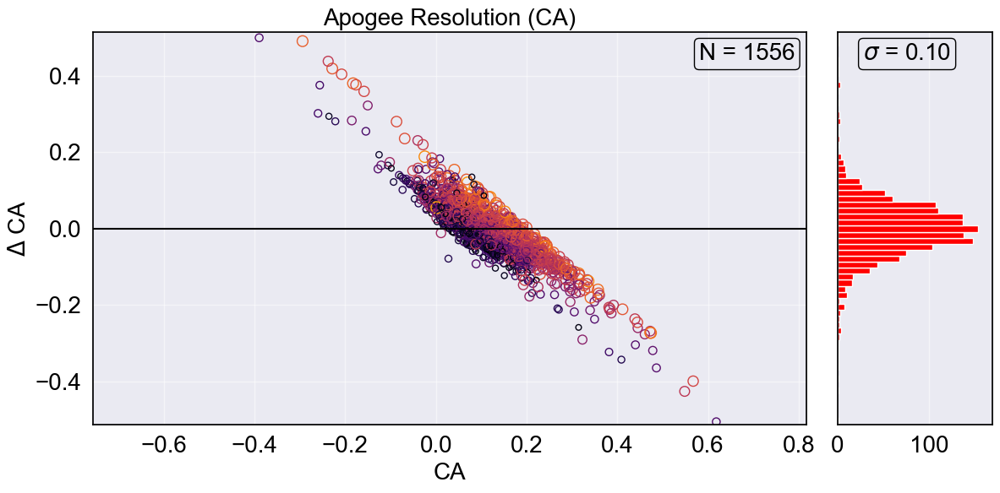

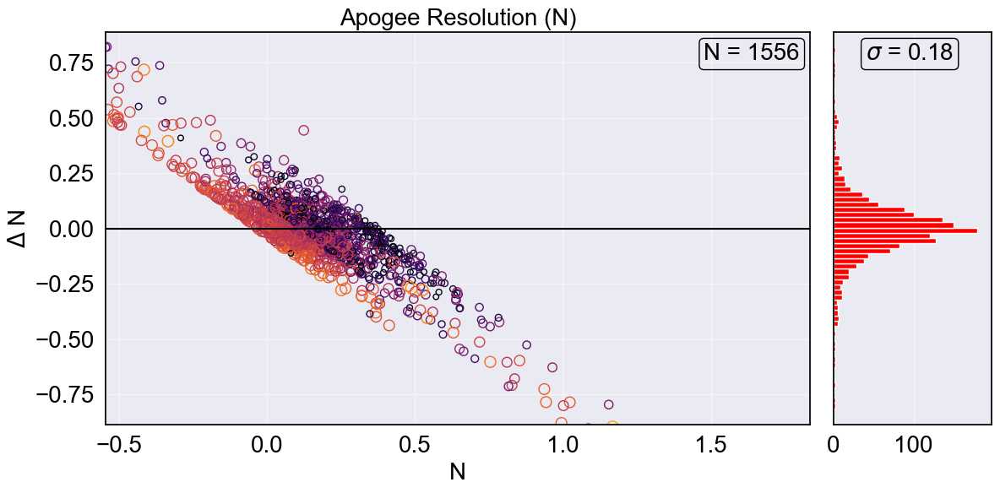

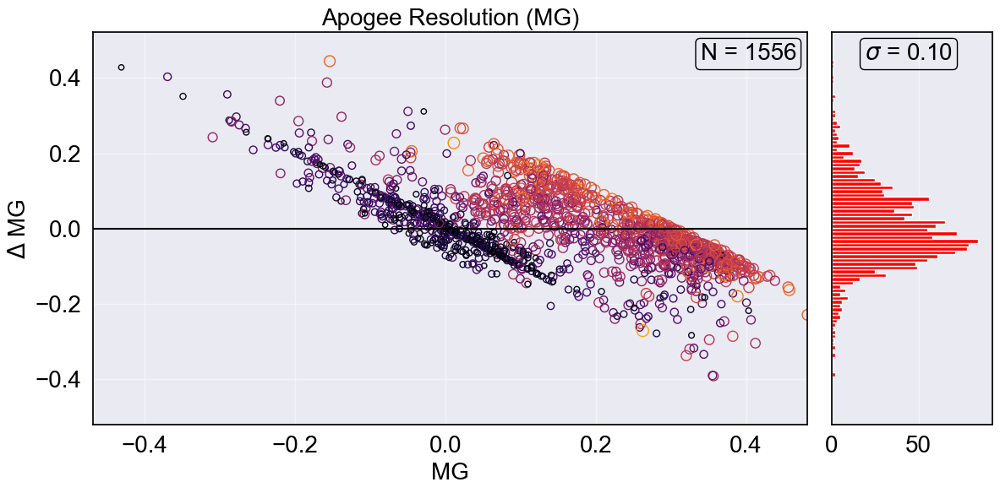

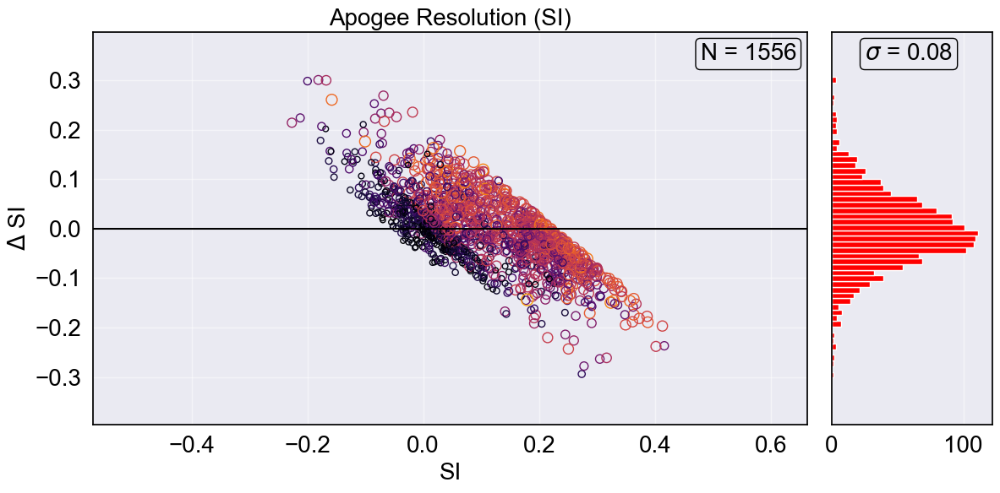

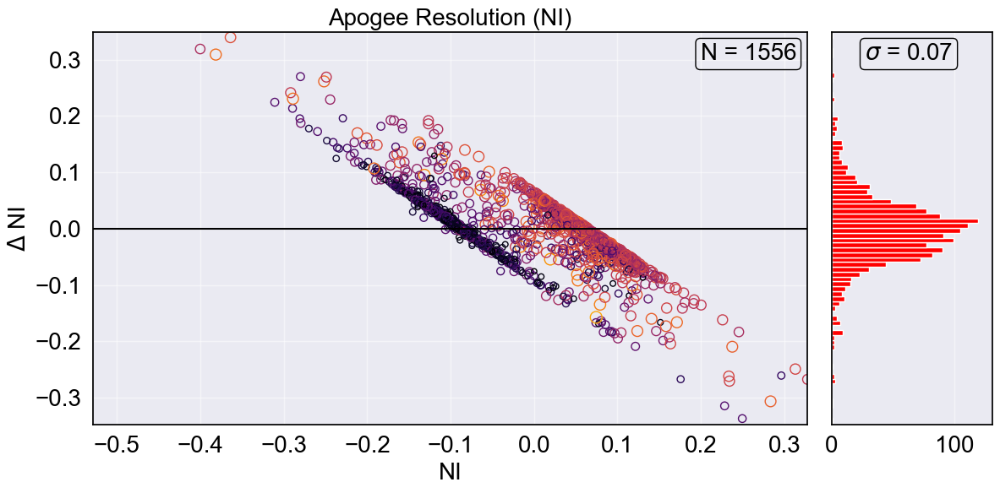

In [31]:
for i in range(len(Parametros)):
    name = names[i]
    name1 = Parametros[i]
    x = padrao[columnTrain[i]]
    y = padrao[predicts[i]]
    
    y = y - x

    qtd = padrao.shape[0]

    tamFonte = 20

    desvio = np.std(y)

    fig = plt.figure(figsize=(12, 6))

    # Define the grid spec layout
    gs = gridspec.GridSpec(1, 5)  # 1 row, 5 columns

    # Main plot (takes 4/5 of the space)
    ax = fig.add_subplot(gs[:, :4])  # Span all rows, and first 4 columns
    ax.scatter(x, y, edgecolors=plt.cm.inferno(padrao['colors']), s=(padrao['sizes']+0.2) * 100, alpha=1, marker='o', facecolors='none')
    ax.set_xlabel(f"{name}", color='black', fontsize=tamFonte)
    ax.set_ylabel(f"$\Delta$ {name}", color='black', fontsize=tamFonte)

    plt.title(f'{base_name} ({name})', color='black', fontsize=tamFonte)

    # Possiveis Mudanças
    ax.plot([-5,5], [0,0], color='black', linestyle='solid')

    Ylim = 5*desvio
    plt.xlim(x.min(), x.max())
    plt.ylim(-Ylim, Ylim)

    # Subplot on the right (takes 1/5 of the space)
    ax2 = fig.add_subplot(gs[:, 4])  # Span all rows, and the fifth column
    sla = ax2.hist(y, bins = 100, orientation='horizontal', color='red', alpha=1)
    ax2.get_yaxis().set_visible(False)

    # Possiveis Mudanças
    ax2.set_xlim(0, sla[0].max()*1.1)
    ax2.set_ylim(-Ylim, Ylim)

    ax.tick_params(axis='both', colors='black', labelsize=tamFonte)
    for spine in ax.spines.values():
        spine.set_edgecolor('black')
    ax.grid(True, alpha=0.5)

    ax2.tick_params(axis='both', colors='black', labelsize=tamFonte)
    for spine in ax2.spines.values():
        spine.set_edgecolor('black')
    ax2.grid(True, alpha=0.5)

    # Possiveis Mudanças
    ax.text(0.85, 0.93, f'N = {qtd}', transform=ax.transAxes, color='black', fontsize=tamFonte, bbox=dict(facecolor='none', edgecolor='black', boxstyle='round,pad=0.2'))
    ax2.text(1.08, 0.93, "$\sigma$ = {:.2f}".format(desvio), transform=ax.transAxes, color='black', fontsize=tamFonte, bbox=dict(facecolor='none', edgecolor='black', boxstyle='round,pad=0.2'))

    plt.tight_layout()

    # Mudar nome
    fig.savefig(f"E:\\IC\\Plots\\{NomeBase}\\{name1.replace(' ', '')}-{base_sigla}-{AouG}.png", 
                dpi = 300, bbox_inches="tight")

    plt.show()

## Galah

### Dwarfs

#### TEFF | LOGG | FEH

In [32]:
base_sigla = 'Galah'
base_name = 'Galah Resolution'
NomeBase = "Galah"
AouG = 'Dwarfs'

In [33]:
padrao = pd.read_csv(f"E:\\IC\\PredictsTreinos\\{NomeBase}\\{AouG}-TLFPredict.csv", index_col = 'ID')

In [34]:
padrao

,teff_cnn,logg_cnn,feh_cnn,alpha_m_cnn,c_fe,ca_fe,n_fe,mg_fe,si_fe,ni_fe,teffEncoded,TEFF_PredictDecoded,LOGG_Predict,FEH_Predict
ID,,,,,,,,,,,,,,
iDR4_3_STRIPE82-0024_0038417,4921.37,4.651,-0.181,0.005,-0.04975,-0.01964,-0.00570,0.00842,-0.07885,-0.04684,-0.274069,4931.5703,4.673847,-0.132259
iDR4_3_SPLUS-n06s42_0007379,6030.42,4.245,0.130,-0.008,0.01449,-0.04694,0.23062,-0.02586,0.02393,0.05594,0.624784,5892.7466,4.103360,0.025193
iDR4_3_STRIPE82-0132_0036437,5819.09,4.285,-0.549,0.182,0.20548,0.04547,0.07696,0.31184,0.16932,0.05811,0.453507,5708.6830,4.192356,-0.462627
iDR4_3_STRIPE82-0004_0008822,5544.12,4.224,-0.151,0.115,0.13684,0.03922,0.08200,0.21118,0.11384,0.07739,0.230652,5591.3420,4.186634,-0.133781
iDR4_3_SPLUS-n02s28_0005543,6092.42,4.536,-0.048,-0.021,-0.01856,-0.06742,0.27131,-0.03767,-0.01378,-0.01454,0.675033,5819.4000,4.312710,-0.117961
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
iDR4_3_STRIPE82-0004_0017908,6040.59,4.168,-0.192,0.037,0.06951,0.03663,0.05333,0.05084,0.04985,0.02317,0.633027,6141.2783,4.231275,-0.093633
iDR4_3_STRIPE82-0001_0018941,5714.94,4.069,0.052,0.003,0.01061,0.00962,0.16620,0.01764,0.01869,0.03555,0.369097,5537.8765,4.299799,-0.137520
iDR4_3_STRIPE82-0024_0032338,5304.86,4.456,-0.138,0.064,0.02239,0.06251,-0.05183,0.12319,0.02592,0.01970,0.036739,5257.6160,4.452454,-0.157098


In [35]:
scaler = MinMaxScaler(feature_range=(0, 0.8))
cores = scaler.fit_transform(np.array(padrao[["teff_cnn"]]))
padrao['colors'] = cores

In [36]:
scalersize = MinMaxScaler(feature_range=(0, 1))
sizes = scalersize.fit_transform(np.array(padrao[["logg_cnn"]]))
padrao['sizes'] = cores
padrao['sizes'].min()

0.0

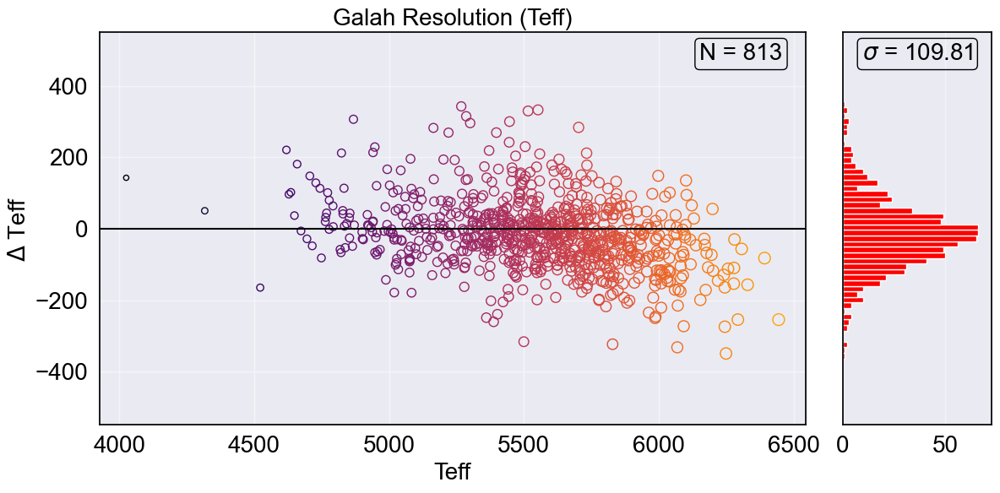

In [37]:
name = 'Teff'
x = padrao['teff_cnn']
y = padrao['TEFF_PredictDecoded']

y = y - x

qtd = padrao.shape[0]

tamFonte = 20

desvio = np.std(y)

fig = plt.figure(figsize=(12, 6))

# Define the grid spec layout
gs = gridspec.GridSpec(1, 5)  # 1 row, 5 columns

# Main plot (takes 4/5 of the space)
ax = fig.add_subplot(gs[:, :4])  # Span all rows, and first 4 columns
ax.scatter(x, y, edgecolors=plt.cm.inferno(padrao['colors']), s=(padrao['sizes']+0.2) * 100, alpha=1, marker='o', facecolors='none')
ax.set_xlabel(f"{name}", color='black', fontsize=tamFonte)
ax.set_ylabel(f"$\Delta$ {name}", color='black', fontsize=tamFonte)

plt.title(f'{base_name} ({name})', color='black', fontsize=tamFonte)

# Possiveis Mudanças
ax.plot([2000,7500], [0,0], color='black', linestyle='solid')

Ylim = 5*desvio
plt.xlim(x.min()-100, x.max()+100)
plt.ylim(-Ylim, Ylim)

# Subplot on the right (takes 1/5 of the space)
ax2 = fig.add_subplot(gs[:, 4])  # Span all rows, and the fifth column
sla = ax2.hist(y, bins = 100, orientation='horizontal', color='red', alpha=1)
ax2.get_yaxis().set_visible(False)

# Possiveis Mudanças
ax2.set_xlim(0, sla[0].max()*1.1)
ax2.set_ylim(-Ylim, Ylim)

ax.tick_params(axis='both', colors='black', labelsize=tamFonte)
for spine in ax.spines.values():
    spine.set_edgecolor('black')
ax.grid(True, alpha=0.5)

ax2.tick_params(axis='both', colors='black', labelsize=tamFonte)
for spine in ax2.spines.values():
    spine.set_edgecolor('black')
ax2.grid(True, alpha=0.5)

# Possiveis Mudanças
ax.text(0.85, 0.93, f'N = {qtd}', transform=ax.transAxes, color='black', fontsize=tamFonte, bbox=dict(facecolor='none', edgecolor='black', boxstyle='round,pad=0.2'))
ax2.text(1.08, 0.93, "$\sigma$ = {:.2f}".format(desvio), transform=ax.transAxes, color='black', fontsize=tamFonte, bbox=dict(facecolor='none', edgecolor='black', boxstyle='round,pad=0.2'))

plt.tight_layout()

# Mudar nome
fig.savefig(f"E:\\IC\\Plots\\{NomeBase}\\{name.replace(' ', '')}-{base_sigla}-{AouG}.png", 
            dpi = 300, bbox_inches="tight")

plt.show()

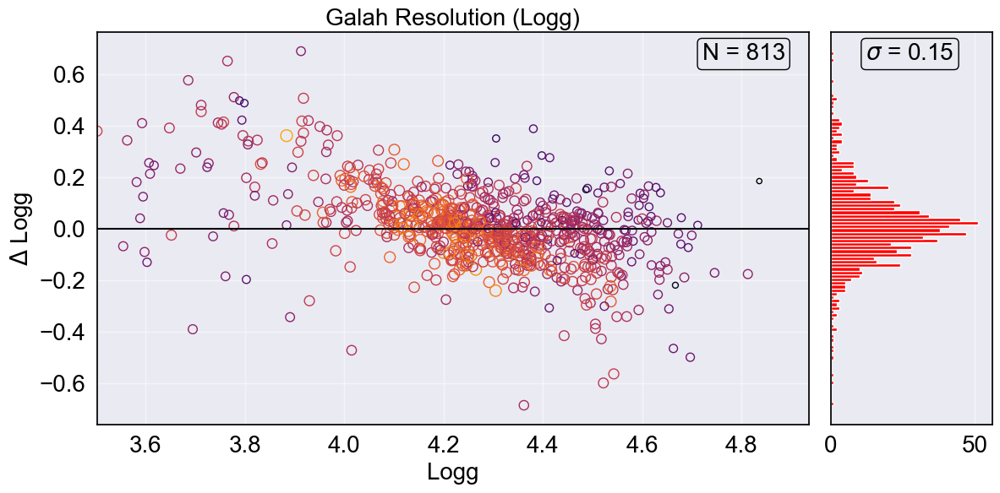

In [38]:
name = 'Logg'
x = padrao['logg_cnn']
y = padrao['LOGG_Predict']

y = y - x

qtd = padrao.shape[0]

tamFonte = 20

desvio = np.std(y)

fig = plt.figure(figsize=(12, 6))

# Define the grid spec layout
gs = gridspec.GridSpec(1, 5)  # 1 row, 5 columns

# Main plot (takes 4/5 of the space)
ax = fig.add_subplot(gs[:, :4])  # Span all rows, and first 4 columns
ax.scatter(x, y, edgecolors=plt.cm.inferno(padrao['colors']), s=(padrao['sizes']+0.2) * 100, alpha=1, marker='o', facecolors='none')
ax.set_xlabel(f"{name}", color='black', fontsize=tamFonte)
ax.set_ylabel(f"$\Delta$ {name}", color='black', fontsize=tamFonte)

plt.title(f'{base_name} ({name})', color='black', fontsize=tamFonte)

# Possiveis Mudanças
ax.plot([-5,10], [0,0], color='black', linestyle='solid')

Ylim = 5*desvio
plt.xlim(x.min(), x.max()+0.1)
plt.ylim(-Ylim, Ylim)

# Subplot on the right (takes 1/5 of the space)
ax2 = fig.add_subplot(gs[:, 4])  # Span all rows, and the fifth column
sla = ax2.hist(y, bins = 100, orientation='horizontal', color='red', alpha=1)
ax2.get_yaxis().set_visible(False)

# Possiveis Mudanças
ax2.set_xlim(0, sla[0].max()*1.1)
ax2.set_ylim(-Ylim, Ylim)

ax.tick_params(axis='both', colors='black', labelsize=tamFonte)
for spine in ax.spines.values():
    spine.set_edgecolor('black')
ax.grid(True, alpha=0.5)

ax2.tick_params(axis='both', colors='black', labelsize=tamFonte)
for spine in ax2.spines.values():
    spine.set_edgecolor('black')
ax2.grid(True, alpha=0.5)

# Possiveis Mudanças
ax.text(0.85, 0.93, f'N = {qtd}', transform=ax.transAxes, color='black', fontsize=tamFonte, bbox=dict(facecolor='none', edgecolor='black', boxstyle='round,pad=0.2'))
ax2.text(1.08, 0.93, "$\sigma$ = {:.2f}".format(desvio), transform=ax.transAxes, color='black', fontsize=tamFonte, bbox=dict(facecolor='none', edgecolor='black', boxstyle='round,pad=0.2'))

plt.tight_layout()

# Mudar nome
fig.savefig(f"E:\\IC\\Plots\\{NomeBase}\\{name.replace(' ', '')}-{base_sigla}-{AouG}.png", 
            dpi = 300, bbox_inches="tight")

plt.show()

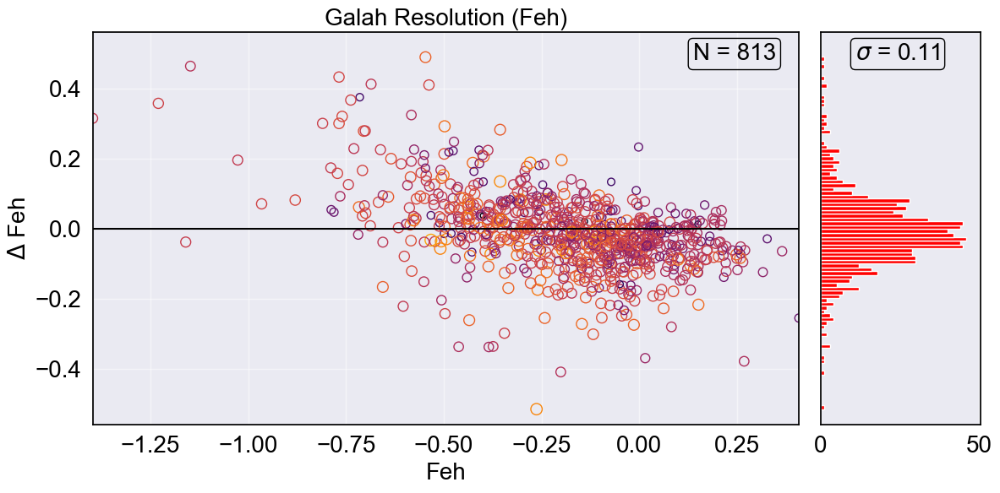

In [39]:
name = 'Feh'
x = padrao['feh_cnn']
y = padrao['FEH_Predict']

y = y - x

qtd = padrao.shape[0]

tamFonte = 20

desvio = np.std(y)

fig = plt.figure(figsize=(12, 6))

# Define the grid spec layout
gs = gridspec.GridSpec(1, 5)  # 1 row, 5 columns

# Main plot (takes 4/5 of the space)
ax = fig.add_subplot(gs[:, :4])  # Span all rows, and first 4 columns
ax.scatter(x, y, edgecolors=plt.cm.inferno(padrao['colors']), s=(padrao['sizes']+0.2) * 100, alpha=1, marker='o', facecolors='none')
ax.set_xlabel(f"{name}", color='black', fontsize=tamFonte)
ax.set_ylabel(f"$\Delta$ {name}", color='black', fontsize=tamFonte)

plt.title(f'{base_name} ({name})', color='black', fontsize=tamFonte)

# Possiveis Mudanças
ax.plot([-5,5], [0,0], color='black', linestyle='solid')

Ylim = 5*desvio
plt.xlim(x.min(), x.max())
plt.ylim(-Ylim, Ylim)

# Subplot on the right (takes 1/5 of the space)
ax2 = fig.add_subplot(gs[:, 4])  # Span all rows, and the fifth column
sla = ax2.hist(y, bins = 100, orientation='horizontal', color='red', alpha=1)
ax2.get_yaxis().set_visible(False)

# Possiveis Mudanças
ax2.set_xlim(0, sla[0].max()*1.1)
ax2.set_ylim(-Ylim, Ylim)

ax.tick_params(axis='both', colors='black', labelsize=tamFonte)
for spine in ax.spines.values():
    spine.set_edgecolor('black')
ax.grid(True, alpha=0.5)

ax2.tick_params(axis='both', colors='black', labelsize=tamFonte)
for spine in ax2.spines.values():
    spine.set_edgecolor('black')
ax2.grid(True, alpha=0.5)

# Possiveis Mudanças
ax.text(0.85, 0.93, f'N = {qtd}', transform=ax.transAxes, color='black', fontsize=tamFonte, bbox=dict(facecolor='none', edgecolor='black', boxstyle='round,pad=0.2'))
ax2.text(1.08, 0.93, "$\sigma$ = {:.2f}".format(desvio), transform=ax.transAxes, color='black', fontsize=tamFonte, bbox=dict(facecolor='none', edgecolor='black', boxstyle='round,pad=0.2'))

plt.tight_layout()

# Mudar nome
fig.savefig(f"E:\\IC\\Plots\\{NomeBase}\\{name.replace(' ', '')}-{base_sigla}-{AouG}.png", 
            dpi = 300, bbox_inches="tight")

plt.show()

#### Other Parameters

In [40]:
padrao = pd.read_csv(f"E:\\IC\\PredictsTreinos\\{NomeBase}\\{AouG}-OthersPredict.csv", index_col = 'ID')

In [41]:
padrao

,teff_cnn,logg_cnn,feh_cnn,alpha_m_cnn,c_fe,ca_fe,n_fe,mg_fe,si_fe,ni_fe,Alpha_Predict,C_Predict,CA_Predict,N_Predict,MG_Predict,SI_Predict,NI_Predict
ID,,,,,,,,,,,,,,,,,
iDR4_3_STRIPE82-0024_0038417,4921.37,4.651,-0.181,0.005,-0.04975,-0.01964,-0.00570,0.00842,-0.07885,-0.04684,0.020599,-0.050352,0.027024,-0.064223,-0.001706,-0.041045,-0.007671
iDR4_3_SPLUS-n06s42_0007379,6030.42,4.245,0.130,-0.008,0.01449,-0.04694,0.23062,-0.02586,0.02393,0.05594,-0.012716,0.001096,-0.019406,0.150419,-0.002728,0.010735,0.035231
iDR4_3_STRIPE82-0132_0036437,5819.09,4.285,-0.549,0.182,0.20548,0.04547,0.07696,0.31184,0.16932,0.05811,0.093438,0.082730,0.098539,0.071534,0.148408,0.083155,0.026345
iDR4_3_STRIPE82-0004_0008822,5544.12,4.224,-0.151,0.115,0.13684,0.03922,0.08200,0.21118,0.11384,0.07739,0.058159,0.037710,0.074783,-0.007389,0.069383,0.043580,0.023501
iDR4_3_SPLUS-n02s28_0005543,6092.42,4.536,-0.048,-0.021,-0.01856,-0.06742,0.27131,-0.03767,-0.01378,-0.01454,0.009053,0.013243,0.018320,0.065035,0.016076,0.003668,0.009779
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
iDR4_3_STRIPE82-0004_0017908,6040.59,4.168,-0.192,0.037,0.06951,0.03663,0.05333,0.05084,0.04985,0.02317,0.039089,0.055937,-0.005334,0.112763,0.035388,0.036018,-0.000304
iDR4_3_STRIPE82-0001_0018941,5714.94,4.069,0.052,0.003,0.01061,0.00962,0.16620,0.01764,0.01869,0.03555,0.076945,0.051735,0.087385,0.005375,0.116777,0.059649,0.027144
iDR4_3_STRIPE82-0024_0032338,5304.86,4.456,-0.138,0.064,0.02239,0.06251,-0.05183,0.12319,0.02592,0.01970,0.061844,-0.014677,0.061093,-0.093495,0.122244,0.016583,0.007740


In [42]:
for i in padrao:
    print(i)

teff_cnn
logg_cnn
feh_cnn
alpha_m_cnn
c_fe
ca_fe
n_fe
mg_fe
si_fe
ni_fe
Alpha_Predict
C_Predict
CA_Predict
N_Predict
MG_Predict
SI_Predict
NI_Predict


In [43]:
scaler = MinMaxScaler(feature_range=(0, 0.8))
cores = scaler.fit_transform(np.array(padrao[["teff_cnn"]]))
padrao['colors'] = cores

In [44]:
scalersize = MinMaxScaler(feature_range=(0, 1))
sizes = scalersize.fit_transform(np.array(padrao[["logg_cnn"]]))
padrao['sizes'] = cores
padrao['sizes'].min()

0.0

In [45]:
names = ["H$\\alpha$", "C", "CA", "N", "MG", "SI", "NI"]
Parametros = ["Alpha", "C", "CA", "N", "MG", "SI", "NI"]
columnTrain = ['alpha_m_cnn', 'c_fe', 'ca_fe', 'n_fe', 'mg_fe', 'si_fe', 'ni_fe']
predicts = ["Alpha_Predict", "C_Predict", "CA_Predict", "N_Predict", "MG_Predict", "SI_Predict", "NI_Predict"]

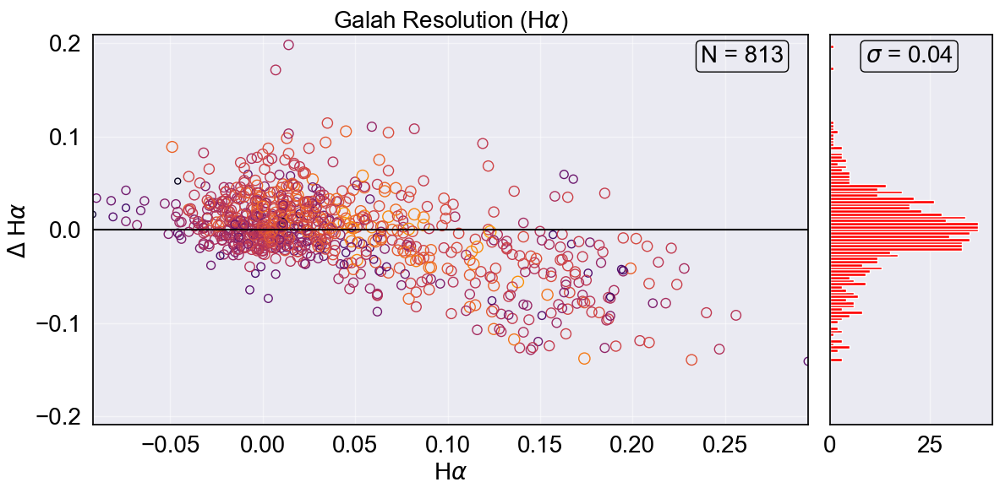

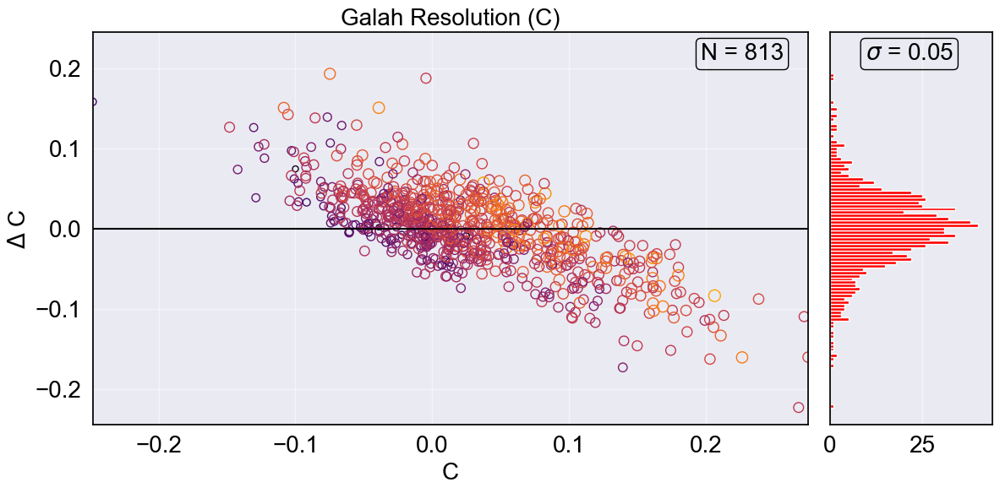

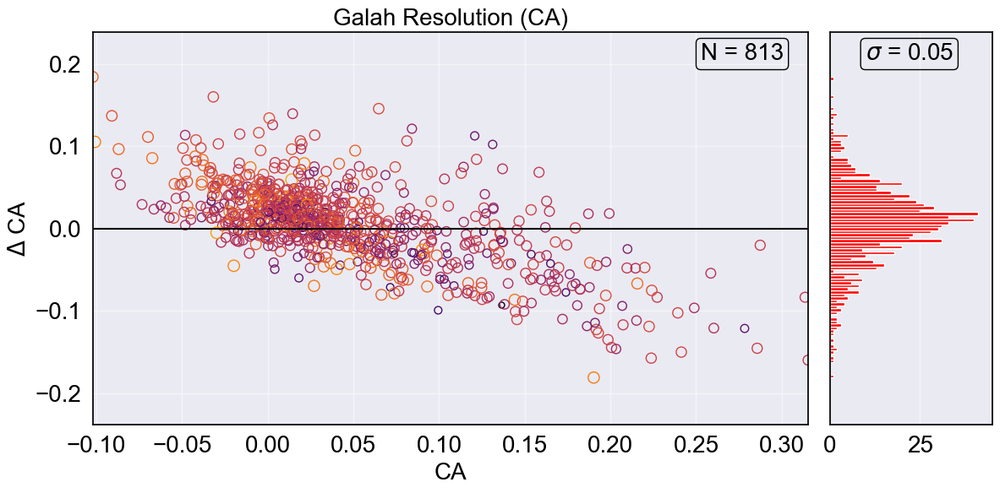

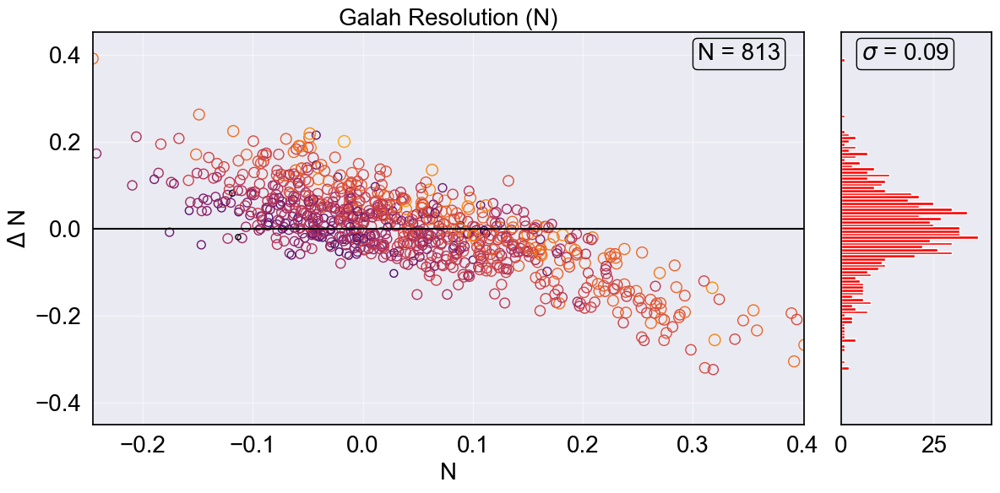

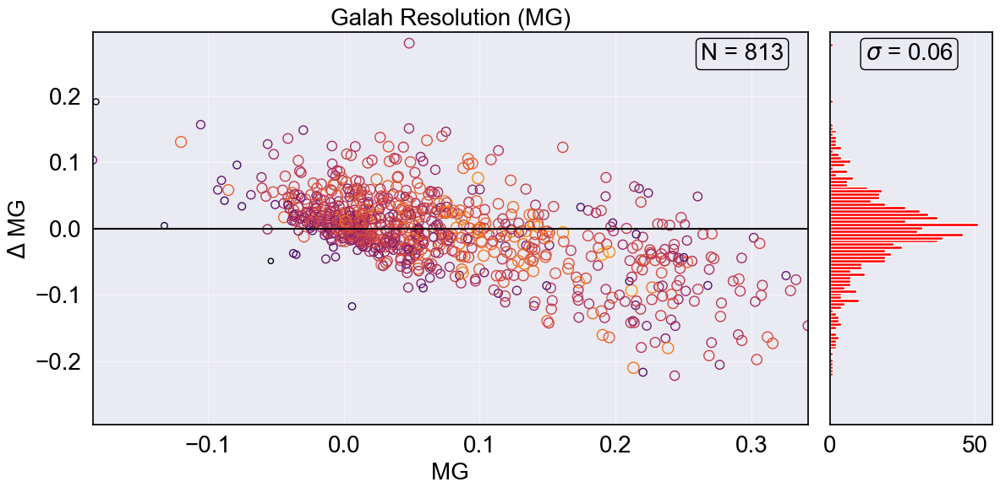

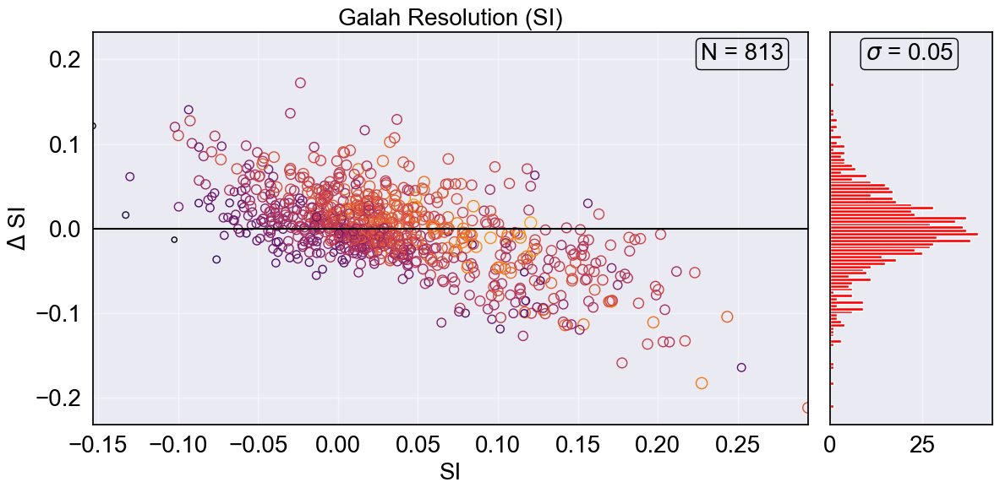

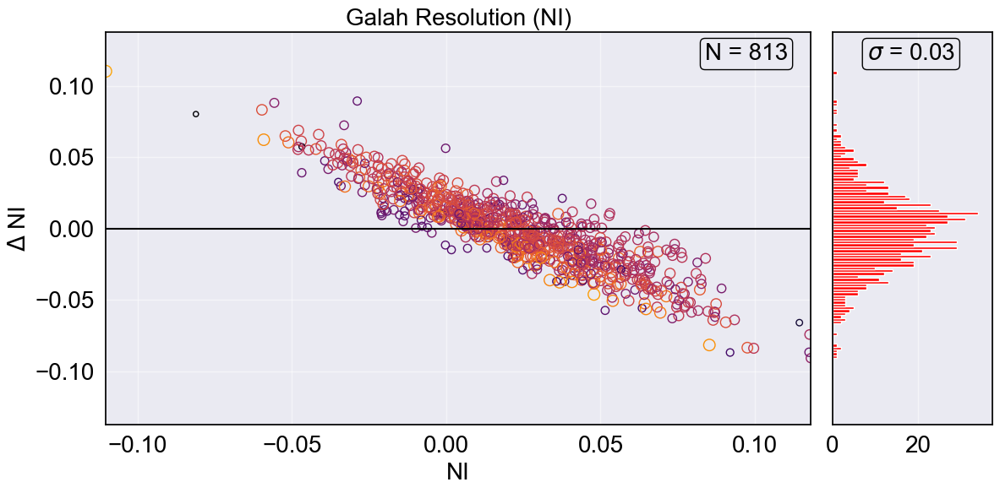

In [46]:
for i in range(len(Parametros)):
    name = names[i]
    name1 = Parametros[i]
    x = padrao[columnTrain[i]]
    y = padrao[predicts[i]]
    
    y = y - x

    qtd = padrao.shape[0]

    tamFonte = 20

    desvio = np.std(y)

    fig = plt.figure(figsize=(12, 6))

    # Define the grid spec layout
    gs = gridspec.GridSpec(1, 5)  # 1 row, 5 columns

    # Main plot (takes 4/5 of the space)
    ax = fig.add_subplot(gs[:, :4])  # Span all rows, and first 4 columns
    ax.scatter(x, y, edgecolors=plt.cm.inferno(padrao['colors']), s=(padrao['sizes']+0.2) * 100, alpha=1, marker='o', facecolors='none')
    ax.set_xlabel(f"{name}", color='black', fontsize=tamFonte)
    ax.set_ylabel(f"$\Delta$ {name}", color='black', fontsize=tamFonte)

    plt.title(f'{base_name} ({name})', color='black', fontsize=tamFonte)

    # Possiveis Mudanças
    ax.plot([-5,5], [0,0], color='black', linestyle='solid')

    Ylim = 5*desvio
    plt.xlim(x.min(), x.max())
    plt.ylim(-Ylim, Ylim)

    # Subplot on the right (takes 1/5 of the space)
    ax2 = fig.add_subplot(gs[:, 4])  # Span all rows, and the fifth column
    sla = ax2.hist(y, bins = 100, orientation='horizontal', color='red', alpha=1)
    ax2.get_yaxis().set_visible(False)

    # Possiveis Mudanças
    ax2.set_xlim(0, sla[0].max()*1.1)
    ax2.set_ylim(-Ylim, Ylim)

    ax.tick_params(axis='both', colors='black', labelsize=tamFonte)
    for spine in ax.spines.values():
        spine.set_edgecolor('black')
    ax.grid(True, alpha=0.5)

    ax2.tick_params(axis='both', colors='black', labelsize=tamFonte)
    for spine in ax2.spines.values():
        spine.set_edgecolor('black')
    ax2.grid(True, alpha=0.5)

    # Possiveis Mudanças
    ax.text(0.85, 0.93, f'N = {qtd}', transform=ax.transAxes, color='black', fontsize=tamFonte, bbox=dict(facecolor='none', edgecolor='black', boxstyle='round,pad=0.2'))
    ax2.text(1.08, 0.93, "$\sigma$ = {:.2f}".format(desvio), transform=ax.transAxes, color='black', fontsize=tamFonte, bbox=dict(facecolor='none', edgecolor='black', boxstyle='round,pad=0.2'))

    plt.tight_layout()

    # Mudar nome
    fig.savefig(f"E:\\IC\\Plots\\{NomeBase}\\{name1.replace(' ', '')}-{base_sigla}-{AouG}.png", 
                dpi = 300, bbox_inches="tight")

    plt.show()

### Giants

#### TEFF | LOGG | FEH

In [73]:
base_sigla = 'Galah'
base_name = 'Galah Resolution'
NomeBase = "Galah"
AouG = 'Giants'

In [74]:
padrao = pd.read_csv(f"E:\\IC\\PredictsTreinos\\{NomeBase}\\{AouG}-TLFPredict.csv", index_col = 'ID')

In [75]:
padrao

,teff_cnn,logg_cnn,feh_cnn,alpha_m_cnn,c_fe,ca_fe,n_fe,mg_fe,si_fe,ni_fe,teffEncoded,TEFF_PredictDecoded,LOGG_Predict,FEH_Predict
ID,,,,,,,,,,,,,,
iDR4_3_STRIPE82-0085_0019351,5050.93,2.429,-0.781,0.100,0.00060,-0.00584,0.18966,0.12192,0.08413,0.03775,0.204986,5050.7627,2.569803,-0.794504
iDR4_3_STRIPE82-0006_0021187,4939.77,3.278,-0.233,0.125,0.13984,0.08199,-0.00253,0.22732,0.04072,0.05824,0.073262,4897.8950,3.309210,-0.212685
iDR4_3_STRIPE82-0008_0022177,4715.82,2.321,-0.690,0.206,0.12551,0.21158,-0.02777,0.27152,0.20610,0.06707,-0.192117,4830.2690,2.380787,-0.426164
iDR4_3_SPLUS-s02s23_0002586,4664.33,2.520,-0.433,0.217,0.11889,0.18692,0.06594,0.30839,0.20952,0.10566,-0.253133,4743.1420,2.317781,-0.531508
iDR4_3_SPLUS-n05s44_0037296,5213.97,3.351,-0.591,0.059,0.14198,0.07521,0.04166,0.09914,0.03649,0.06461,0.398188,5160.5210,3.234449,-0.517147
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
iDR4_3_STRIPE82-0130_0030550,4758.38,2.520,-0.401,0.162,0.19900,0.09656,0.07049,0.21585,0.17819,0.10353,-0.141684,4649.9120,2.345732,-0.421694
iDR4_3_STRIPE82-0004_0021650,5090.87,3.427,-0.303,0.154,0.14779,0.15247,0.03833,0.23704,0.12388,0.08799,0.252315,4973.8720,3.140913,-0.357152
iDR4_3_SPLUS-s02s23_0002586,4643.88,2.501,-0.444,0.192,0.09952,0.17624,0.05140,0.26303,0.19020,0.08703,-0.277366,4743.0900,2.317757,-0.531431


In [76]:
scaler = MinMaxScaler(feature_range=(0, 0.8))
cores = scaler.fit_transform(np.array(padrao[["teff_cnn"]]))
padrao['colors'] = cores

In [77]:
scalersize = MinMaxScaler(feature_range=(0, 1))
sizes = scalersize.fit_transform(np.array(padrao[["logg_cnn"]]))
padrao['sizes'] = cores

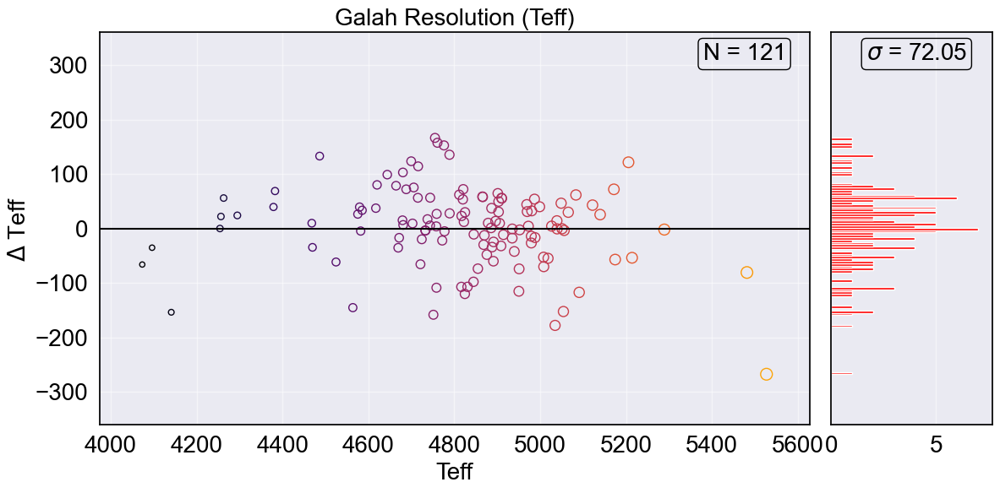

In [78]:
name = 'Teff'
x = padrao['teff_cnn']
y = padrao['TEFF_PredictDecoded']

y = y - x

qtd = padrao.shape[0]

tamFonte = 20

desvio = np.std(y)

fig = plt.figure(figsize=(12, 6))

# Define the grid spec layout
gs = gridspec.GridSpec(1, 5)  # 1 row, 5 columns

# Main plot (takes 4/5 of the space)
ax = fig.add_subplot(gs[:, :4])  # Span all rows, and first 4 columns
ax.scatter(x, y, edgecolors=plt.cm.inferno(padrao['colors']), s=(padrao['sizes']+0.2) * 100, alpha=1, marker='o', facecolors='none')
ax.set_xlabel(f"{name}", color='black', fontsize=tamFonte)
ax.set_ylabel(f"$\Delta$ {name}", color='black', fontsize=tamFonte)

plt.title(f'{base_name} ({name})', color='black', fontsize=tamFonte)

# Possiveis Mudanças
ax.plot([2000,7500], [0,0], color='black', linestyle='solid')

Ylim = 5*desvio
plt.xlim(x.min()-100, x.max()+100)
plt.ylim(-Ylim, Ylim)

# Subplot on the right (takes 1/5 of the space)
ax2 = fig.add_subplot(gs[:, 4])  # Span all rows, and the fifth column
sla = ax2.hist(y, bins = 100, orientation='horizontal', color='red', alpha=1)
ax2.get_yaxis().set_visible(False)

# Possiveis Mudanças
ax2.set_xlim(0, sla[0].max()*1.1)
ax2.set_ylim(-Ylim, Ylim)

ax.tick_params(axis='both', colors='black', labelsize=tamFonte)
for spine in ax.spines.values():
    spine.set_edgecolor('black')
ax.grid(True, alpha=0.5)

ax2.tick_params(axis='both', colors='black', labelsize=tamFonte)
for spine in ax2.spines.values():
    spine.set_edgecolor('black')
ax2.grid(True, alpha=0.5)

# Possiveis Mudanças
ax.text(0.85, 0.93, f'N = {qtd}', transform=ax.transAxes, color='black', fontsize=tamFonte, bbox=dict(facecolor='none', edgecolor='black', boxstyle='round,pad=0.2'))
ax2.text(1.08, 0.93, "$\sigma$ = {:.2f}".format(desvio), transform=ax.transAxes, color='black', fontsize=tamFonte, bbox=dict(facecolor='none', edgecolor='black', boxstyle='round,pad=0.2'))

plt.tight_layout()

# Mudar nome
fig.savefig(f"E:\\IC\\Plots\\{NomeBase}\\{name.replace(' ', '')}-{base_sigla}-{AouG}.png", 
            dpi = 300, bbox_inches="tight")

plt.show()

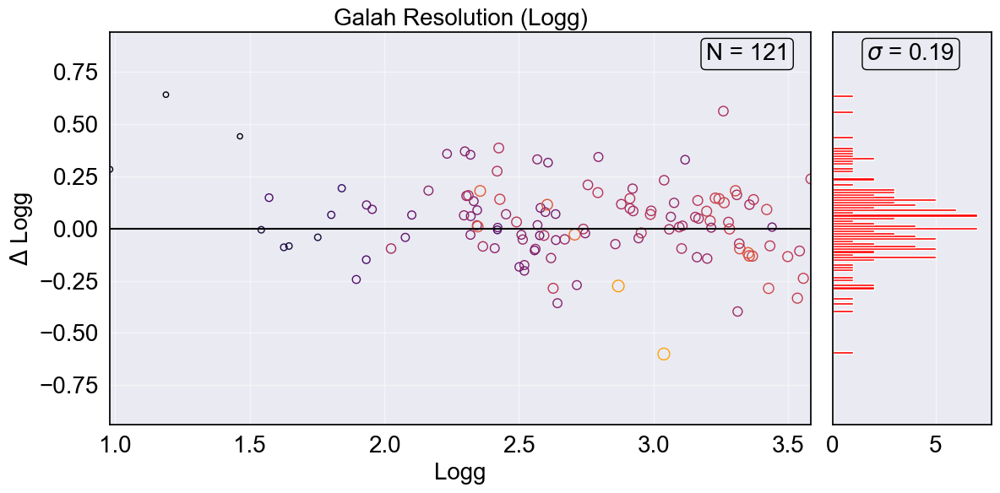

In [79]:
name = 'Logg'
x = padrao['logg_cnn']
y = padrao['LOGG_Predict']

y = y - x

qtd = padrao.shape[0]

tamFonte = 20

desvio = np.std(y)

fig = plt.figure(figsize=(12, 6))

# Define the grid spec layout
gs = gridspec.GridSpec(1, 5)  # 1 row, 5 columns

# Main plot (takes 4/5 of the space)
ax = fig.add_subplot(gs[:, :4])  # Span all rows, and first 4 columns
ax.scatter(x, y, edgecolors=plt.cm.inferno(padrao['colors']), s=(padrao['sizes']+0.2) * 100, alpha=1, marker='o', facecolors='none')
ax.set_xlabel(f"{name}", color='black', fontsize=tamFonte)
ax.set_ylabel(f"$\Delta$ {name}", color='black', fontsize=tamFonte)

plt.title(f'{base_name} ({name})', color='black', fontsize=tamFonte)

# Possiveis Mudanças
ax.plot([-5,10], [0,0], color='black', linestyle='solid')

Ylim = 5*desvio
plt.xlim(x.min(), x.max())
plt.ylim(-Ylim, Ylim)

# Subplot on the right (takes 1/5 of the space)
ax2 = fig.add_subplot(gs[:, 4])  # Span all rows, and the fifth column
sla = ax2.hist(y, bins = 100, orientation='horizontal', color='red', alpha=1)
ax2.get_yaxis().set_visible(False)

# Possiveis Mudanças
ax2.set_xlim(0, sla[0].max()*1.1)
ax2.set_ylim(-Ylim, Ylim)

ax.tick_params(axis='both', colors='black', labelsize=tamFonte)
for spine in ax.spines.values():
    spine.set_edgecolor('black')
ax.grid(True, alpha=0.5)

ax2.tick_params(axis='both', colors='black', labelsize=tamFonte)
for spine in ax2.spines.values():
    spine.set_edgecolor('black')
ax2.grid(True, alpha=0.5)

# Possiveis Mudanças
ax.text(0.85, 0.93, f'N = {qtd}', transform=ax.transAxes, color='black', fontsize=tamFonte, bbox=dict(facecolor='none', edgecolor='black', boxstyle='round,pad=0.2'))
ax2.text(1.08, 0.93, "$\sigma$ = {:.2f}".format(desvio), transform=ax.transAxes, color='black', fontsize=tamFonte, bbox=dict(facecolor='none', edgecolor='black', boxstyle='round,pad=0.2'))

plt.tight_layout()

# Mudar nome
fig.savefig(f"E:\\IC\\Plots\\{NomeBase}\\{name.replace(' ', '')}-{base_sigla}-{AouG}.png", 
            dpi = 300, bbox_inches="tight")

plt.show()

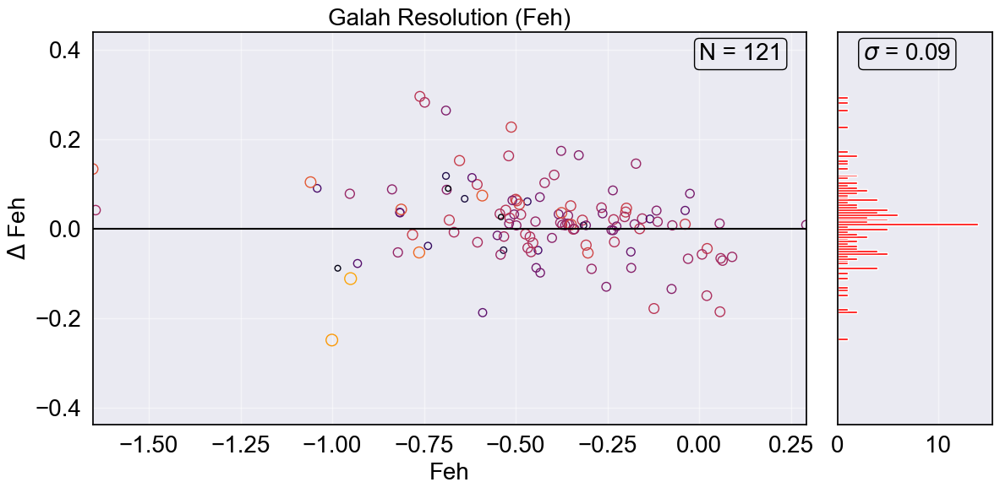

In [80]:
name = 'Feh'
x = padrao['feh_cnn']
y = padrao['FEH_Predict']

y = y - x

qtd = padrao.shape[0]

tamFonte = 20

desvio = np.std(y)

fig = plt.figure(figsize=(12, 6))

# Define the grid spec layout
gs = gridspec.GridSpec(1, 5)  # 1 row, 5 columns

# Main plot (takes 4/5 of the space)
ax = fig.add_subplot(gs[:, :4])  # Span all rows, and first 4 columns
ax.scatter(x, y, edgecolors=plt.cm.inferno(padrao['colors']), s=(padrao['sizes']+0.2) * 100, alpha=1, marker='o', facecolors='none')
ax.set_xlabel(f"{name}", color='black', fontsize=tamFonte)
ax.set_ylabel(f"$\Delta$ {name}", color='black', fontsize=tamFonte)

plt.title(f'{base_name} ({name})', color='black', fontsize=tamFonte)

# Possiveis Mudanças
ax.plot([-5,5], [0,0], color='black', linestyle='solid')

Ylim = 5*desvio
plt.xlim(x.min(), x.max())
plt.ylim(-Ylim, Ylim)

# Subplot on the right (takes 1/5 of the space)
ax2 = fig.add_subplot(gs[:, 4])  # Span all rows, and the fifth column
sla = ax2.hist(y, bins = 100, orientation='horizontal', color='red', alpha=1)
ax2.get_yaxis().set_visible(False)

# Possiveis Mudanças
ax2.set_xlim(0, sla[0].max()*1.1)
ax2.set_ylim(-Ylim, Ylim)

ax.tick_params(axis='both', colors='black', labelsize=tamFonte)
for spine in ax.spines.values():
    spine.set_edgecolor('black')
ax.grid(True, alpha=0.5)

ax2.tick_params(axis='both', colors='black', labelsize=tamFonte)
for spine in ax2.spines.values():
    spine.set_edgecolor('black')
ax2.grid(True, alpha=0.5)

# Possiveis Mudanças
ax.text(0.85, 0.93, f'N = {qtd}', transform=ax.transAxes, color='black', fontsize=tamFonte, bbox=dict(facecolor='none', edgecolor='black', boxstyle='round,pad=0.2'))
ax2.text(1.08, 0.93, "$\sigma$ = {:.2f}".format(desvio), transform=ax.transAxes, color='black', fontsize=tamFonte, bbox=dict(facecolor='none', edgecolor='black', boxstyle='round,pad=0.2'))

plt.tight_layout()

# Mudar nome
fig.savefig(f"E:\\IC\\Plots\\{NomeBase}\\{name.replace(' ', '')}-{base_sigla}-{AouG}.png", 
            dpi = 300, bbox_inches="tight")

plt.show()

#### Other Parameters

In [81]:
padrao = pd.read_csv(f"E:\\IC\\PredictsTreinos\\{NomeBase}\\{AouG}-OthersPredict.csv", index_col = 'ID')

In [82]:
padrao

,teff_cnn,logg_cnn,feh_cnn,alpha_m_cnn,c_fe,ca_fe,n_fe,mg_fe,si_fe,ni_fe,Alpha_Predict,C_Predict,CA_Predict,N_Predict,MG_Predict,SI_Predict,NI_Predict
ID,,,,,,,,,,,,,,,,,
iDR4_3_STRIPE82-0085_0019351,5050.93,2.429,-0.781,0.100,0.00060,-0.00584,0.18966,0.12192,0.08413,0.03775,0.238059,0.106861,0.178146,0.152345,0.277424,0.234807,0.062036
iDR4_3_STRIPE82-0006_0021187,4939.77,3.278,-0.233,0.125,0.13984,0.08199,-0.00253,0.22732,0.04072,0.05824,0.120306,0.126948,0.086584,0.035494,0.193466,0.062506,0.052126
iDR4_3_STRIPE82-0008_0022177,4715.82,2.321,-0.690,0.206,0.12551,0.21158,-0.02777,0.27152,0.20610,0.06707,0.084362,0.075269,0.103359,0.000427,0.156074,0.119149,0.042798
iDR4_3_SPLUS-s02s23_0002586,4664.33,2.520,-0.433,0.217,0.11889,0.18692,0.06594,0.30839,0.20952,0.10566,0.181302,0.174517,0.142086,0.100152,0.256773,0.208661,0.079175
iDR4_3_SPLUS-n05s44_0037296,5213.97,3.351,-0.591,0.059,0.14198,0.07521,0.04166,0.09914,0.03649,0.06461,0.053338,0.103460,0.057018,0.008434,0.096839,0.023594,0.051421
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
iDR4_3_STRIPE82-0130_0030550,4758.38,2.520,-0.401,0.162,0.19900,0.09656,0.07049,0.21585,0.17819,0.10353,0.092781,0.152473,0.119518,0.079673,0.199841,0.155620,0.060295
iDR4_3_STRIPE82-0004_0021650,5090.87,3.427,-0.303,0.154,0.14779,0.15247,0.03833,0.23704,0.12388,0.08799,0.114152,0.102250,0.121751,-0.050055,0.178825,0.072010,0.043991
iDR4_3_SPLUS-s02s23_0002586,4643.88,2.501,-0.444,0.192,0.09952,0.17624,0.05140,0.26303,0.19020,0.08703,0.181313,0.174491,0.142126,0.100218,0.256770,0.208666,0.079187


In [83]:
for i in padrao:
    print(i)

teff_cnn
logg_cnn
feh_cnn
alpha_m_cnn
c_fe
ca_fe
n_fe
mg_fe
si_fe
ni_fe
Alpha_Predict
C_Predict
CA_Predict
N_Predict
MG_Predict
SI_Predict
NI_Predict


In [84]:
scaler = MinMaxScaler(feature_range=(0, 0.8))
cores = scaler.fit_transform(np.array(padrao[["teff_cnn"]]))
padrao['colors'] = cores

In [85]:
scalersize = MinMaxScaler(feature_range=(0, 1))
sizes = scalersize.fit_transform(np.array(padrao[["logg_cnn"]]))
padrao['sizes'] = cores

In [86]:
names = ["H$\\alpha$", "C", "CA", "N", "MG", "SI", "NI"]
Parametros = ["Alpha", "C", "CA", "N", "MG", "SI", "NI"]
columnTrain = ['alpha_m_cnn', 'c_fe', 'ca_fe', 'n_fe', 'mg_fe', 'si_fe', 'ni_fe']
predicts = ["Alpha_Predict", "C_Predict", "CA_Predict", "N_Predict", "MG_Predict", "SI_Predict", "NI_Predict"]

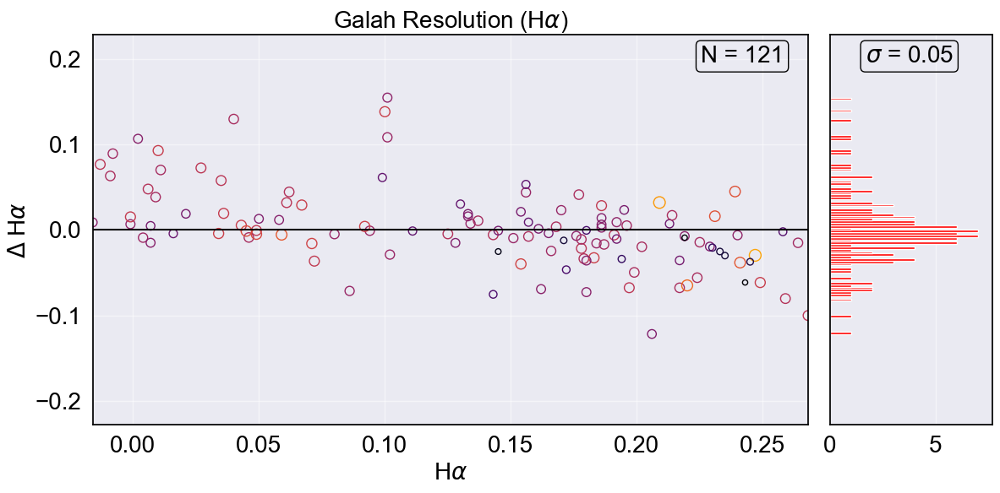

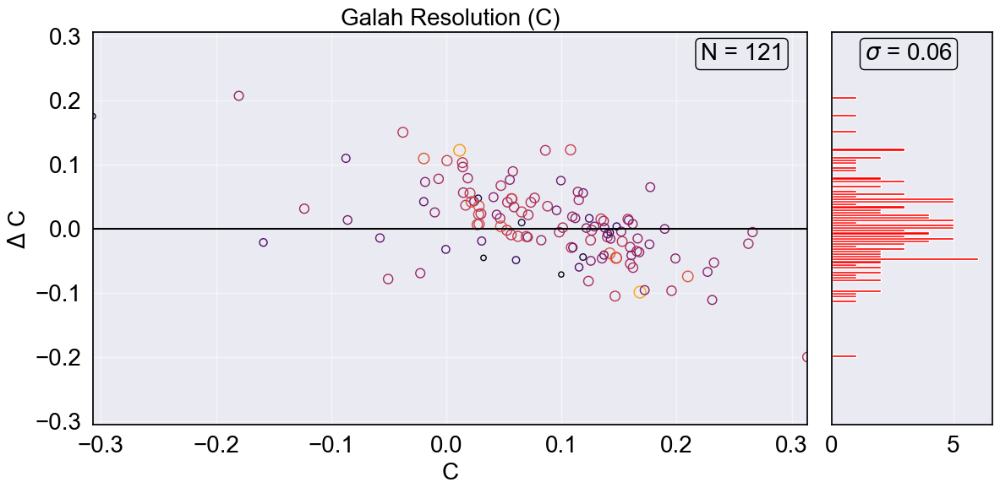

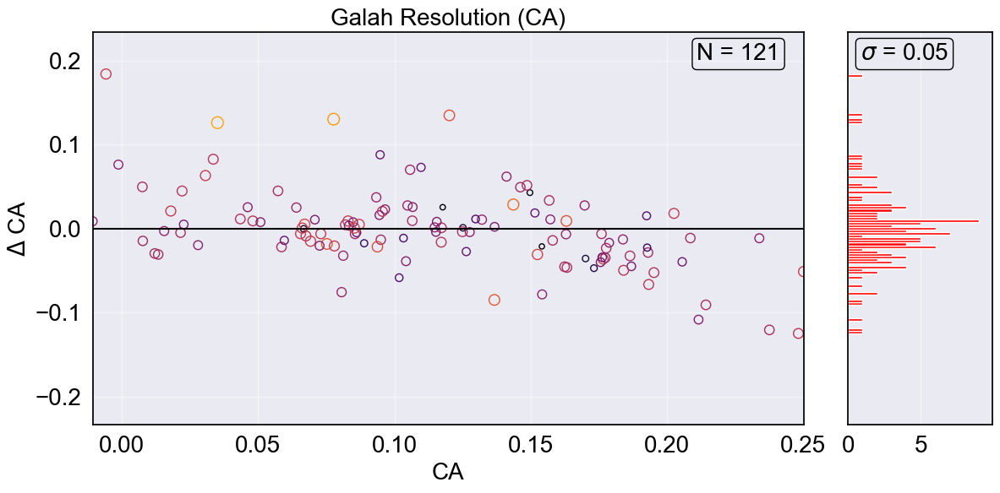

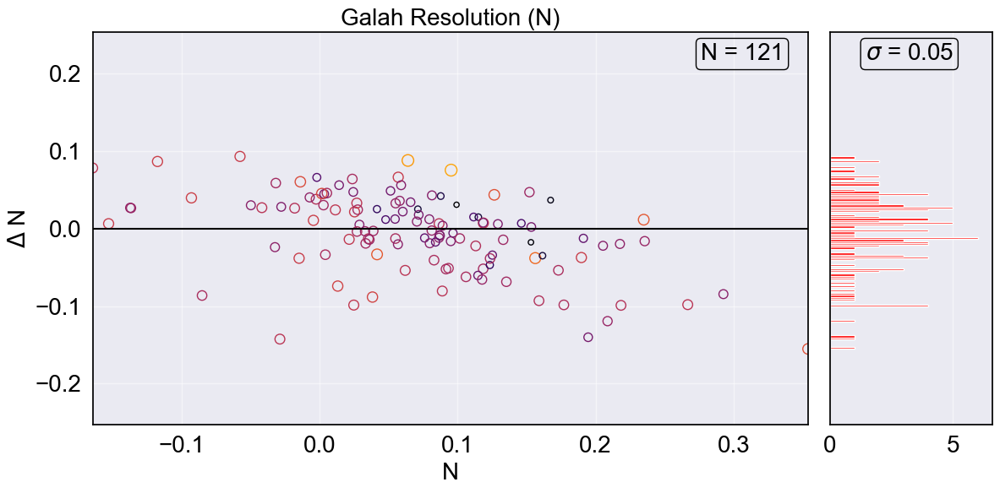

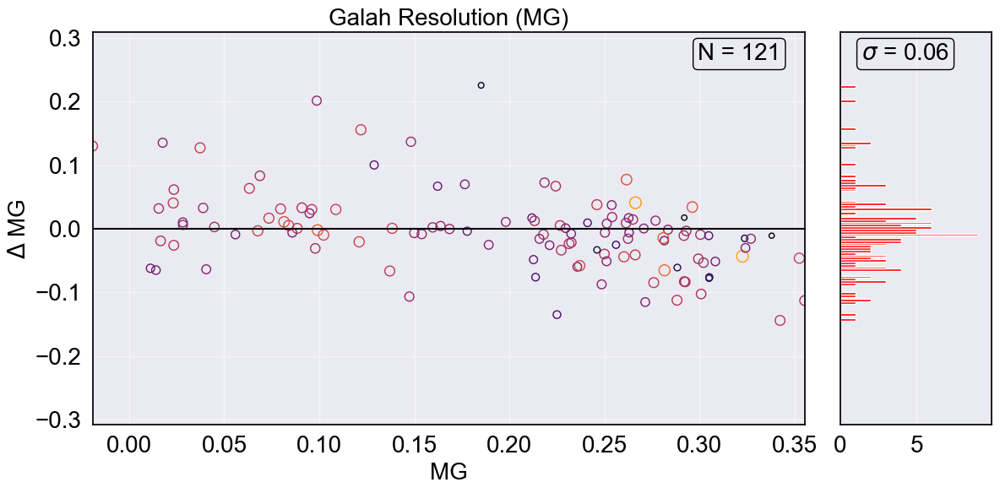

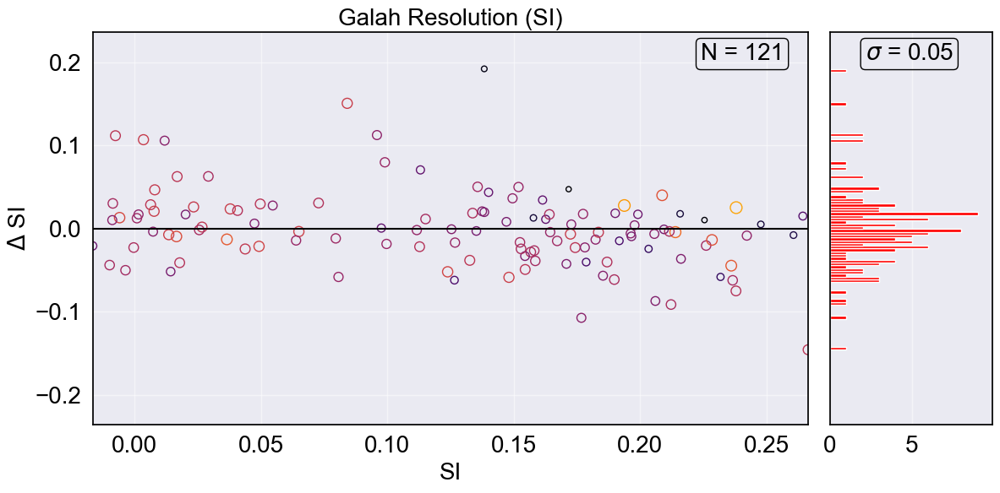

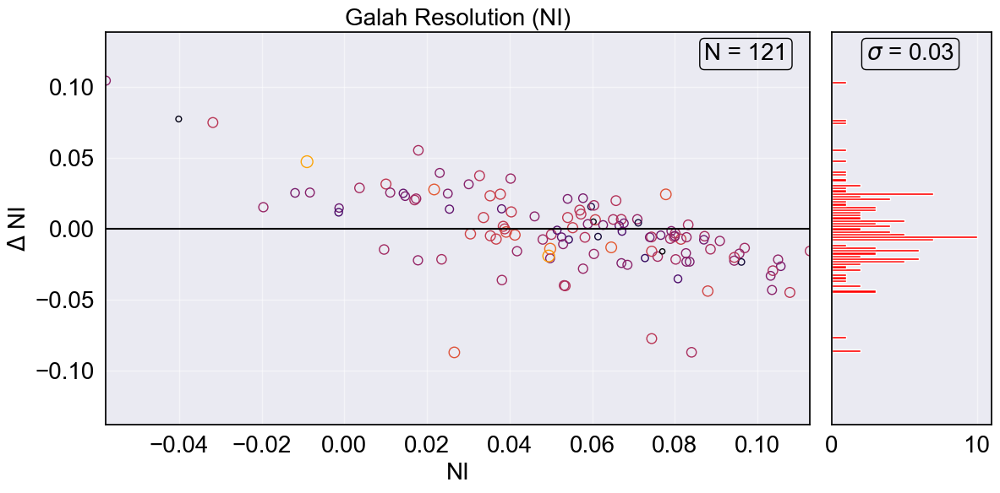

In [87]:
for i in range(len(Parametros)):
    name = names[i]
    name1 = Parametros[i]
    x = padrao[columnTrain[i]]
    y = padrao[predicts[i]]
    
    y = y - x

    qtd = padrao.shape[0]

    tamFonte = 20

    desvio = np.std(y)

    fig = plt.figure(figsize=(12, 6))

    # Define the grid spec layout
    gs = gridspec.GridSpec(1, 5)  # 1 row, 5 columns

    # Main plot (takes 4/5 of the space)
    ax = fig.add_subplot(gs[:, :4])  # Span all rows, and first 4 columns
    ax.scatter(x, y, edgecolors=plt.cm.inferno(padrao['colors']), s=(padrao['sizes']+0.2) * 100, alpha=1, marker='o', facecolors='none')
    ax.set_xlabel(f"{name}", color='black', fontsize=tamFonte)
    ax.set_ylabel(f"$\Delta$ {name}", color='black', fontsize=tamFonte)

    plt.title(f'{base_name} ({name})', color='black', fontsize=tamFonte)

    # Possiveis Mudanças
    ax.plot([-5,5], [0,0], color='black', linestyle='solid')

    Ylim = 5*desvio
    plt.xlim(x.min(), x.max())
    plt.ylim(-Ylim, Ylim)

    # Subplot on the right (takes 1/5 of the space)
    ax2 = fig.add_subplot(gs[:, 4])  # Span all rows, and the fifth column
    sla = ax2.hist(y, bins = 100, orientation='horizontal', color='red', alpha=1)
    ax2.get_yaxis().set_visible(False)

    # Possiveis Mudanças
    ax2.set_xlim(0, sla[0].max()*1.1)
    ax2.set_ylim(-Ylim, Ylim)

    ax.tick_params(axis='both', colors='black', labelsize=tamFonte)
    for spine in ax.spines.values():
        spine.set_edgecolor('black')
    ax.grid(True, alpha=0.5)

    ax2.tick_params(axis='both', colors='black', labelsize=tamFonte)
    for spine in ax2.spines.values():
        spine.set_edgecolor('black')
    ax2.grid(True, alpha=0.5)

    # Possiveis Mudanças
    ax.text(0.85, 0.93, f'N = {qtd}', transform=ax.transAxes, color='black', fontsize=tamFonte, bbox=dict(facecolor='none', edgecolor='black', boxstyle='round,pad=0.2'))
    ax2.text(1.08, 0.93, "$\sigma$ = {:.2f}".format(desvio), transform=ax.transAxes, color='black', fontsize=tamFonte, bbox=dict(facecolor='none', edgecolor='black', boxstyle='round,pad=0.2'))

    plt.tight_layout()

    # Mudar nome
    fig.savefig(f"E:\\IC\\Plots\\{NomeBase}\\{name1.replace(' ', '')}-{base_sigla}-{AouG}.png", 
                dpi = 300, bbox_inches="tight")

    plt.show()

## LamostMedium

### Dwarfs

#### TEFF | LOGG | FEH

In [3]:
base_sigla = 'LamostMedium'
base_name = 'LamostMedium Resolution'
NomeBase = "LamostMedium"
AouG = 'Dwarfs'

In [4]:
padrao = pd.read_csv(f"E:\\IC\\PredictsTreinos\\{NomeBase}\\{AouG}-TLFPredict.csv", index_col = 'ID')

In [5]:
padrao

,teff_cnn,logg_cnn,feh_cnn,alpha_m_cnn,c_fe,ca_fe,n_fe,mg_fe,si_fe,ni_fe,teffEncoded,TEFF_PredictDecoded,LOGG_Predict,FEH_Predict
ID,,,,,,,,,,,,,,
iDR4_3_STRIPE82-0005_0028605,5685.09,4.253,-0.497,0.165,0.17985,0.08121,0.06669,0.24823,0.16309,0.05935,0.229076,5578.7163,4.116853,-0.692977
iDR4_3_STRIPE82-0048_0013477,5253.51,4.347,-0.302,0.159,0.04655,0.17966,-0.01043,0.21871,0.10999,0.04033,-0.055886,5389.9060,4.392051,-0.291032
iDR4_3_STRIPE82-0030_0047340,5725.44,4.436,-0.209,-0.005,-0.00348,-0.02077,0.15071,0.00338,0.00995,0.00871,0.255718,5751.9067,4.119899,-0.062352
iDR4_3_STRIPE82-0130_0008941,5013.25,4.198,-0.038,-0.005,-0.07105,0.05844,0.06584,-0.04190,-0.04802,0.01047,-0.214523,4958.1820,4.484425,-0.036600
iDR4_3_STRIPE82-0006_0012431,5116.29,4.289,0.058,-0.032,-0.00450,-0.01086,0.09835,-0.01338,-0.02291,0.03095,-0.146489,5087.8315,4.541044,-0.100748
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
iDR4_3_SPLUS-n02n28_0020503,5228.77,3.948,-0.136,0.089,0.07635,0.09427,-0.04551,0.16613,0.05183,0.06135,-0.072221,5251.5903,4.086376,-0.072285
iDR4_3_STRIPE82-0132_0019055,5652.10,4.056,-0.086,0.135,0.10474,0.10234,0.09820,0.21770,0.13217,0.03695,0.207293,5242.5757,4.190159,0.023483
iDR4_3_STRIPE82-0006_0024027,5391.94,4.308,0.159,-0.037,-0.01274,-0.05130,0.11948,-0.01593,0.04669,0.05998,0.035516,5404.4020,4.327712,0.092261


In [6]:
scaler = MinMaxScaler(feature_range=(0, 0.8))
cores = scaler.fit_transform(np.array(padrao[["teff_cnn"]]))
padrao['colors'] = cores

In [7]:
scalersize = MinMaxScaler(feature_range=(0, 1))
sizes = scalersize.fit_transform(np.array(padrao[["logg_cnn"]]))
padrao['sizes'] = cores
padrao['sizes'].min()

0.0

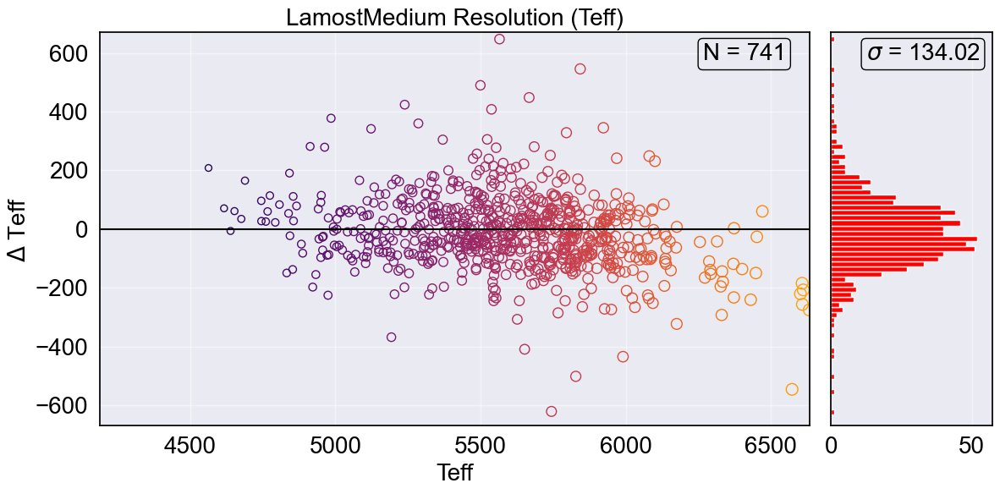

In [13]:
name = 'Teff'
x = padrao['teff_cnn']
y = padrao['TEFF_PredictDecoded']

y = y - x

qtd = padrao.shape[0]

tamFonte = 20

desvio = np.std(y)

fig = plt.figure(figsize=(12, 6))

# Define the grid spec layout
gs = gridspec.GridSpec(1, 5)  # 1 row, 5 columns

# Main plot (takes 4/5 of the space)
ax = fig.add_subplot(gs[:, :4])  # Span all rows, and first 4 columns
ax.scatter(x, y, edgecolors=plt.cm.inferno(padrao['colors']), s=(padrao['sizes']+0.2) * 100, alpha=1, marker='o', facecolors='none')
ax.set_xlabel(f"{name}", color='black', fontsize=tamFonte)
ax.set_ylabel(f"$\Delta$ {name}", color='black', fontsize=tamFonte)

plt.title(f'{base_name} ({name})', color='black', fontsize=tamFonte)

# Possiveis Mudanças
ax.plot([2000,7500], [0,0], color='black', linestyle='solid')

Ylim = 5*desvio
plt.xlim(x.min(), x.max())
plt.ylim(-Ylim, Ylim)

# Subplot on the right (takes 1/5 of the space)
ax2 = fig.add_subplot(gs[:, 4])  # Span all rows, and the fifth column
sla = ax2.hist(y, bins = 100, orientation='horizontal', color='red', alpha=1)
ax2.get_yaxis().set_visible(False)

# Possiveis Mudanças
ax2.set_xlim(0, sla[0].max()*1.1)
ax2.set_ylim(-Ylim, Ylim)

ax.tick_params(axis='both', colors='black', labelsize=tamFonte)
for spine in ax.spines.values():
    spine.set_edgecolor('black')
ax.grid(True, alpha=0.5)

ax2.tick_params(axis='both', colors='black', labelsize=tamFonte)
for spine in ax2.spines.values():
    spine.set_edgecolor('black')
ax2.grid(True, alpha=0.5)

# Possiveis Mudanças
ax.text(0.85, 0.93, f'N = {qtd}', transform=ax.transAxes, color='black', fontsize=tamFonte, bbox=dict(facecolor='none', edgecolor='black', boxstyle='round,pad=0.2'))
ax2.text(1.08, 0.93, "$\sigma$ = {:.2f}".format(desvio), transform=ax.transAxes, color='black', fontsize=tamFonte, bbox=dict(facecolor='none', edgecolor='black', boxstyle='round,pad=0.2'))

plt.tight_layout()

# Mudar nome
fig.savefig(f"E:\\IC\\Plots\\{NomeBase}\\{name.replace(' ', '')}-{base_sigla}-{AouG}.png", 
            dpi = 300, bbox_inches="tight")

plt.show()

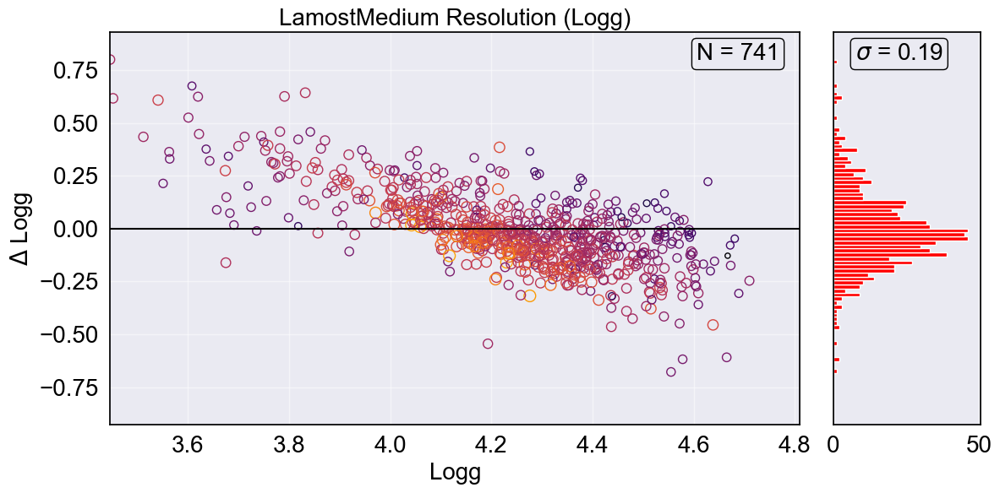

In [14]:
name = 'Logg'
x = padrao['logg_cnn']
y = padrao['LOGG_Predict']

y = y - x

qtd = padrao.shape[0]

tamFonte = 20

desvio = np.std(y)

fig = plt.figure(figsize=(12, 6))

# Define the grid spec layout
gs = gridspec.GridSpec(1, 5)  # 1 row, 5 columns

# Main plot (takes 4/5 of the space)
ax = fig.add_subplot(gs[:, :4])  # Span all rows, and first 4 columns
ax.scatter(x, y, edgecolors=plt.cm.inferno(padrao['colors']), s=(padrao['sizes']+0.2) * 100, alpha=1, marker='o', facecolors='none')
ax.set_xlabel(f"{name}", color='black', fontsize=tamFonte)
ax.set_ylabel(f"$\Delta$ {name}", color='black', fontsize=tamFonte)

plt.title(f'{base_name} ({name})', color='black', fontsize=tamFonte)

# Possiveis Mudanças
ax.plot([-5,10], [0,0], color='black', linestyle='solid')

Ylim = 5*desvio
plt.xlim(x.min(), x.max()+0.1)
plt.ylim(-Ylim, Ylim)

# Subplot on the right (takes 1/5 of the space)
ax2 = fig.add_subplot(gs[:, 4])  # Span all rows, and the fifth column
sla = ax2.hist(y, bins = 100, orientation='horizontal', color='red', alpha=1)
ax2.get_yaxis().set_visible(False)

# Possiveis Mudanças
ax2.set_xlim(0, sla[0].max()*1.1)
ax2.set_ylim(-Ylim, Ylim)

ax.tick_params(axis='both', colors='black', labelsize=tamFonte)
for spine in ax.spines.values():
    spine.set_edgecolor('black')
ax.grid(True, alpha=0.5)

ax2.tick_params(axis='both', colors='black', labelsize=tamFonte)
for spine in ax2.spines.values():
    spine.set_edgecolor('black')
ax2.grid(True, alpha=0.5)

# Possiveis Mudanças
ax.text(0.85, 0.93, f'N = {qtd}', transform=ax.transAxes, color='black', fontsize=tamFonte, bbox=dict(facecolor='none', edgecolor='black', boxstyle='round,pad=0.2'))
ax2.text(1.08, 0.93, "$\sigma$ = {:.2f}".format(desvio), transform=ax.transAxes, color='black', fontsize=tamFonte, bbox=dict(facecolor='none', edgecolor='black', boxstyle='round,pad=0.2'))

plt.tight_layout()

# Mudar nome
fig.savefig(f"E:\\IC\\Plots\\{NomeBase}\\{name.replace(' ', '')}-{base_sigla}-{AouG}.png", 
            dpi = 300, bbox_inches="tight")

plt.show()

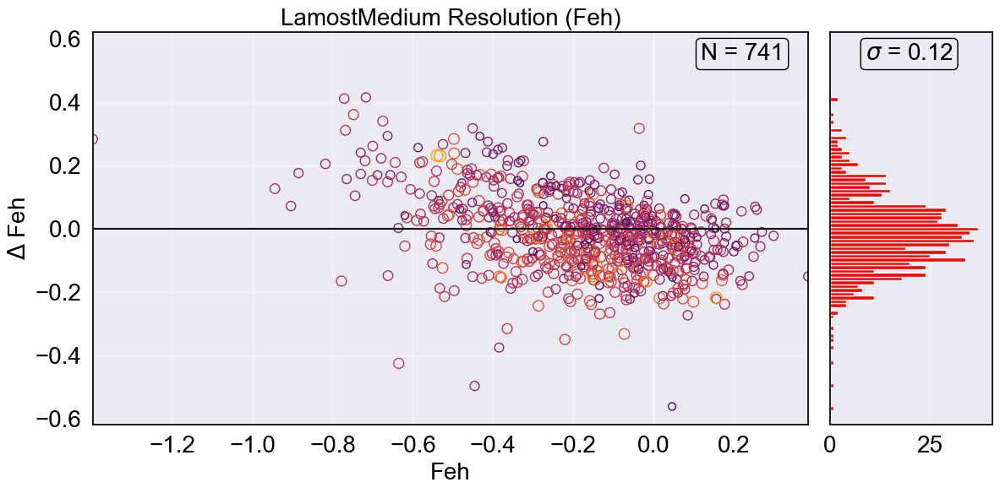

In [15]:
name = 'Feh'
x = padrao['feh_cnn']
y = padrao['FEH_Predict']

y = y - x

qtd = padrao.shape[0]

tamFonte = 20

desvio = np.std(y)

fig = plt.figure(figsize=(12, 6))

# Define the grid spec layout
gs = gridspec.GridSpec(1, 5)  # 1 row, 5 columns

# Main plot (takes 4/5 of the space)
ax = fig.add_subplot(gs[:, :4])  # Span all rows, and first 4 columns
ax.scatter(x, y, edgecolors=plt.cm.inferno(padrao['colors']), s=(padrao['sizes']+0.2) * 100, alpha=1, marker='o', facecolors='none')
ax.set_xlabel(f"{name}", color='black', fontsize=tamFonte)
ax.set_ylabel(f"$\Delta$ {name}", color='black', fontsize=tamFonte)

plt.title(f'{base_name} ({name})', color='black', fontsize=tamFonte)

# Possiveis Mudanças
ax.plot([-5,5], [0,0], color='black', linestyle='solid')

Ylim = 5*desvio
plt.xlim(x.min(), x.max())
plt.ylim(-Ylim, Ylim)

# Subplot on the right (takes 1/5 of the space)
ax2 = fig.add_subplot(gs[:, 4])  # Span all rows, and the fifth column
sla = ax2.hist(y, bins = 100, orientation='horizontal', color='red', alpha=1)
ax2.get_yaxis().set_visible(False)

# Possiveis Mudanças
ax2.set_xlim(0, sla[0].max()*1.1)
ax2.set_ylim(-Ylim, Ylim)

ax.tick_params(axis='both', colors='black', labelsize=tamFonte)
for spine in ax.spines.values():
    spine.set_edgecolor('black')
ax.grid(True, alpha=0.5)

ax2.tick_params(axis='both', colors='black', labelsize=tamFonte)
for spine in ax2.spines.values():
    spine.set_edgecolor('black')
ax2.grid(True, alpha=0.5)

# Possiveis Mudanças
ax.text(0.85, 0.93, f'N = {qtd}', transform=ax.transAxes, color='black', fontsize=tamFonte, bbox=dict(facecolor='none', edgecolor='black', boxstyle='round,pad=0.2'))
ax2.text(1.08, 0.93, "$\sigma$ = {:.2f}".format(desvio), transform=ax.transAxes, color='black', fontsize=tamFonte, bbox=dict(facecolor='none', edgecolor='black', boxstyle='round,pad=0.2'))

plt.tight_layout()

# Mudar nome
fig.savefig(f"E:\\IC\\Plots\\{NomeBase}\\{name.replace(' ', '')}-{base_sigla}-{AouG}.png", 
            dpi = 300, bbox_inches="tight")

plt.show()

#### Other Parameters

In [16]:
padrao = pd.read_csv(f"E:\\IC\\PredictsTreinos\\{NomeBase}\\{AouG}-OthersPredict.csv", index_col = 'ID')

In [17]:
padrao

,teff_cnn,logg_cnn,feh_cnn,alpha_m_cnn,c_fe,ca_fe,n_fe,mg_fe,si_fe,ni_fe,Alpha_Predict,C_Predict,CA_Predict,N_Predict,MG_Predict,SI_Predict,NI_Predict
ID,,,,,,,,,,,,,,,,,
iDR4_3_SPLUS-n07s41_0026262,5165.86,4.476,-0.007,0.011,-0.05441,0.01777,-0.00575,0.01776,-0.03958,0.00848,0.023705,-0.008439,0.018585,0.011961,0.052955,-0.004428,0.016895
iDR4_3_SPLUS-n02n26_0027037,5731.90,4.266,-0.153,0.003,0.01946,0.01651,-0.00447,0.01430,-0.00130,-0.00525,0.009939,0.003814,0.014707,0.087731,0.023951,0.020236,0.012778
iDR4_3_SPLUS-n02n27_0012652,5883.89,4.244,0.018,-0.013,0.00067,-0.00902,0.26882,-0.01945,-0.00811,0.05074,0.018048,0.028505,0.004849,0.076214,0.035460,0.024273,0.015717
iDR4_3_SPLUS-n01s38_0021247,5553.27,4.078,0.116,-0.015,0.01421,-0.01505,0.14115,-0.00363,0.00871,0.06575,-0.020604,-0.011202,-0.019029,0.191439,-0.020008,0.019418,0.038429
iDR4_3_SPLUS-n01s37_0039916,5281.96,4.407,0.057,-0.031,-0.01388,-0.01326,0.07569,-0.00113,-0.00467,0.02812,-0.024156,0.003420,-0.014492,0.070566,0.009014,0.011086,0.037254
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
iDR4_3_STRIPE82-0052_0030458,5767.40,4.324,-0.329,0.131,0.06415,0.11581,-0.04293,0.20228,0.11763,0.02593,0.093771,0.076005,0.115959,0.022305,0.157523,0.092482,0.025617
iDR4_3_SPLUS-n01s37_0032532,5079.59,4.307,-0.235,0.011,-0.08846,0.19101,-0.04492,-0.05606,-0.05711,-0.03312,0.021999,-0.008088,0.042697,0.055656,0.014982,0.002748,0.030249
iDR4_3_SPLUS-n02n27_0016721,5671.28,4.385,-0.045,-0.012,-0.02921,-0.01149,0.03796,-0.01192,-0.01303,-0.00211,0.028606,-0.001674,-0.016836,0.015900,0.052479,0.022329,0.033263


In [18]:
for i in padrao:
    print(i)

teff_cnn
logg_cnn
feh_cnn
alpha_m_cnn
c_fe
ca_fe
n_fe
mg_fe
si_fe
ni_fe
Alpha_Predict
C_Predict
CA_Predict
N_Predict
MG_Predict
SI_Predict
NI_Predict


In [19]:
scaler = MinMaxScaler(feature_range=(0, 0.8))
cores = scaler.fit_transform(np.array(padrao[["teff_cnn"]]))
padrao['colors'] = cores

In [20]:
scalersize = MinMaxScaler(feature_range=(0, 1))
sizes = scalersize.fit_transform(np.array(padrao[["logg_cnn"]]))
padrao['sizes'] = cores
padrao['sizes'].min()

0.0

In [21]:
names = ["H$\\alpha$", "C", "CA", "N", "MG", "SI", "NI"]
Parametros = ["Alpha", "C", "CA", "N", "MG", "SI", "NI"]
columnTrain = ['alpha_m_cnn', 'c_fe', 'ca_fe', 'n_fe', 'mg_fe', 'si_fe', 'ni_fe']
predicts = ["Alpha_Predict", "C_Predict", "CA_Predict", "N_Predict", "MG_Predict", "SI_Predict", "NI_Predict"]

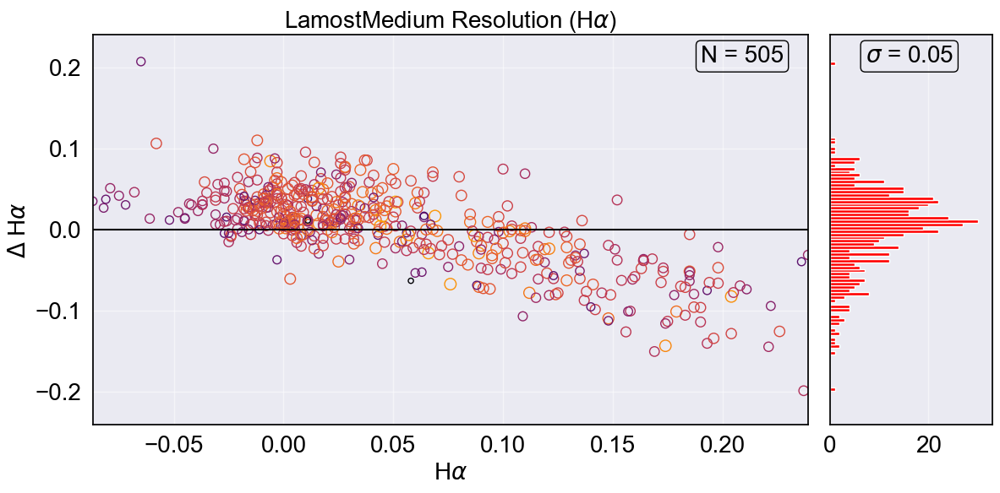

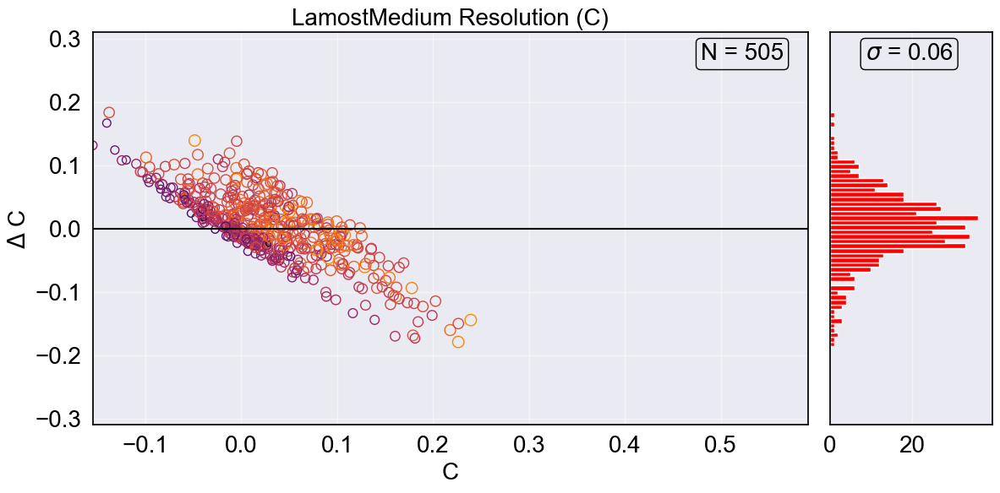

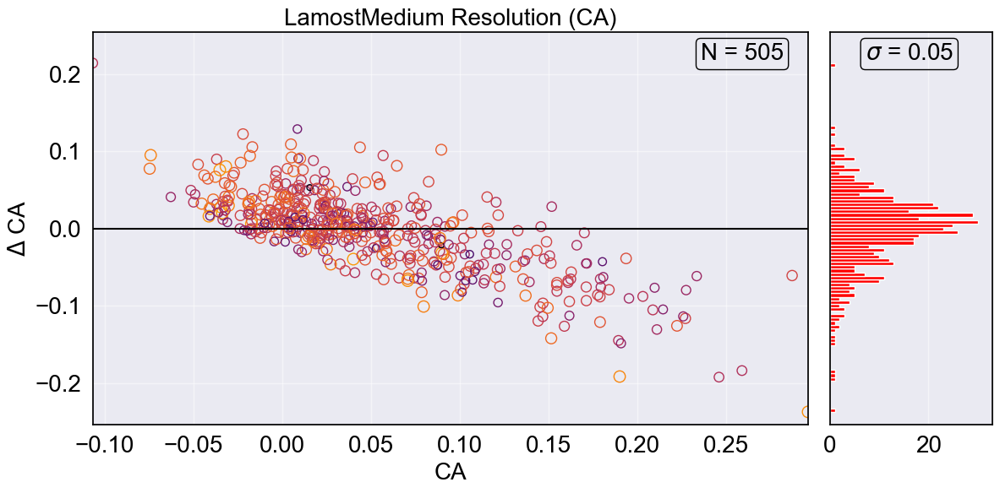

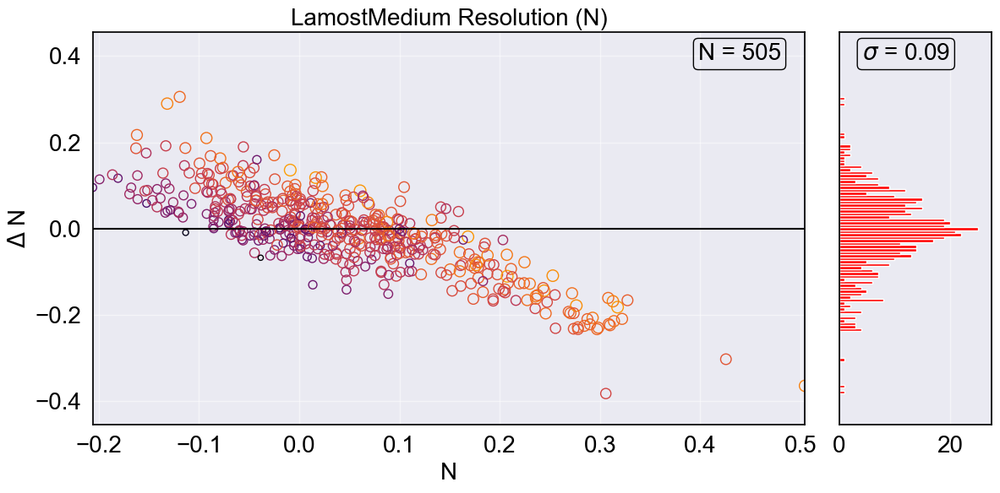

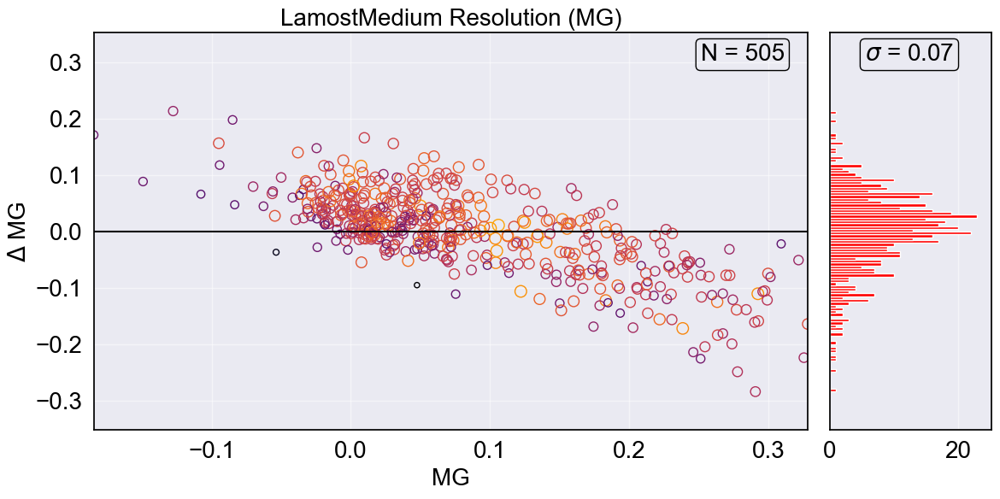

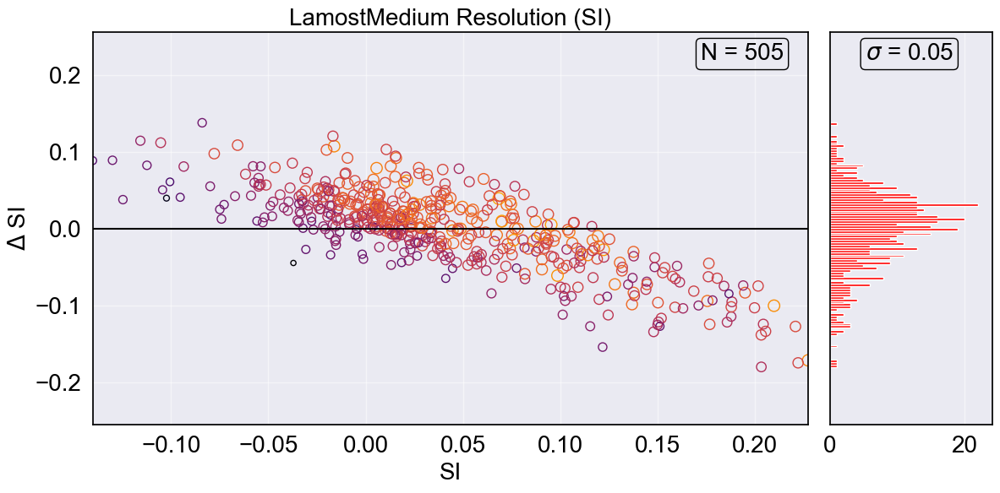

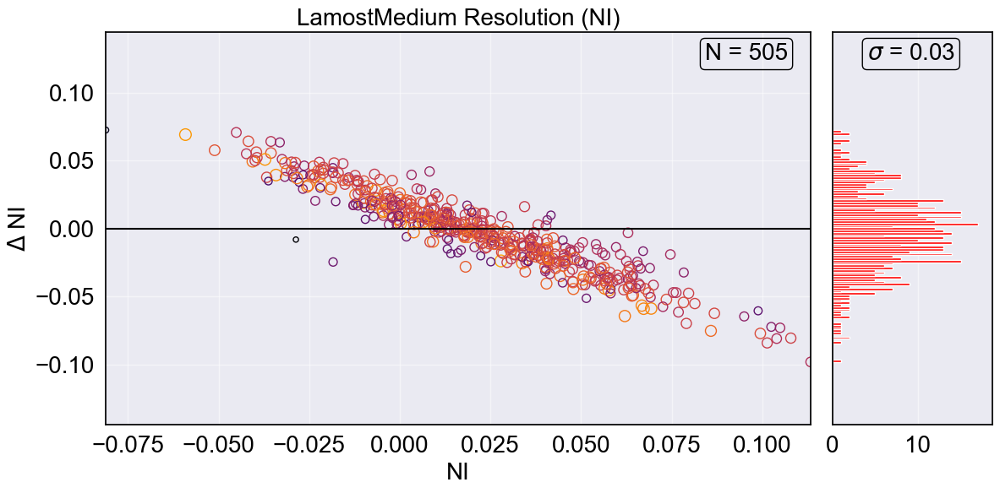

In [22]:
for i in range(len(Parametros)):
    name = names[i]
    name1 = Parametros[i]
    x = padrao[columnTrain[i]]
    y = padrao[predicts[i]]
    
    y = y - x

    qtd = padrao.shape[0]

    tamFonte = 20

    desvio = np.std(y)

    fig = plt.figure(figsize=(12, 6))

    # Define the grid spec layout
    gs = gridspec.GridSpec(1, 5)  # 1 row, 5 columns

    # Main plot (takes 4/5 of the space)
    ax = fig.add_subplot(gs[:, :4])  # Span all rows, and first 4 columns
    ax.scatter(x, y, edgecolors=plt.cm.inferno(padrao['colors']), s=(padrao['sizes']+0.2) * 100, alpha=1, marker='o', facecolors='none')
    ax.set_xlabel(f"{name}", color='black', fontsize=tamFonte)
    ax.set_ylabel(f"$\Delta$ {name}", color='black', fontsize=tamFonte)

    plt.title(f'{base_name} ({name})', color='black', fontsize=tamFonte)

    # Possiveis Mudanças
    ax.plot([-5,5], [0,0], color='black', linestyle='solid')

    Ylim = 5*desvio
    plt.xlim(x.min(), x.max())
    plt.ylim(-Ylim, Ylim)

    # Subplot on the right (takes 1/5 of the space)
    ax2 = fig.add_subplot(gs[:, 4])  # Span all rows, and the fifth column
    sla = ax2.hist(y, bins = 100, orientation='horizontal', color='red', alpha=1)
    ax2.get_yaxis().set_visible(False)

    # Possiveis Mudanças
    ax2.set_xlim(0, sla[0].max()*1.1)
    ax2.set_ylim(-Ylim, Ylim)

    ax.tick_params(axis='both', colors='black', labelsize=tamFonte)
    for spine in ax.spines.values():
        spine.set_edgecolor('black')
    ax.grid(True, alpha=0.5)

    ax2.tick_params(axis='both', colors='black', labelsize=tamFonte)
    for spine in ax2.spines.values():
        spine.set_edgecolor('black')
    ax2.grid(True, alpha=0.5)

    # Possiveis Mudanças
    ax.text(0.85, 0.93, f'N = {qtd}', transform=ax.transAxes, color='black', fontsize=tamFonte, bbox=dict(facecolor='none', edgecolor='black', boxstyle='round,pad=0.2'))
    ax2.text(1.08, 0.93, "$\sigma$ = {:.2f}".format(desvio), transform=ax.transAxes, color='black', fontsize=tamFonte, bbox=dict(facecolor='none', edgecolor='black', boxstyle='round,pad=0.2'))

    plt.tight_layout()

    # Mudar nome
    fig.savefig(f"E:\\IC\\Plots\\{NomeBase}\\{name1.replace(' ', '')}-{base_sigla}-{AouG}.png", 
                dpi = 300, bbox_inches="tight")

    plt.show()

### Giants

#### TEFF | LOGG | FEH

In [23]:
base_sigla = 'LamostMedium'
base_name = 'LamostMedium Resolution'
NomeBase = "LamostMedium"
AouG = 'Giants'

In [24]:
padrao = pd.read_csv(f"E:\\IC\\PredictsTreinos\\{NomeBase}\\{AouG}-TLFPredict.csv", index_col = 'ID')

In [25]:
padrao

,teff_cnn,logg_cnn,feh_cnn,alpha_m_cnn,c_fe,ca_fe,n_fe,mg_fe,si_fe,ni_fe,teffEncoded,TEFF_PredictDecoded,LOGG_Predict,FEH_Predict,RA,DEC
ID,,,,,,,,,,,,,,,,
iDR4_3_STRIPE82-0007_0005268,4866.55,3.016,-0.538,0.237,0.12060,0.23852,-0.05613,0.33113,0.21931,0.11422,0.063382,4923.7046,3.004309,-0.565587,3.659553,-1.226974
iDR4_3_STRIPE82-0109_0021291,4745.24,2.561,-0.297,-9999.000,-9999.00000,-9999.00000,-9999.00000,-9999.00000,-9999.00000,-9999.00000,-0.092721,4765.8203,2.604817,-0.317329,315.501852,-1.024959
iDR4_3_SPLUS-n03s43_0024745,4742.10,2.489,-0.617,0.196,0.09078,0.19912,-0.00370,0.26925,0.17952,0.10161,-0.096762,4722.4800,2.341240,-0.583151,207.325107,-2.673551
iDR4_3_SPLUS-n02n19_0008012,4996.96,2.454,-0.605,0.218,0.18539,0.19597,0.08022,0.29907,0.19921,0.08781,0.231195,4956.7603,2.568551,-0.596198,175.023540,0.890925
iDR4_3_STRIPE82-0102_0012519,4873.89,2.305,-0.496,-9999.000,-9999.00000,-9999.00000,-9999.00000,-9999.00000,-9999.00000,-9999.00000,0.072827,4879.5120,2.569371,-0.504534,310.235871,0.154517
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
iDR4_3_STRIPE82-0102_0049211,4818.44,3.230,0.301,-9999.000,-9999.00000,-9999.00000,-9999.00000,-9999.00000,-9999.00000,-9999.00000,0.001473,4833.6630,3.233342,0.287521,309.942592,0.641616
iDR4_3_STRIPE82-0101_0053700,4644.24,2.588,-0.160,-9999.000,-9999.00000,-9999.00000,-9999.00000,-9999.00000,-9999.00000,-9999.00000,-0.222689,4608.5713,2.323583,-0.254451,310.934860,-0.683472
iDR4_3_STRIPE82-0102_0067704,4725.02,2.584,-0.365,-9999.000,-9999.00000,-9999.00000,-9999.00000,-9999.00000,-9999.00000,-9999.00000,-0.118740,4705.1826,2.500417,-0.365654,311.015895,0.896488


In [26]:
scaler = MinMaxScaler(feature_range=(0, 0.8))
cores = scaler.fit_transform(np.array(padrao[["teff_cnn"]]))
padrao['colors'] = cores

In [27]:
scalersize = MinMaxScaler(feature_range=(0, 1))
sizes = scalersize.fit_transform(np.array(padrao[["logg_cnn"]]))
padrao['sizes'] = cores

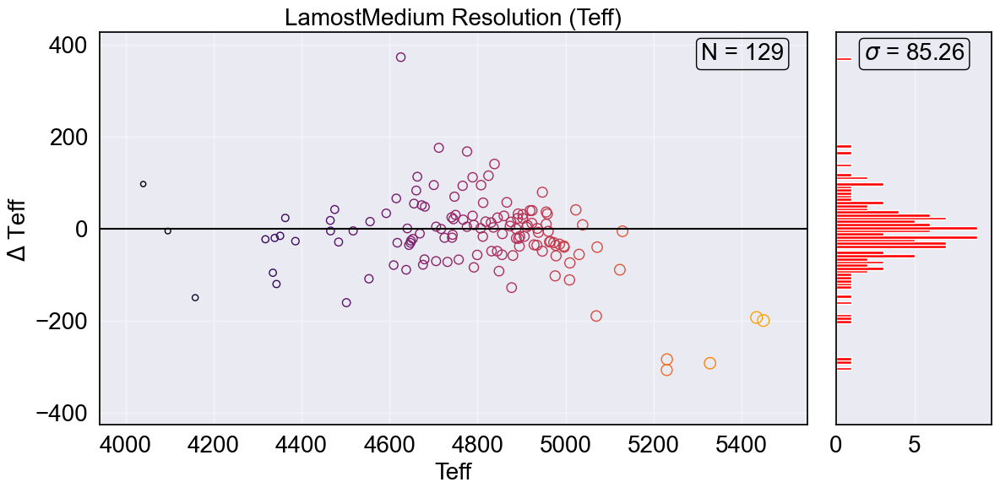

In [28]:
name = 'Teff'
x = padrao['teff_cnn']
y = padrao['TEFF_PredictDecoded']

y = y - x

qtd = padrao.shape[0]

tamFonte = 20

desvio = np.std(y)

fig = plt.figure(figsize=(12, 6))

# Define the grid spec layout
gs = gridspec.GridSpec(1, 5)  # 1 row, 5 columns

# Main plot (takes 4/5 of the space)
ax = fig.add_subplot(gs[:, :4])  # Span all rows, and first 4 columns
ax.scatter(x, y, edgecolors=plt.cm.inferno(padrao['colors']), s=(padrao['sizes']+0.2) * 100, alpha=1, marker='o', facecolors='none')
ax.set_xlabel(f"{name}", color='black', fontsize=tamFonte)
ax.set_ylabel(f"$\Delta$ {name}", color='black', fontsize=tamFonte)

plt.title(f'{base_name} ({name})', color='black', fontsize=tamFonte)

# Possiveis Mudanças
ax.plot([2000,7500], [0,0], color='black', linestyle='solid')

Ylim = 5*desvio
plt.xlim(x.min()-100, x.max()+100)
plt.ylim(-Ylim, Ylim)

# Subplot on the right (takes 1/5 of the space)
ax2 = fig.add_subplot(gs[:, 4])  # Span all rows, and the fifth column
sla = ax2.hist(y, bins = 100, orientation='horizontal', color='red', alpha=1)
ax2.get_yaxis().set_visible(False)

# Possiveis Mudanças
ax2.set_xlim(0, sla[0].max()*1.1)
ax2.set_ylim(-Ylim, Ylim)

ax.tick_params(axis='both', colors='black', labelsize=tamFonte)
for spine in ax.spines.values():
    spine.set_edgecolor('black')
ax.grid(True, alpha=0.5)

ax2.tick_params(axis='both', colors='black', labelsize=tamFonte)
for spine in ax2.spines.values():
    spine.set_edgecolor('black')
ax2.grid(True, alpha=0.5)

# Possiveis Mudanças
ax.text(0.85, 0.93, f'N = {qtd}', transform=ax.transAxes, color='black', fontsize=tamFonte, bbox=dict(facecolor='none', edgecolor='black', boxstyle='round,pad=0.2'))
ax2.text(1.08, 0.93, "$\sigma$ = {:.2f}".format(desvio), transform=ax.transAxes, color='black', fontsize=tamFonte, bbox=dict(facecolor='none', edgecolor='black', boxstyle='round,pad=0.2'))

plt.tight_layout()

# Mudar nome
fig.savefig(f"E:\\IC\\Plots\\{NomeBase}\\{name.replace(' ', '')}-{base_sigla}-{AouG}.png", 
            dpi = 300, bbox_inches="tight")

plt.show()

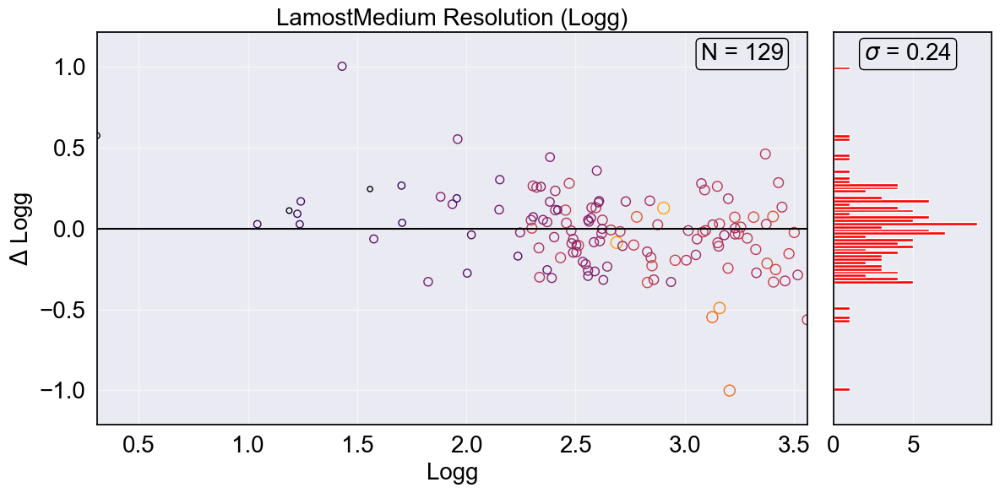

In [29]:
name = 'Logg'
x = padrao['logg_cnn']
y = padrao['LOGG_Predict']

y = y - x

qtd = padrao.shape[0]

tamFonte = 20

desvio = np.std(y)

fig = plt.figure(figsize=(12, 6))

# Define the grid spec layout
gs = gridspec.GridSpec(1, 5)  # 1 row, 5 columns

# Main plot (takes 4/5 of the space)
ax = fig.add_subplot(gs[:, :4])  # Span all rows, and first 4 columns
ax.scatter(x, y, edgecolors=plt.cm.inferno(padrao['colors']), s=(padrao['sizes']+0.2) * 100, alpha=1, marker='o', facecolors='none')
ax.set_xlabel(f"{name}", color='black', fontsize=tamFonte)
ax.set_ylabel(f"$\Delta$ {name}", color='black', fontsize=tamFonte)

plt.title(f'{base_name} ({name})', color='black', fontsize=tamFonte)

# Possiveis Mudanças
ax.plot([-5,10], [0,0], color='black', linestyle='solid')

Ylim = 5*desvio
plt.xlim(x.min(), x.max())
plt.ylim(-Ylim, Ylim)

# Subplot on the right (takes 1/5 of the space)
ax2 = fig.add_subplot(gs[:, 4])  # Span all rows, and the fifth column
sla = ax2.hist(y, bins = 100, orientation='horizontal', color='red', alpha=1)
ax2.get_yaxis().set_visible(False)

# Possiveis Mudanças
ax2.set_xlim(0, sla[0].max()*1.1)
ax2.set_ylim(-Ylim, Ylim)

ax.tick_params(axis='both', colors='black', labelsize=tamFonte)
for spine in ax.spines.values():
    spine.set_edgecolor('black')
ax.grid(True, alpha=0.5)

ax2.tick_params(axis='both', colors='black', labelsize=tamFonte)
for spine in ax2.spines.values():
    spine.set_edgecolor('black')
ax2.grid(True, alpha=0.5)

# Possiveis Mudanças
ax.text(0.85, 0.93, f'N = {qtd}', transform=ax.transAxes, color='black', fontsize=tamFonte, bbox=dict(facecolor='none', edgecolor='black', boxstyle='round,pad=0.2'))
ax2.text(1.08, 0.93, "$\sigma$ = {:.2f}".format(desvio), transform=ax.transAxes, color='black', fontsize=tamFonte, bbox=dict(facecolor='none', edgecolor='black', boxstyle='round,pad=0.2'))

plt.tight_layout()

# Mudar nome
fig.savefig(f"E:\\IC\\Plots\\{NomeBase}\\{name.replace(' ', '')}-{base_sigla}-{AouG}.png", 
            dpi = 300, bbox_inches="tight")

plt.show()

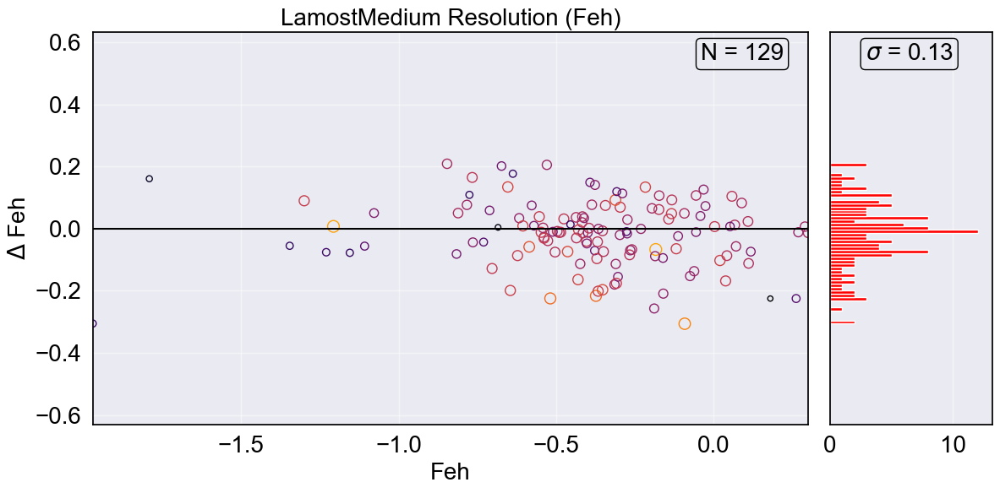

In [30]:
name = 'Feh'
x = padrao['feh_cnn']
y = padrao['FEH_Predict']

y = y - x

qtd = padrao.shape[0]

tamFonte = 20

desvio = np.std(y)

fig = plt.figure(figsize=(12, 6))

# Define the grid spec layout
gs = gridspec.GridSpec(1, 5)  # 1 row, 5 columns

# Main plot (takes 4/5 of the space)
ax = fig.add_subplot(gs[:, :4])  # Span all rows, and first 4 columns
ax.scatter(x, y, edgecolors=plt.cm.inferno(padrao['colors']), s=(padrao['sizes']+0.2) * 100, alpha=1, marker='o', facecolors='none')
ax.set_xlabel(f"{name}", color='black', fontsize=tamFonte)
ax.set_ylabel(f"$\Delta$ {name}", color='black', fontsize=tamFonte)

plt.title(f'{base_name} ({name})', color='black', fontsize=tamFonte)

# Possiveis Mudanças
ax.plot([-5,5], [0,0], color='black', linestyle='solid')

Ylim = 5*desvio
plt.xlim(x.min(), x.max())
plt.ylim(-Ylim, Ylim)

# Subplot on the right (takes 1/5 of the space)
ax2 = fig.add_subplot(gs[:, 4])  # Span all rows, and the fifth column
sla = ax2.hist(y, bins = 100, orientation='horizontal', color='red', alpha=1)
ax2.get_yaxis().set_visible(False)

# Possiveis Mudanças
ax2.set_xlim(0, sla[0].max()*1.1)
ax2.set_ylim(-Ylim, Ylim)

ax.tick_params(axis='both', colors='black', labelsize=tamFonte)
for spine in ax.spines.values():
    spine.set_edgecolor('black')
ax.grid(True, alpha=0.5)

ax2.tick_params(axis='both', colors='black', labelsize=tamFonte)
for spine in ax2.spines.values():
    spine.set_edgecolor('black')
ax2.grid(True, alpha=0.5)

# Possiveis Mudanças
ax.text(0.85, 0.93, f'N = {qtd}', transform=ax.transAxes, color='black', fontsize=tamFonte, bbox=dict(facecolor='none', edgecolor='black', boxstyle='round,pad=0.2'))
ax2.text(1.08, 0.93, "$\sigma$ = {:.2f}".format(desvio), transform=ax.transAxes, color='black', fontsize=tamFonte, bbox=dict(facecolor='none', edgecolor='black', boxstyle='round,pad=0.2'))

plt.tight_layout()

# Mudar nome
fig.savefig(f"E:\\IC\\Plots\\{NomeBase}\\{name.replace(' ', '')}-{base_sigla}-{AouG}.png", 
            dpi = 300, bbox_inches="tight")

plt.show()

#### Other Parameters

In [31]:
padrao = pd.read_csv(f"E:\\IC\\PredictsTreinos\\{NomeBase}\\{AouG}-OthersPredict.csv", index_col = 'ID')

In [32]:
padrao

,teff_cnn,logg_cnn,feh_cnn,alpha_m_cnn,c_fe,ca_fe,n_fe,mg_fe,si_fe,ni_fe,Alpha_Predict,C_Predict,CA_Predict,N_Predict,MG_Predict,SI_Predict,NI_Predict
ID,,,,,,,,,,,,,,,,,
iDR4_3_STRIPE82-0134_0032119,4484.24,2.418,0.263,0.000,0.07657,-0.02251,0.33403,0.03535,0.01072,0.05348,0.043133,0.144517,0.173031,0.268371,0.089586,0.027666,0.061631
iDR4_3_SPLUS-n01s26_0009057,4902.90,3.429,-0.132,0.118,0.13662,0.11936,0.05200,0.19804,0.08521,0.06657,0.095088,0.110726,0.070205,0.047668,0.126750,0.050581,0.044168
iDR4_3_STRIPE82-0001_0037993,4871.27,2.480,-0.401,0.151,0.09003,0.12988,0.13737,0.21114,0.14289,0.05404,0.140524,0.143545,0.164699,0.107289,0.217550,0.146516,0.064618
iDR4_3_STRIPE82-0004_0011953,4679.46,2.571,-0.402,0.196,0.14187,0.16363,0.02876,0.28254,0.18508,0.08777,0.257599,0.159163,0.207187,0.000928,0.332329,0.199694,0.090439
iDR4_3_SPLUS-n07s43_0010902,4680.26,2.608,-0.025,0.021,0.02410,0.02270,0.15338,0.05586,0.02014,0.01472,-0.004223,0.108541,0.017182,0.190889,-0.003446,-0.021520,0.005098
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
iDR4_3_SPLUS-n02s37_0050307,4929.51,3.119,-0.426,0.210,0.10118,0.22951,0.05285,0.30061,0.18840,0.09369,0.180664,0.165596,0.171807,-0.074945,0.233150,0.148848,0.090752
iDR4_3_STRIPE82-0004_0020153,4885.88,2.363,-0.517,0.199,0.16039,0.11267,0.05218,0.29352,0.18522,0.06533,0.181275,0.122449,0.144187,0.004683,0.221207,0.111809,0.068839
iDR4_3_STRIPE82-0132_0031788,4705.35,2.332,-0.292,0.155,0.14501,0.09157,0.11296,0.22066,0.15755,0.06102,0.084657,0.122727,0.073389,0.082884,0.226257,0.115608,0.059126


In [33]:
for i in padrao:
    print(i)

teff_cnn
logg_cnn
feh_cnn
alpha_m_cnn
c_fe
ca_fe
n_fe
mg_fe
si_fe
ni_fe
Alpha_Predict
C_Predict
CA_Predict
N_Predict
MG_Predict
SI_Predict
NI_Predict


In [34]:
scaler = MinMaxScaler(feature_range=(0, 0.8))
cores = scaler.fit_transform(np.array(padrao[["teff_cnn"]]))
padrao['colors'] = cores

In [35]:
scalersize = MinMaxScaler(feature_range=(0, 1))
sizes = scalersize.fit_transform(np.array(padrao[["logg_cnn"]]))
padrao['sizes'] = cores

In [36]:
names = ["H$\\alpha$", "C", "CA", "N", "MG", "SI", "NI"]
Parametros = ["Alpha", "C", "CA", "N", "MG", "SI", "NI"]
columnTrain = ['alpha_m_cnn', 'c_fe', 'ca_fe', 'n_fe', 'mg_fe', 'si_fe', 'ni_fe']
predicts = ["Alpha_Predict", "C_Predict", "CA_Predict", "N_Predict", "MG_Predict", "SI_Predict", "NI_Predict"]

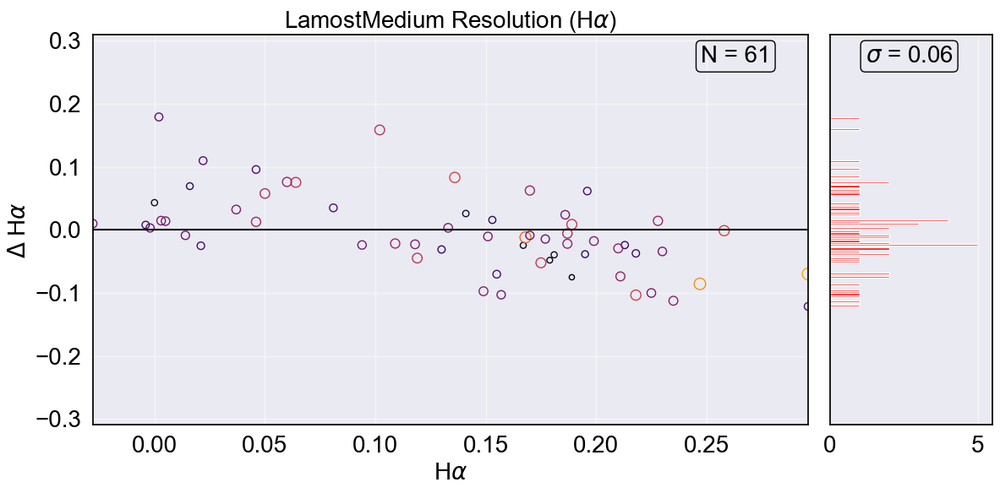

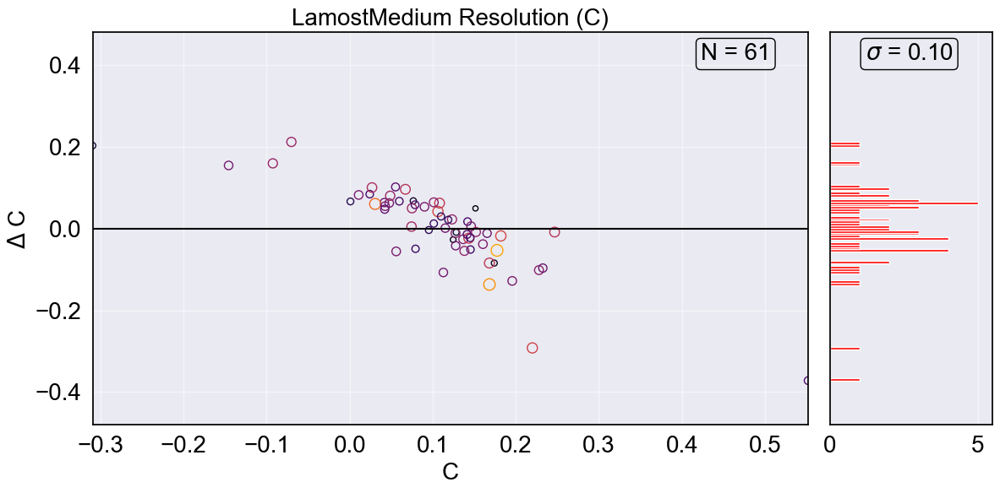

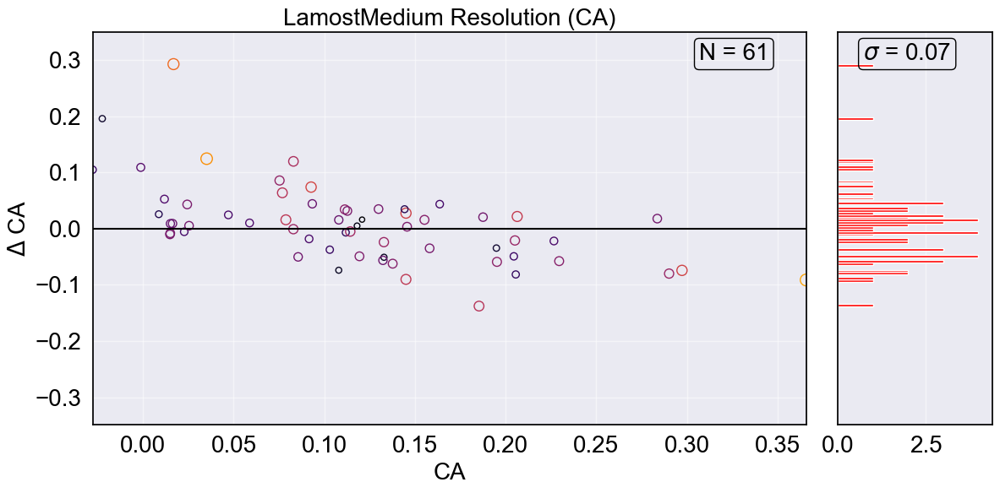

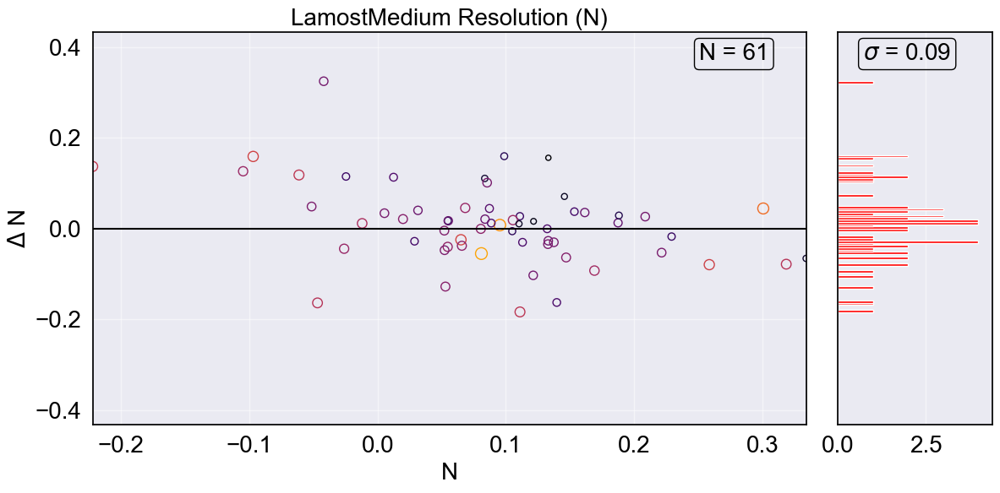

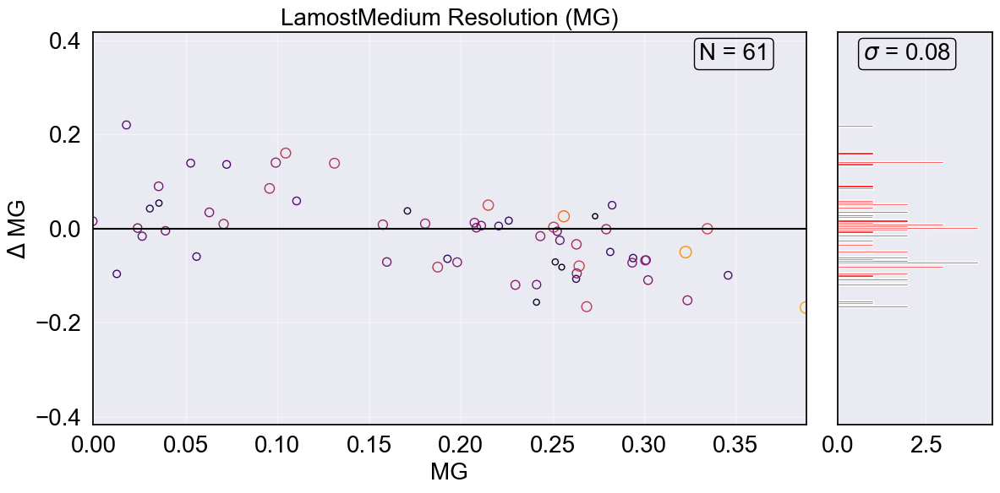

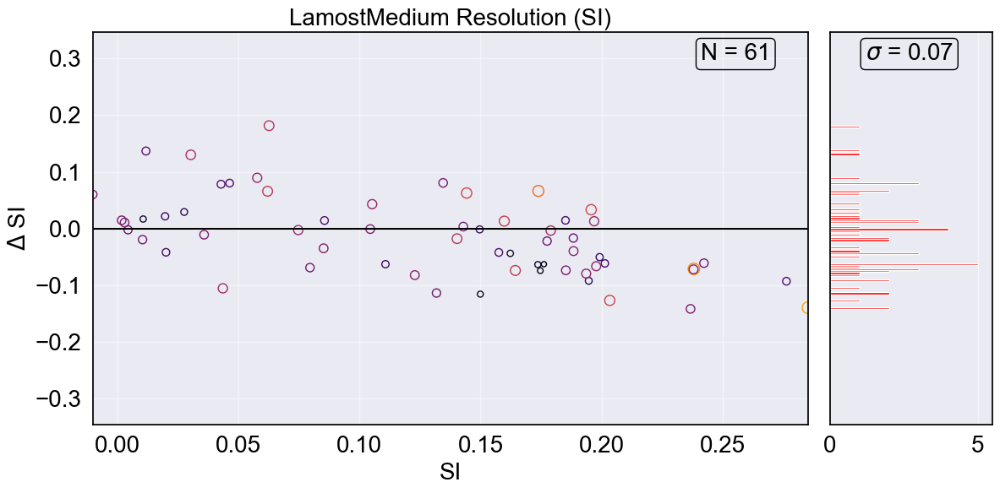

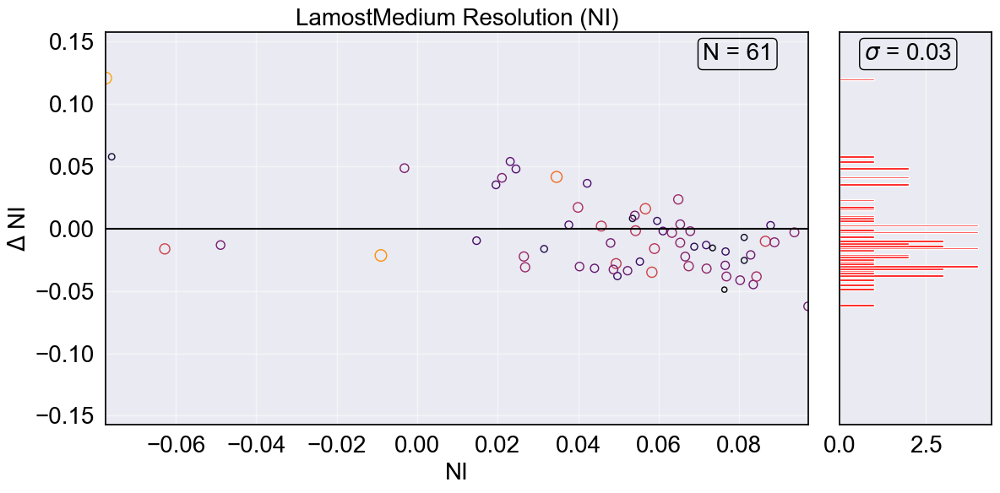

In [37]:
for i in range(len(Parametros)):
    name = names[i]
    name1 = Parametros[i]
    x = padrao[columnTrain[i]]
    y = padrao[predicts[i]]
    
    y = y - x

    qtd = padrao.shape[0]

    tamFonte = 20

    desvio = np.std(y)

    fig = plt.figure(figsize=(12, 6))

    # Define the grid spec layout
    gs = gridspec.GridSpec(1, 5)  # 1 row, 5 columns

    # Main plot (takes 4/5 of the space)
    ax = fig.add_subplot(gs[:, :4])  # Span all rows, and first 4 columns
    ax.scatter(x, y, edgecolors=plt.cm.inferno(padrao['colors']), s=(padrao['sizes']+0.2) * 100, alpha=1, marker='o', facecolors='none')
    ax.set_xlabel(f"{name}", color='black', fontsize=tamFonte)
    ax.set_ylabel(f"$\Delta$ {name}", color='black', fontsize=tamFonte)

    plt.title(f'{base_name} ({name})', color='black', fontsize=tamFonte)

    # Possiveis Mudanças
    ax.plot([-5,5], [0,0], color='black', linestyle='solid')

    Ylim = 5*desvio
    plt.xlim(x.min(), x.max())
    plt.ylim(-Ylim, Ylim)

    # Subplot on the right (takes 1/5 of the space)
    ax2 = fig.add_subplot(gs[:, 4])  # Span all rows, and the fifth column
    sla = ax2.hist(y, bins = 100, orientation='horizontal', color='red', alpha=1)
    ax2.get_yaxis().set_visible(False)

    # Possiveis Mudanças
    ax2.set_xlim(0, sla[0].max()*1.1)
    ax2.set_ylim(-Ylim, Ylim)

    ax.tick_params(axis='both', colors='black', labelsize=tamFonte)
    for spine in ax.spines.values():
        spine.set_edgecolor('black')
    ax.grid(True, alpha=0.5)

    ax2.tick_params(axis='both', colors='black', labelsize=tamFonte)
    for spine in ax2.spines.values():
        spine.set_edgecolor('black')
    ax2.grid(True, alpha=0.5)

    # Possiveis Mudanças
    ax.text(0.85, 0.93, f'N = {qtd}', transform=ax.transAxes, color='black', fontsize=tamFonte, bbox=dict(facecolor='none', edgecolor='black', boxstyle='round,pad=0.2'))
    ax2.text(1.08, 0.93, "$\sigma$ = {:.2f}".format(desvio), transform=ax.transAxes, color='black', fontsize=tamFonte, bbox=dict(facecolor='none', edgecolor='black', boxstyle='round,pad=0.2'))

    plt.tight_layout()

    # Mudar nome
    fig.savefig(f"E:\\IC\\Plots\\{NomeBase}\\{name1.replace(' ', '')}-{base_sigla}-{AouG}.png", 
                dpi = 300, bbox_inches="tight")

    plt.show()